# PROYECTO DE INVESTIGACION

# 1.- Obtencion y Almacenamiento de datos

    En esta oportunidad comenzaremos por obtener los conjuntos de datos descargados del portal EuroStat con el objetivo de almacenarlos en un objeto para que sea manipulable para nuestros objetivos de investigacion.

### 1.1.- Revision de la ruta disponible donde se encuentran los datos

In [1]:
import os
directorio_csv = r'C:\Users\user\Desktop\TesisMaster\DATOS\Datos_Eurostat'
print(f"¿Existe el directorio? {os.path.exists(directorio_csv)}")

¿Existe el directorio? True


### 1.2.- Revision de los datos disponibles descargados 

In [2]:

directorio_csv = r'C:\Users\user\Desktop\TesisMaster\DATOS\Datos_Eurostat'
print(f"Contenido del directorio: {os.listdir(directorio_csv)}")

Contenido del directorio: ['Balance Energetico.gz', 'Consumo_energia_desagregado.gz', 'Eficiencia_energetica.gz', 'Electricity_prices.gz', 'Energy_productivity.gz', 'Final_consumo_energia_hogares.gz', 'Final_consumo_energia_industria.gz', 'Final_consumo_energia_percapita.gz', 'Final_consumo_energia_producto.gz', 'Final_consumo_energia_roadtransport.gz', 'Final_consumo_energia_sector.gz', 'Final_consumo_energia_trasporte.gz', 'Gas_prices.gz', 'Impago_facturas.gz', 'Incapacidad_mantener_caliente_hogares.gz', 'Ingreso Bruto de Hogares.gz', 'Ingreso Bruto Hogares.gz', 'Ingreso Medio y Mediana Hogares.gz', 'Ingresos_Deciles.gz', 'Intensidad_energetica.gz', 'Numero de Hogares.gz', 'Numero e Hogares.gz', 'Precios_banda_electricidad.gz', 'Precios_banda_gas.gz', 'Productividad_energetica.gz', 'ratios_income.gz', 'Tamaño de hogares.gz', 'Total_supply_energy_producto.gz', 'Volumen_electricidad.gz', 'Volumen_gas.gz']


### 1.3.- Carga de Datos de la ruta especificada

In [3]:
import pandas as pd


# --- PASO 1: Define el directorio raíz ---

directorio_raiz = r'C:\Users\user\Desktop\TesisMaster\DATOS\Datos_Eurostat'

# Diccionario para almacenar cada DataFrame individual
# La clave será el nombre del archivo (sin extensión) y el valor será el DataFrame
dataframes_separados = {}

archivos_encontrados = 0
archivos_cargados = 0

print(f"Buscando y cargando archivos de datos de Eurostat por separado en: {directorio_raiz} y sus subcarpetas...\n")

# --- PASO 2: Recorre todos los directorios y subdirectorios, y carga los archivos ---
try:
    for ruta_actual, subcarpetas, archivos_en_ruta_actual in os.walk(directorio_raiz):
        for nombre_archivo_completo in archivos_en_ruta_actual:
            ruta_completa_archivo = os.path.join(ruta_actual, nombre_archivo_completo)

            # Filtramos por archivos de texto no vacíos, asumiendo que son los datos de Eurostat
            if os.path.isfile(ruta_completa_archivo) and os.path.getsize(ruta_completa_archivo) > 0:
                archivos_encontrados += 1
                print(f"Cargando '{nombre_archivo_completo}' desde: {ruta_actual}...")
                try:
                    # Extraer el nombre base del archivo para usarlo como clave en el diccionario
                    # Esto quita la extensión si la tiene (ej. 'datos.txt' -> 'datos')
                    nombre_base_archivo = os.path.splitext(nombre_archivo_completo)[0]

                    # Configuración clave para CSV 2.0 de Eurostat:
                    # 1. `sep=';'`: Delimitador de punto y coma.
                    # 2. `encoding='latin-1'`: Codificación para caracteres especiales.
                    # 3. `skiprows=5`: **SALTA LAS PRIMERAS 5 LÍNEAS DE METADATOS.**
                    #    ¡Revisa uno de tus archivos para confirmar este número!
                    #    Podría ser 4, 6 o diferente. Ajusta '5' si es necesario.
                    df_temp = pd.read_csv(ruta_completa_archivo, sep=',', encoding='latin-1'
                                          )

                    # Almacena el DataFrame en el diccionario
                    dataframes_separados[nombre_base_archivo] = df_temp
                    archivos_cargados += 1
                    print(f"  -> '{nombre_archivo_completo}' cargado exitosamente como '{nombre_base_archivo}'.")

                except pd.errors.EmptyDataError:
                    print(f"  Advertencia: '{nombre_archivo_completo}' está vacío y no se cargará.")
                except Exception as e:
                    print(f"  Error al cargar '{nombre_archivo_completo}': {e}")
            # else:
            #     print(f"  Saltando '{nombre_archivo_completo}' (no es un archivo válido o está vacío).")

except FileNotFoundError:
    print(f"Error: El directorio raíz '{directorio_raiz}' no se encontró. Por favor, verifica la ruta.")
    print("Asegúrate de que la carpeta existe y la ruta es correcta.")
except Exception as e:
    print(f"Ocurrió un error al listar el directorio: {e}")

print(f"\n--- Resumen de carga ---")
print(f"Archivos de datos de Eurostat encontrados: {archivos_encontrados}")
print(f"Archivos de datos de Eurostat cargados con éxito: {archivos_cargados}")
print(f"Total de DataFrames cargados: {len(dataframes_separados)}")


# --- PASO 3: Acceder a los DataFrames separados ---
if dataframes_separados:
    print("\n¡Archivos de datos de Eurostat cargados exitosamente en DataFrames separados!")
    print("Puedes acceder a cada DataFrame usando su nombre de archivo (sin extensión) como clave.")
    print("\nEjemplos de cómo acceder a los DataFrames y ver sus primeros datos:")

    # Mostrar las claves (nombres de los DataFrames) que se han cargado
    print(f"\nNombres de los DataFrames cargados: {list(dataframes_separados.keys())}")

    # Ejemplo de cómo acceder y trabajar con un DataFrame específico (descomenta para usar)
    # Reemplaza 'Consumo_energia_desagregado' con uno de los nombres que viste en la lista anterior
    # if 'Consumo_energia_desagregado' in dataframes_separados:
    #     df_consumo_energia = dataframes_separados['Consumo_energia_desagregado']
    #     print("\nPrimeras 5 filas del DataFrame 'Consumo_energia_desagregado':")
    #     print(df_consumo_energia.head())
    #     print("\nInformación del DataFrame 'Consumo_energia_desagregado':")
    #     df_consumo_energia.info()
    # else:
    #     print("\nEl DataFrame 'Consumo_energia_desagregado' no se cargó o no existe.")

    # Puedes iterar sobre todos los DataFrames si necesitas aplicar el mismo tratamiento a varios
    # for nombre_df, df in dataframes_separados.items():
    #     print(f"\nProcesando DataFrame: {nombre_df}")
    #     # Aquí puedes aplicar tus operaciones de limpieza y análisis específicas para cada df
    #     # df['OBS_VALUE'] = pd.to_numeric(df['OBS_VALUE'].astype(str).str.extract('([0-9\.\-]+)')[0], errors='coerce')
    #     # print(df.head())

else:
    print("\nNo se cargó ningún archivo de datos de Eurostat. Verifica el directorio y el contenido.")

Buscando y cargando archivos de datos de Eurostat por separado en: C:\Users\user\Desktop\TesisMaster\DATOS\Datos_Eurostat y sus subcarpetas...

Cargando 'Balance Energetico.gz' desde: C:\Users\user\Desktop\TesisMaster\DATOS\Datos_Eurostat...
  -> 'Balance Energetico.gz' cargado exitosamente como 'Balance Energetico'.
Cargando 'Consumo_energia_desagregado.gz' desde: C:\Users\user\Desktop\TesisMaster\DATOS\Datos_Eurostat...
  -> 'Consumo_energia_desagregado.gz' cargado exitosamente como 'Consumo_energia_desagregado'.
Cargando 'Eficiencia_energetica.gz' desde: C:\Users\user\Desktop\TesisMaster\DATOS\Datos_Eurostat...
  -> 'Eficiencia_energetica.gz' cargado exitosamente como 'Eficiencia_energetica'.
Cargando 'Electricity_prices.gz' desde: C:\Users\user\Desktop\TesisMaster\DATOS\Datos_Eurostat...
  -> 'Electricity_prices.gz' cargado exitosamente como 'Electricity_prices'.
Cargando 'Energy_productivity.gz' desde: C:\Users\user\Desktop\TesisMaster\DATOS\Datos_Eurostat...
  -> 'Energy_producti

In [4]:
dataframes_separados['Ingreso Bruto Hogares']

,DATAFLOW,LAST UPDATE,freq,unit,direct,na_item,sector,geo,TIME_PERIOD,OBS_VALUE,OBS_FLAG,CONF_STATUS
0,ESTAT:NASA_10_NF_TR(1.0),25/07/25 11:00:00,Annual,"Current prices, million euro",Paid,"Disposable income, gross",Households; non-profit institutions serving ho...,Austria,2015,204342,NaN,NaN
1,ESTAT:NASA_10_NF_TR(1.0),25/07/25 11:00:00,Annual,"Current prices, million euro",Paid,"Disposable income, gross",Households; non-profit institutions serving ho...,Austria,2016,212608,NaN,NaN
2,ESTAT:NASA_10_NF_TR(1.0),25/07/25 11:00:00,Annual,"Current prices, million euro",Paid,"Disposable income, gross",Households; non-profit institutions serving ho...,Austria,2017,218536,NaN,NaN
3,ESTAT:NASA_10_NF_TR(1.0),25/07/25 11:00:00,Annual,"Current prices, million euro",Paid,"Disposable income, gross",Households; non-profit institutions serving ho...,Austria,2018,226414,NaN,NaN
4,ESTAT:NASA_10_NF_TR(1.0),25/07/25 11:00:00,Annual,"Current prices, million euro",Paid,"Disposable income, gross",Households; non-profit institutions serving ho...,Austria,2019,231118,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1163,ESTAT:NASA_10_NF_TR(1.0),25/07/25 11:00:00,Annual,"Current prices, million units of national curr...",Received,"Disposable income, gross",Households; non-profit institutions serving ho...,United Kingdom,2015,1322128,NaN,NaN
1164,ESTAT:NASA_10_NF_TR(1.0),25/07/25 11:00:00,Annual,"Current prices, million units of national curr...",Received,"Disposable income, gross",Households; non-profit institutions serving ho...,United Kingdom,2016,1347617,NaN,NaN
1165,ESTAT:NASA_10_NF_TR(1.0),25/07/25 11:00:00,Annual,"Current prices, million units of national curr...",Received,"Disposable income, gross",Households; non-profit institutions serving ho...,United Kingdom,2017,1376243,NaN,NaN
1166,ESTAT:NASA_10_NF_TR(1.0),25/07/25 11:00:00,Annual,"Current prices, million units of national curr...",Received,"Disposable income, gross",Households; non-profit institutions serving ho...,United Kingdom,2018,1441169,NaN,NaN


# 2.- Exploracion de Datos

    En la presente seccion vamos a realizar una exploracion de datos. La exploracion de datos se centrara en el reconocimiento de las variables de los conjuntos de datos para saber cuales son las claves primarias de los data frames y decidir el tipo de procesamiento e integracion que se va a realizar. 

    De manera que lo primero que realizamos es una exploracion de las variables de cada uno de los conjuntos de datos, y posteriormente, una exploracion de la cardinalidad de las variables y el tipo de objeto de las variables de los conjuntos de datos.

In [5]:
for data in dataframes_separados:
    print(f"Las variables del conjunto de datos {data} es:\n")
    print(dataframes_separados[data].columns)
    print("=" * 100 + "\n")

Las variables del conjunto de datos Balance Energetico es:

Index(['DATAFLOW', 'LAST UPDATE', 'freq', 'nrg_bal', 'siec', 'unit', 'geo',
       'TIME_PERIOD', 'OBS_VALUE', 'OBS_FLAG', 'CONF_STATUS'],
      dtype='object')

Las variables del conjunto de datos Consumo_energia_desagregado es:

Index(['STRUCTURE', 'STRUCTURE_ID', 'STRUCTURE_NAME', 'freq', 'Time frequency',
       'nrg_bal', 'Energy balance', 'siec',
       'Standard international energy product classification (SIEC)', 'unit',
       'Unit of measure', 'geo', 'Geopolitical entity (reporting)',
       'TIME_PERIOD', 'Time', 'OBS_VALUE', 'Observation value', 'OBS_FLAG',
       'Observation status (Flag) V2 structure', 'CONF_STATUS',
       'Confidentiality status (flag)'],
      dtype='object')

Las variables del conjunto de datos Eficiencia_energetica es:

Index(['STRUCTURE', 'STRUCTURE_ID', 'STRUCTURE_NAME', 'freq', 'Time frequency',
       'nrg_bal', 'Energy balance', 'unit', 'Unit of measure', 'geo',
       'Geopolitical e

In [6]:
for name, df in dataframes_separados.items():
    print(f"Explorando valores únicos en el conjunto de datos: {name}\n")

    for column in df.columns:
        print(f"  Columna '{column}':")
        # For numerical or categorical columns, .unique() is great.
        # For columns with many unique values (like IDs), .value_counts() might be more insightful
        # if you're looking for distribution.
        print(f"    Valores únicos: {df[column].unique()}")
        print(f"    Conteo de valores: \n{df[column].value_counts().head()}") # Shows top 5 most frequent
        print("-" * 70) # Small separator for columns
    print("=" * 100 + "\n")

Explorando valores únicos en el conjunto de datos: Balance Energetico

  Columna 'DATAFLOW':
    Valores únicos: ['ESTAT:NRG_BAL_S(1.0)']
    Conteo de valores: 
DATAFLOW
ESTAT:NRG_BAL_S(1.0)    29400
Name: count, dtype: int64
----------------------------------------------------------------------
  Columna 'LAST UPDATE':
    Valores únicos: ['02/05/25 23:00:00']
    Conteo de valores: 
LAST UPDATE
02/05/25 23:00:00    29400
Name: count, dtype: int64
----------------------------------------------------------------------
  Columna 'freq':
    Valores únicos: ['Annual']
    Conteo de valores: 
freq
Annual    29400
Name: count, dtype: int64
----------------------------------------------------------------------
  Columna 'nrg_bal':
    Valores únicos: ['Exports' 'Imports' 'Primary production'
 'Recovered and recycled products' 'Change in stock']
    Conteo de valores: 
nrg_bal
Exports                            5880
Imports                            5880
Primary production                 

## 2.1.- Identificacion de las claves primarias

    Para la identificacion de la clave primaria es necesario que podamos eliminar algunas de las variables redundantes, y con ello, poder identificar cuales son los valores vinculados a los registros unicos asociados a la informacion requerida. 

In [7]:

columns_to_drop = [
    'DATAFLOW',	
    'LAST UPDATE',	
    'STRUCTURE',
    'STRUCTURE_ID',
    'STRUCTURE_NAME',
    'Geopolitical entity (reporting)',
    'freq',
    'product',
    'indic_en',
    'incgrp',
    'Time',
    'Observation value',
    'OBS_FLAG',
    'Observation status (Flag) V2 structure',
    'CONF_STATUS',
    'Confidentiality status (flag)'
]

print("Iniciando la limpieza de DataFrames...")

# First, process and clean the DataFrames by dropping the specified columns
for name, df in dataframes_separados.items():
    # Identify which columns from the 'to_drop' list actually exist in the current DataFrame
    columns_exist = [col for col in columns_to_drop if col in df.columns]

    if columns_exist:
        # Create a new DataFrame without the specified columns
        dataframes_separados[name] = df.drop(columns=columns_exist, inplace=False)
        print(f"  Columnas eliminadas del DataFrame '{name}': {columns_exist}")
    else:
        print(f"  Ninguna de las columnas a eliminar se encontró en el DataFrame '{name}'.")

    # Optionally print remaining columns to verify
    # print(f"  Nuevas columnas del DataFrame '{name}': {dataframes_separados[name].columns.tolist()}")
    # print("-" * 50)

print("\nLimpieza de DataFrames completada. Exportando a CSVs...\n")

# Define the directory where you want to save the CSV files
output_directory = 'cleaned_dataframes_csv'

# Create the directory if it doesn't already exist
os.makedirs(output_directory, exist_ok=True)

# Now, iterate through the (cleaned) dataframes and save each one to a CSV file
for name, df in dataframes_separados.items():
    # Create a clean filename from the DataFrame's name
    # e.g., 'dataset_one.csv' from 'dataset_one'
    filename = f"{name.replace(' ', '_').lower()}.csv"
    filepath = os.path.join(output_directory, filename)

    # Export the DataFrame to a CSV file
    # index=False prevents pandas from writing the DataFrame index as a column in the CSV
    df.to_csv(filepath, index=False)
    print(f"  DataFrame '{name}' exportado a: {filepath}")

print(f"\n¡Listo! Todos los DataFrames limpios han sido exportados a la carpeta '{output_directory}'.")

Iniciando la limpieza de DataFrames...
  Columnas eliminadas del DataFrame 'Balance Energetico': ['DATAFLOW', 'LAST UPDATE', 'freq', 'OBS_FLAG', 'CONF_STATUS']
  Columnas eliminadas del DataFrame 'Consumo_energia_desagregado': ['STRUCTURE', 'STRUCTURE_ID', 'STRUCTURE_NAME', 'Geopolitical entity (reporting)', 'freq', 'Time', 'Observation value', 'OBS_FLAG', 'Observation status (Flag) V2 structure', 'CONF_STATUS', 'Confidentiality status (flag)']
  Columnas eliminadas del DataFrame 'Eficiencia_energetica': ['STRUCTURE', 'STRUCTURE_ID', 'STRUCTURE_NAME', 'Geopolitical entity (reporting)', 'freq', 'Time', 'Observation value', 'OBS_FLAG', 'Observation status (Flag) V2 structure', 'CONF_STATUS', 'Confidentiality status (flag)']
  Columnas eliminadas del DataFrame 'Electricity_prices': ['STRUCTURE', 'STRUCTURE_ID', 'STRUCTURE_NAME', 'Geopolitical entity (reporting)', 'freq', 'product', 'indic_en', 'Time', 'Observation value', 'OBS_FLAG', 'Observation status (Flag) V2 structure', 'CONF_STATUS'

In [8]:
import pandas as pd
from IPython.display import display

# Datos para el cuadro resumen organizados en un diccionario
data = {
    'Base de Datos': [
        'Precios de la electricidad en EUR',
        'Volumen de consumo de electricidad por hogares',
        'Número de Hogares por tipo de hogar',
        'Incapacidad para mantener la vivienda caliente',
        'Hogares con impagos de facturas',
        'Distribución del ingreso disponible en lo hogares',
        'Intensidad Energética Final',
        'Intensidad Energética Primaria'
    ],
    'Variables Identificadoras': [
        'STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit',
        'STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit',
        'STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit',
        'STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit',
        'STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit',
        'STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit',
        'STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit',
        'STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit'
    ],
    'Variables Clasificadoras': [
        'product, nrg_cons, tax, currency',
        'nrg_cons, Energy consumption, product, Products, Unit of measure',
        'agechild, n_child, hhcomp',
        'hhtyp, Type of household, incgrp, Income situation in relation to the risk of poverty threshold, Unit of measure',
        'hhtyp, Type of household, incgrp, Income situation in relation to the risk of poverty threshold, Unit of measure',
        'quantile, indic_il, currency',
        'nrg_bal, Energy balance, Unit of measure',
        'nrg_bal, Energy balance, Unit of measure'
    ],
    'Observaciones (OBS_VALUE)': [
        'Precio (EUR) de la electricidad por bandas de consumo',
        'Porcentaje de hogares que consumen un volumen (kWh) de electricidad',
        'Número total de hogares o por tipo específico',
        'Porcentaje de hogares sin calefacción adecuada',
        'Porcentaje de hogares que no puede pagar sus facturas',
        'Proporcion del ingreso de hogares por decil',
        'Valor de la eficiencia energética (ej. consumo por PIB)',
        'Valor de la eficiencia energética (ej. consumo por PIB)'
    ],
    'Descripción': [
        'Datos brutos de los precios de la electricidad de acuerdo a las bandas de consumo.',
        'Define el porcentaje de hogares de acuerdo al volumen del consumo de la electricidad.',
        'Permite contar la cantidad de hogares en distintos niveles o tipos para la ponderación.',
        'Mide la falta de acceso a condiciones de vida adecuadas y confort térmico.',
        'Mide la dificultad de los hogares para cubrir sus gastos básicos de energía.',
        'Define el ingreso de un grupo específico de la población (los deciles) para análisis de desigualdad.',
        'Consumo de energía en relación con el rendimiento económico de la industria.',
        'Consumo de energía en relación con el rendimiento económico de la industria.'
    ]
}

# Crear el DataFrame de pandas a partir de los datos
df = pd.DataFrame(data)

def style_multiline(val):
    return val.replace('\n', '<br>') if isinstance(val, str) else val

styled_df = df.style.format({
    'Fórmula': style_multiline
}).set_properties(**{
    'white-space': 'pre-wrap',
    'font-size': '15px',
    'text-align': 'left'
}).set_table_styles([
    {'selector': 'th', 'props': [('font-size', '22px'), ('max-width', '50px')]},
    {'selector': 'td', 'props': [('max-width', '250px')]},
])

display(styled_df)

,Base de Datos,Variables Identificadoras,Variables Clasificadoras,Observaciones (OBS_VALUE),Descripción
0,Precios de la electricidad en EUR,"STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit","product, nrg_cons, tax, currency",Precio (EUR) de la electricidad por bandas de consumo,Datos brutos de los precios de la electricidad de acuerdo a las bandas de consumo.
1,Volumen de consumo de electricidad por hogares,"STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit","nrg_cons, Energy consumption, product, Products, Unit of measure",Porcentaje de hogares que consumen un volumen (kWh) de electricidad,Define el porcentaje de hogares de acuerdo al volumen del consumo de la electricidad.
2,Número de Hogares por tipo de hogar,"STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit","agechild, n_child, hhcomp",Número total de hogares o por tipo específico,Permite contar la cantidad de hogares en distintos niveles o tipos para la ponderación.
3,Incapacidad para mantener la vivienda caliente,"STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit","hhtyp, Type of household, incgrp, Income situation in relation to the risk of poverty threshold, Unit of measure",Porcentaje de hogares sin calefacción adecuada,Mide la falta de acceso a condiciones de vida adecuadas y confort térmico.
4,Hogares con impagos de facturas,"STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit","hhtyp, Type of household, incgrp, Income situation in relation to the risk of poverty threshold, Unit of measure",Porcentaje de hogares que no puede pagar sus facturas,Mide la dificultad de los hogares para cubrir sus gastos básicos de energía.
5,Distribución del ingreso disponible en lo hogares,"STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit","quantile, indic_il, currency",Proporcion del ingreso de hogares por decil,Define el ingreso de un grupo específico de la población (los deciles) para análisis de desigualdad.
6,Intensidad Energética Final,"STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit","nrg_bal, Energy balance, Unit of measure",Valor de la eficiencia energética (ej. consumo por PIB),Consumo de energía en relación con el rendimiento económico de la industria.
7,Intensidad Energética Primaria,"STRUCTURE, STRUCTURE_ID, geo, TIME_PERIOD, unit","nrg_bal, Energy balance, Unit of measure",Valor de la eficiencia energética (ej. consumo por PIB),Consumo de energía en relación con el rendimiento económico de la industria.


## Inspeccion de los data frames

Ahora bien, hemos estado manejado el conjunto de datos en su totalidad. El almacenamiento de estos en archivos csv nos permitio independizar cada uno de los conjuntos de datos sobre energia, y seleccionar aquellos que vamos a utilizar para el procesamiento destinado al analisis de la aproximacion de las circunstancias socio energeticas de la manifestacion de la pobreza energetica. En este sentido vamos a volver a obtener los datos pero independientemente. Los conjuntos de datos seran:

    - Numero de hogares
    - Volumen de energia electrica por bandas de consumo
    - Incapacidad de mantener una vivienda adecuadamente caliente
    - Impago de facturas
    - Intensidad energetica
    - Eficiencia energetica
    - Precios de electricidad
    - Ingresos en deciles
    - Ingreso bruto de hogares
    - Ingreso medio y mediana de ingreso

### Numero de hogares

In [9]:
ruta_hogares = r'C:\Users\user\Desktop\TesisMaster\SCRIPT\cleaned_dataframes_csv\numero_de_hogares.csv'

hogares = pd.read_csv(ruta_hogares)

hogares

,agechild,n_child,hhcomp,unit,geo,TIME_PERIOD,OBS_VALUE
0,Total,Total,Total,Thousand households,Austria,2015,3815.9
1,Total,Total,Total,Thousand households,Austria,2016,3864.0
2,Total,Total,Total,Thousand households,Austria,2017,3889.1
3,Total,Total,Total,Thousand households,Austria,2018,3915.5
4,Total,Total,Total,Thousand households,Austria,2019,3949.2
...,...,...,...,...,...,...,...
309,Total,Total,Total,Thousand households,United Kingdom,2015,27946.3
310,Total,Total,Total,Thousand households,United Kingdom,2016,28152.2
311,Total,Total,Total,Thousand households,United Kingdom,2017,28411.7
312,Total,Total,Total,Thousand households,United Kingdom,2018,28715.4


### Volumen de Energia

In [10]:
rutaIII = r'C:\Users\user\Desktop\TesisMaster\SCRIPT\cleaned_dataframes_csv\volumen_electricidad.csv'

volumen_electricidad = pd.read_csv(rutaIII)

volumen_electricidad

,Time frequency,nrg_cons,Energy consumption,Products,unit,Unit of measure,geo,TIME_PERIOD,OBS_VALUE
0,Annual,KWH1000-2499,Consumption from 1 000 kWh to 2 499 kWh - band DB,Electrical energy,PC,Percentage,AL,2020,0.0000
1,Annual,KWH1000-2499,Consumption from 1 000 kWh to 2 499 kWh - band DB,Electrical energy,PC,Percentage,AL,2022,74.0000
2,Annual,KWH1000-2499,Consumption from 1 000 kWh to 2 499 kWh - band DB,Electrical energy,PC,Percentage,AT,2020,16.3000
3,Annual,KWH1000-2499,Consumption from 1 000 kWh to 2 499 kWh - band DB,Electrical energy,PC,Percentage,AT,2021,16.0000
4,Annual,KWH1000-2499,Consumption from 1 000 kWh to 2 499 kWh - band DB,Electrical energy,PC,Percentage,AT,2022,15.1000
...,...,...,...,...,...,...,...,...,...
958,Annual,KWH_LT1000,Consumption less than 1 000 kWh - band DA,Electrical energy,PC,Percentage,XK,2020,2.4241
959,Annual,KWH_LT1000,Consumption less than 1 000 kWh - band DA,Electrical energy,PC,Percentage,XK,2021,2.5420
960,Annual,KWH_LT1000,Consumption less than 1 000 kWh - band DA,Electrical energy,PC,Percentage,XK,2022,2.9303
961,Annual,KWH_LT1000,Consumption less than 1 000 kWh - band DA,Electrical energy,PC,Percentage,XK,2023,3.0996


In [11]:
volumen_electricidad.isnull().sum()

Time frequency        0
nrg_cons              0
Energy consumption    0
Products              0
unit                  0
Unit of measure       0
geo                   0
TIME_PERIOD           0
OBS_VALUE             0
dtype: int64

In [12]:
filas_con_nulos = volumen_electricidad[volumen_electricidad.isnull().any(axis=1)]

print(filas_con_nulos)

Empty DataFrame
Columns: [Time frequency, nrg_cons, Energy consumption, Products, unit, Unit of measure, geo, TIME_PERIOD, OBS_VALUE]
Index: []


### Incapacidad de Mantener una Vivienda adecuadamente Caliente

In [13]:
rutaI = r'C:\Users\user\Desktop\TesisMaster\SCRIPT\cleaned_dataframes_csv\incapacidad_mantener_caliente_hogares.csv'

Incapacidad_mantener_caliente_hogares = pd.read_csv(rutaI)

Incapacidad_mantener_caliente_hogares

,Time frequency,hhtyp,Type of household,Income situation in relation to the risk of poverty threshold,unit,Unit of measure,geo,TIME_PERIOD,OBS_VALUE
0,Annual,TOTAL,Total,Above 60% of median equivalised income,PC,Percentage,AL,2017,34.4
1,Annual,TOTAL,Total,Above 60% of median equivalised income,PC,Percentage,AL,2018,29.9
2,Annual,TOTAL,Total,Above 60% of median equivalised income,PC,Percentage,AL,2019,31.7
3,Annual,TOTAL,Total,Above 60% of median equivalised income,PC,Percentage,AL,2020,29.7
4,Annual,TOTAL,Total,Above 60% of median equivalised income,PC,Percentage,AL,2021,27.8
...,...,...,...,...,...,...,...,...,...
1018,Annual,TOTAL,Total,Total,PC,Percentage,UK,2015,7.8
1019,Annual,TOTAL,Total,Total,PC,Percentage,UK,2016,6.1
1020,Annual,TOTAL,Total,Total,PC,Percentage,UK,2017,5.9
1021,Annual,TOTAL,Total,Total,PC,Percentage,UK,2018,5.4


In [14]:
Incapacidad_mantener_caliente_hogares.isnull().sum()

Time frequency                                                   0
hhtyp                                                            0
Type of household                                                0
Income situation in relation to the risk of poverty threshold    0
unit                                                             0
Unit of measure                                                  0
geo                                                              0
TIME_PERIOD                                                      0
OBS_VALUE                                                        0
dtype: int64

In [15]:
filas_con_nulos = Incapacidad_mantener_caliente_hogares[Incapacidad_mantener_caliente_hogares.isnull().any(axis=1)]

print(filas_con_nulos)

Empty DataFrame
Columns: [Time frequency, hhtyp, Type of household, Income situation in relation to the risk of poverty threshold, unit, Unit of measure, geo, TIME_PERIOD, OBS_VALUE]
Index: []


### Impago de Facturas

In [16]:
rutaII = r'C:\Users\user\Desktop\TesisMaster\SCRIPT\cleaned_dataframes_csv\impago_facturas.csv'

Impago_de_facturas = pd.read_csv(rutaII)

Impago_de_facturas

,Time frequency,hhtyp,Type of household,Income situation in relation to the risk of poverty threshold,unit,Unit of measure,geo,TIME_PERIOD,OBS_VALUE
0,Annual,A1,Single person,Above 60% of median equivalised income,PC,Percentage,AL,2020,27.5
1,Annual,A1,Single person,Above 60% of median equivalised income,PC,Percentage,AL,2021,24.6
2,Annual,A1,Single person,Above 60% of median equivalised income,PC,Percentage,AT,2020,1.4
3,Annual,A1,Single person,Above 60% of median equivalised income,PC,Percentage,AT,2021,1.3
4,Annual,A1,Single person,Above 60% of median equivalised income,PC,Percentage,AT,2022,2.3
...,...,...,...,...,...,...,...,...,...
8920,Annual,TOTAL,Total,Total,PC,Percentage,TR,2020,22.8
8921,Annual,TOTAL,Total,Total,PC,Percentage,TR,2021,24.5
8922,Annual,TOTAL,Total,Total,PC,Percentage,TR,2022,18.8
8923,Annual,TOTAL,Total,Total,PC,Percentage,TR,2023,20.0


In [17]:
Impago_de_facturas.isnull().sum()

Time frequency                                                    0
hhtyp                                                             0
Type of household                                                 0
Income situation in relation to the risk of poverty threshold     0
unit                                                              0
Unit of measure                                                   0
geo                                                               0
TIME_PERIOD                                                       0
OBS_VALUE                                                        18
dtype: int64

In [18]:
filas_con_nulos = Impago_de_facturas[Impago_de_facturas.isnull().any(axis=1)]

print(filas_con_nulos)

     Time frequency      hhtyp                             Type of household  \
796          Annual        A1F                                 Single female   
2371         Annual    A1_GE65                    One adult 65 years or over   
2382         Annual    A1_GE65                    One adult 65 years or over   
2383         Annual    A1_GE65                    One adult 65 years or over   
6481         Annual      A_GE3                          Three or more adults   
6501         Annual      A_GE3                          Three or more adults   
6502         Annual      A_GE3                          Three or more adults   
6546         Annual      A_GE3                          Three or more adults   
6550         Annual      A_GE3                          Three or more adults   
6606         Annual      A_GE3                          Three or more adults   
6607         Annual      A_GE3                          Three or more adults   
6608         Annual      A_GE3          

In [19]:
# Iteramos sobre cada columna de nuestro subconjunto 'filas_con_nulos'
for columna in filas_con_nulos.columns:
    valores_unicos = filas_con_nulos[columna].unique()
    print(f"\nValores únicos en la columna '{columna}':")
    print(valores_unicos)


Valores únicos en la columna 'Time frequency':
['Annual']

Valores únicos en la columna 'hhtyp':
['A1F' 'A1_GE65' 'A_GE3' 'A_GE3_DCH']

Valores únicos en la columna 'Type of household':
['Single female' 'One adult 65 years or over' 'Three or more adults'
 'Three or more adults with dependent children']

Valores únicos en la columna 'Income situation in relation to the risk of poverty threshold':
['Below 60% of median equivalised income']

Valores únicos en la columna 'unit':
['PC']

Valores únicos en la columna 'Unit of measure':
['Percentage']

Valores únicos en la columna 'geo':
['IS' 'LU' 'AT' 'CZ' 'FI' 'NO' 'DK']

Valores únicos en la columna 'TIME_PERIOD':
[2020 2021 2024 2022 2023]

Valores únicos en la columna 'OBS_VALUE':
[nan]


### Intensidad Energetica

In [20]:
rutaU= r'C:\Users\user\Desktop\TesisMaster\DATOS\cleaned_dataframes_csv\intensidad_energetica.csv'

Intensidad_energetica = pd.read_csv(rutaU)

Intensidad_energetica

,Energy balance,unit,Unit of measure,geo,Geopolitical entity (reporting),TIME_PERIOD,OBS_VALUE
0,Energy intensity of GDP in chain linked volume...,KGOE_TEUR,Kilograms of oil equivalent (KGOE) per thousan...,AL,Albania,2015,216.16
1,Energy intensity of GDP in chain linked volume...,KGOE_TEUR,Kilograms of oil equivalent (KGOE) per thousan...,AL,Albania,2016,217.42
2,Energy intensity of GDP in chain linked volume...,KGOE_TEUR,Kilograms of oil equivalent (KGOE) per thousan...,AL,Albania,2017,219.15
3,Energy intensity of GDP in chain linked volume...,KGOE_TEUR,Kilograms of oil equivalent (KGOE) per thousan...,AL,Albania,2018,209.44
4,Energy intensity of GDP in chain linked volume...,KGOE_TEUR,Kilograms of oil equivalent (KGOE) per thousan...,AL,Albania,2019,204.16
...,...,...,...,...,...,...,...
623,Energy intensity of GDP in purchasing power st...,KGOE_TEUR_PPS,Kilograms of oil equivalent (KGOE) per thousan...,UK,United Kingdom,2015,97.16
624,Energy intensity of GDP in purchasing power st...,KGOE_TEUR_PPS,Kilograms of oil equivalent (KGOE) per thousan...,UK,United Kingdom,2016,95.02
625,Energy intensity of GDP in purchasing power st...,KGOE_TEUR_PPS,Kilograms of oil equivalent (KGOE) per thousan...,UK,United Kingdom,2017,90.95
626,Energy intensity of GDP in purchasing power st...,KGOE_TEUR_PPS,Kilograms of oil equivalent (KGOE) per thousan...,UK,United Kingdom,2018,88.72


In [21]:
Intensidad_energetica.isnull().sum()

Energy balance                     0
unit                               0
Unit of measure                    0
geo                                0
Geopolitical entity (reporting)    0
TIME_PERIOD                        0
OBS_VALUE                          0
dtype: int64

In [22]:
filas_con_nulos = Intensidad_energetica[Intensidad_energetica.isnull().any(axis=1)]

print(filas_con_nulos)

Empty DataFrame
Columns: [Energy balance, unit, Unit of measure, geo, Geopolitical entity (reporting), TIME_PERIOD, OBS_VALUE]
Index: []


### Eficiencia Energetica

In [23]:
ruta3= r'C:\Users\user\Desktop\TesisMaster\SCRIPT\cleaned_dataframes_csv\eficiencia_energetica.csv'

eficiencia_energetica = pd.read_csv(ruta3)

eficiencia_energetica

,Time frequency,nrg_bal,Energy balance,unit,Unit of measure,geo,TIME_PERIOD,OBS_VALUE
0,Annual,FEC_EED,Final energy consumption - Energy Efficiency D...,MTOE,Million tonnes of oil equivalent,AL,2015,1.96
1,Annual,FEC_EED,Final energy consumption - Energy Efficiency D...,MTOE,Million tonnes of oil equivalent,AL,2016,1.91
2,Annual,FEC_EED,Final energy consumption - Energy Efficiency D...,MTOE,Million tonnes of oil equivalent,AL,2017,2.09
3,Annual,FEC_EED,Final energy consumption - Energy Efficiency D...,MTOE,Million tonnes of oil equivalent,AL,2018,2.14
4,Annual,FEC_EED,Final energy consumption - Energy Efficiency D...,MTOE,Million tonnes of oil equivalent,AL,2019,2.07
...,...,...,...,...,...,...,...,...
677,Annual,PEC_EED,Primary energy consumption - Energy Efficiency...,MTOE,Million tonnes of oil equivalent,XK,2019,2.62
678,Annual,PEC_EED,Primary energy consumption - Energy Efficiency...,MTOE,Million tonnes of oil equivalent,XK,2020,2.61
679,Annual,PEC_EED,Primary energy consumption - Energy Efficiency...,MTOE,Million tonnes of oil equivalent,XK,2021,2.82
680,Annual,PEC_EED,Primary energy consumption - Energy Efficiency...,MTOE,Million tonnes of oil equivalent,XK,2022,2.64


In [24]:
eficiencia_energetica.isnull().sum()

Time frequency     0
nrg_bal            0
Energy balance     0
unit               0
Unit of measure    0
geo                0
TIME_PERIOD        0
OBS_VALUE          0
dtype: int64

In [25]:
filas_con_nulos = eficiencia_energetica[eficiencia_energetica.isnull().any(axis=1)]

print(filas_con_nulos)

Empty DataFrame
Columns: [Time frequency, nrg_bal, Energy balance, unit, Unit of measure, geo, TIME_PERIOD, OBS_VALUE]
Index: []


In [26]:
# Iteramos sobre cada columna de nuestro subconjunto 'filas_con_nulos'
for columna in filas_con_nulos.columns:
    valores_unicos = filas_con_nulos[columna].unique()
    print(f"\nValores únicos en la columna '{columna}':")
    print(valores_unicos)


Valores únicos en la columna 'Time frequency':
[]

Valores únicos en la columna 'nrg_bal':
[]

Valores únicos en la columna 'Energy balance':
[]

Valores únicos en la columna 'unit':
[]

Valores únicos en la columna 'Unit of measure':
[]

Valores únicos en la columna 'geo':
[]

Valores únicos en la columna 'TIME_PERIOD':
[]

Valores únicos en la columna 'OBS_VALUE':
[]


In [27]:
resultado = filas_con_nulos[
(filas_con_nulos['unit']=='Terajoule')
]
resultado['geo'].unique()

array([], dtype=object)

### Precios de electricidad


In [28]:
ruta13= r'C:\Users\user\Desktop\TesisMaster\SCRIPT\cleaned_dataframes_csv\electricity_prices.csv'
electricity_prices= pd.read_csv(ruta13)
electricity_prices

,Time frequency,Products,currency,Currency,unit,Unit of measure,Energy indicator,geo,TIME_PERIOD,OBS_VALUE
0,Annual,Electrical energy,EUR,Euro,KWH,Kilowatt-hour,Medium size households,AL,2015,0.0812
1,Annual,Electrical energy,EUR,Euro,KWH,Kilowatt-hour,Medium size households,AL,2016,0.0824
2,Annual,Electrical energy,EUR,Euro,KWH,Kilowatt-hour,Medium size households,AL,2017,0.0844
3,Annual,Electrical energy,EUR,Euro,KWH,Kilowatt-hour,Medium size households,AL,2019,0.0920
4,Annual,Electrical energy,EUR,Euro,KWH,Kilowatt-hour,Medium size households,AL,2020,0.0922
...,...,...,...,...,...,...,...,...,...,...
783,Annual,Electrical energy,EUR,Euro,KWH,Kilowatt-hour,"Non-household, medium size consumers",XK,2020,0.0638
784,Annual,Electrical energy,EUR,Euro,KWH,Kilowatt-hour,"Non-household, medium size consumers",XK,2021,0.0635
785,Annual,Electrical energy,EUR,Euro,KWH,Kilowatt-hour,"Non-household, medium size consumers",XK,2022,0.0659
786,Annual,Electrical energy,EUR,Euro,KWH,Kilowatt-hour,"Non-household, medium size consumers",XK,2023,0.0713


In [29]:
electricity_prices.isnull().sum()

Time frequency      0
Products            0
currency            0
Currency            0
unit                0
Unit of measure     0
Energy indicator    0
geo                 0
TIME_PERIOD         0
OBS_VALUE           0
dtype: int64

In [30]:
electricity_prices['OBS_VALUE'].describe()

count    788.000000
mean       0.136450
std        0.072942
min        0.024900
25%        0.080000
50%        0.115650
75%        0.175825
max        0.455900
Name: OBS_VALUE, dtype: float64

In [31]:
filas_con_nulos = electricity_prices[electricity_prices.isnull().any(axis=1)]

print(filas_con_nulos)

Empty DataFrame
Columns: [Time frequency, Products, currency, Currency, unit, Unit of measure, Energy indicator, geo, TIME_PERIOD, OBS_VALUE]
Index: []


### Precios electricidad en banda

In [32]:
ruta13b= r'C:\Users\user\Desktop\TesisMaster\SCRIPT\cleaned_dataframes_csv\Precios_banda_electricidad.csv'
electricidad_banda_prices= pd.read_csv(ruta13b)
electricidad_banda_prices

,nrg_cons,unit,tax,currency,geo,TIME_PERIOD,OBS_VALUE
0,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2020-S1,0.0922
1,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2020-S2,0.0920
2,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2021-S1,0.0925
3,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2021-S2,0.0937
4,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2022-S1,0.0941
...,...,...,...,...,...,...,...
19657,Consumption of kWh - all bands,Kilowatt-hour,Excluding VAT and other recoverable taxes and ...,Purchasing Power Standard,TÃ¼rkiye,2022-S1,0.2987
19658,Consumption of kWh - all bands,Kilowatt-hour,Excluding VAT and other recoverable taxes and ...,Purchasing Power Standard,TÃ¼rkiye,2022-S2,0.2221
19659,Consumption of kWh - all bands,Kilowatt-hour,Excluding VAT and other recoverable taxes and ...,Purchasing Power Standard,TÃ¼rkiye,2023-S2,0.2044
19660,Consumption of kWh - all bands,Kilowatt-hour,Excluding VAT and other recoverable taxes and ...,Purchasing Power Standard,TÃ¼rkiye,2024-S1,0.1357


In [33]:
electricidad_banda_prices.isnull().sum()

nrg_cons       0
unit           0
tax            0
currency       0
geo            0
TIME_PERIOD    0
OBS_VALUE      0
dtype: int64

In [34]:
filas_con_nulos = electricidad_banda_prices[electricidad_banda_prices.isnull().any(axis=1)]

print(filas_con_nulos)

Empty DataFrame
Columns: [nrg_cons, unit, tax, currency, geo, TIME_PERIOD, OBS_VALUE]
Index: []


In [35]:
# Iteramos sobre cada columna de nuestro subconjunto 'filas_con_nulos'
for columna in filas_con_nulos.columns:
    valores_unicos = filas_con_nulos[columna].unique()
    print(f"\nValores únicos en la columna '{columna}':")
    print(valores_unicos)


Valores únicos en la columna 'nrg_cons':
[]

Valores únicos en la columna 'unit':
[]

Valores únicos en la columna 'tax':
[]

Valores únicos en la columna 'currency':
[]

Valores únicos en la columna 'geo':
[]

Valores únicos en la columna 'TIME_PERIOD':
[]

Valores únicos en la columna 'OBS_VALUE':
[]


In [36]:
# Crea una copia del DataFrame original para no modificarlo directamente
# Esto es una buena práctica para evitar efectos no deseados
electricidad_banda_prices = electricidad_banda_prices.dropna()

print("\n✅ DataFrame después de aplicar dropna():")
print(electricidad_banda_prices)


✅ DataFrame después de aplicar dropna():
                                                nrg_cons           unit  \
0      Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
1      Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
2      Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
3      Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
4      Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
...                                                  ...            ...   
19657                     Consumption of kWh - all bands  Kilowatt-hour   
19658                     Consumption of kWh - all bands  Kilowatt-hour   
19659                     Consumption of kWh - all bands  Kilowatt-hour   
19660                     Consumption of kWh - all bands  Kilowatt-hour   
19661                     Consumption of kWh - all bands  Kilowatt-hour   

                                                     tax 

### Ingresos deciles

In [37]:
rutaIn= r'C:\Users\user\Desktop\TesisMaster\SCRIPT\cleaned_dataframes_csv\Ingresos_Deciles.csv'

Ingresos_Deciles= pd.read_csv(rutaIn)

Ingresos_Deciles

,quantile,indic_il,currency,geo,TIME_PERIOD,OBS_VALUE
0,First decile,Share of national equivalised income,Euro,Albania,2017,2.0
1,First decile,Share of national equivalised income,Euro,Albania,2018,2.0
2,First decile,Share of national equivalised income,Euro,Albania,2019,2.3
3,First decile,Share of national equivalised income,Euro,Albania,2020,2.5
4,First decile,Share of national equivalised income,Euro,Albania,2021,2.7
...,...,...,...,...,...,...
6474,Ninth decile,Top cut-off point,Euro,United Kingdom,2015,41928.0
6475,Ninth decile,Top cut-off point,Euro,United Kingdom,2016,41769.0
6476,Ninth decile,Top cut-off point,Euro,United Kingdom,2017,42965.0
6477,Ninth decile,Top cut-off point,Euro,United Kingdom,2018,43922.0


In [38]:
Ingresos_Deciles['currency'].unique()

array(['Euro'], dtype=object)

In [39]:
# Convertir la tabla a un formato ancho
# Usamos 'quantile', 'geo', 'TIME_PERIOD', etc., como índice
# 'indic' se convierte en las nuevas columnas, y 'OBS_VALUE' sus valores
df_ingresos_pivot = Ingresos_Deciles.pivot_table(
    index=['quantile', 'geo', 'TIME_PERIOD', 'currency'],
    columns='indic_il',
    values='OBS_VALUE'
).reset_index()

# Renombrar las columnas para que sean más claras
df_ingresos_pivot = df_ingresos_pivot.rename(columns={
    'Share of national equivalised income': 'share_income',
    'Top cut-off point': 'top_income',
    'geo': 'Pais_ID',
    'TIME_PERIOD': 'ano'
})

# Eliminar la columna de la divisa si no es necesaria
df_ingresos_pivot = df_ingresos_pivot.drop(columns=['currency'])

print("Tabla de ingresos en formato 'ancho' (limpia):")
print(df_ingresos_pivot.head())

Tabla de ingresos en formato 'ancho' (limpia):
indic_il       quantile  Pais_ID   ano  share_income  top_income
0         Eighth decile  Albania  2017          12.9      3054.0
1         Eighth decile  Albania  2018          12.9      3323.0
2         Eighth decile  Albania  2019          12.8      3675.0
3         Eighth decile  Albania  2020          12.7      4140.0
4         Eighth decile  Albania  2021          12.8      4210.0


In [40]:
df_ingresos_pivot

indic_il,quantile,Pais_ID,ano,share_income,top_income
0,Eighth decile,Albania,2017,12.9,3054.0
1,Eighth decile,Albania,2018,12.9,3323.0
2,Eighth decile,Albania,2019,12.8,3675.0
3,Eighth decile,Albania,2020,12.7,4140.0
4,Eighth decile,Albania,2021,12.8,4210.0
...,...,...,...,...,...
3405,Third decile,TÃ¼rkiye,2024,4.3,2821.0
3406,Third decile,United Kingdom,2015,5.9,15816.0
3407,Third decile,United Kingdom,2016,6.0,15955.0
3408,Third decile,United Kingdom,2017,5.8,15777.0


In [41]:
# Agrupa por país ('geo') y año ('TIME_PERIOD') y suma el 'share_income'
verificacion_share_income = df_ingresos_pivot.groupby(['Pais_ID', 'ano'])['share_income'].sum()

print("Verificación de la suma de 'share_income' por país:")
print(verificacion_share_income)

Verificación de la suma de 'share_income' por país:
Pais_ID         ano 
Albania         2017    100.1
                2018    100.0
                2019    100.0
                2020     99.9
                2021     99.9
                        ...  
TÃ¼rkiye        2024     99.9
United Kingdom  2015    100.0
                2016     99.9
                2017    100.2
                2018    100.0
Name: share_income, Length: 341, dtype: float64


In [42]:
df_ingresos_pivot['quantile'].unique()

array(['Eighth decile', 'Fifth decile', 'First decile', 'Fourth decile',
       'Ninth decile', 'Second decile', 'Seventh decile', 'Sixth decile',
       'Tenth decile', 'Third decile'], dtype=object)

### Ingreso Bruto Hogares

In [43]:
ruta14= r'C:\Users\user\Desktop\TesisMaster\SCRIPT\cleaned_dataframes_csv\ingreso_bruto_de_hogares.csv'
Ingreso_Bruto_Hogares= pd.read_csv(ruta14)

Ingreso_Bruto_Hogares['direct'].unique()

array(['Paid', 'Received'], dtype=object)

In [44]:
Ingreso_Bruto_Hogares.isnull().sum()

unit           0
direct         0
na_item        0
sector         0
geo            0
TIME_PERIOD    0
OBS_VALUE      0
dtype: int64

In [45]:
Ingreso_Bruto_Hogares['geo'].unique()

array(['Austria', 'Belgium', 'Bulgaria', 'Switzerland', 'Cyprus',
       'Czechia', 'Germany', 'Denmark', 'Estonia', 'Greece', 'Spain',
       'Finland', 'France', 'Croatia', 'Hungary', 'Ireland', 'Italy',
       'Lithuania', 'Luxembourg', 'Latvia', 'Malta', 'Netherlands',
       'Norway', 'Poland', 'Portugal', 'Romania', 'Serbia', 'Sweden',
       'Slovenia', 'Slovakia', 'TÃ¼rkiye', 'United Kingdom'], dtype=object)

In [46]:
filas_con_nulos = Ingreso_Bruto_Hogares[Ingreso_Bruto_Hogares.isnull().any(axis=1)]

print(filas_con_nulos)

Empty DataFrame
Columns: [unit, direct, na_item, sector, geo, TIME_PERIOD, OBS_VALUE]
Index: []


### Ingreso medio y mediana de hogares

In [47]:
ruta15= r'C:\Users\user\Desktop\TesisMaster\SCRIPT\cleaned_dataframes_csv\ingreso_medio_y_mediana_hogares.csv'
Ingreso_medio= pd.read_csv(ruta15)
Ingreso_medio

,hhtyp,indic_il,unit,geo,TIME_PERIOD,OBS_VALUE
0,Single person,Median equivalised net income,Euro,Albania,2017,1545
1,Single person,Median equivalised net income,Euro,Albania,2018,1676
2,Single person,Median equivalised net income,Euro,Albania,2019,1881
3,Single person,Median equivalised net income,Euro,Albania,2020,2171
4,Single person,Median equivalised net income,Euro,Albania,2021,2359
...,...,...,...,...,...,...
3064,Total,Median equivalised net income,Purchasing power standard (PPS),United Kingdom,2015,17784
3065,Total,Median equivalised net income,Purchasing power standard (PPS),United Kingdom,2016,17296
3066,Total,Median equivalised net income,Purchasing power standard (PPS),United Kingdom,2017,18040
3067,Total,Median equivalised net income,Purchasing power standard (PPS),United Kingdom,2018,18423


In [48]:
Ingreso_medio.isnull().sum()

hhtyp          0
indic_il       0
unit           0
geo            0
TIME_PERIOD    0
OBS_VALUE      0
dtype: int64

In [49]:
filas_con_nulos = Ingreso_medio[Ingreso_medio.isnull().any(axis=1)]

print(filas_con_nulos)

Empty DataFrame
Columns: [hhtyp, indic_il, unit, geo, TIME_PERIOD, OBS_VALUE]
Index: []


### Numero Hogares

In [50]:
ruta16= r'C:\Users\user\Desktop\TesisMaster\SCRIPT\cleaned_dataframes_csv\numero_de_hogares.csv'
Numero_hogares= pd.read_csv(ruta16)
Numero_hogares

,agechild,n_child,hhcomp,unit,geo,TIME_PERIOD,OBS_VALUE
0,Total,Total,Total,Thousand households,Austria,2015,3815.9
1,Total,Total,Total,Thousand households,Austria,2016,3864.0
2,Total,Total,Total,Thousand households,Austria,2017,3889.1
3,Total,Total,Total,Thousand households,Austria,2018,3915.5
4,Total,Total,Total,Thousand households,Austria,2019,3949.2
...,...,...,...,...,...,...,...
309,Total,Total,Total,Thousand households,United Kingdom,2015,27946.3
310,Total,Total,Total,Thousand households,United Kingdom,2016,28152.2
311,Total,Total,Total,Thousand households,United Kingdom,2017,28411.7
312,Total,Total,Total,Thousand households,United Kingdom,2018,28715.4


In [51]:
Numero_hogares.isnull().sum()

agechild       0
n_child        0
hhcomp         0
unit           0
geo            0
TIME_PERIOD    0
OBS_VALUE      0
dtype: int64

In [52]:
filas_con_nulos = Numero_hogares[Numero_hogares.isnull().any(axis=1)]

print(filas_con_nulos)

Empty DataFrame
Columns: [agechild, n_child, hhcomp, unit, geo, TIME_PERIOD, OBS_VALUE]
Index: []


# 3.- Pre-procesamiento general de los datos

    El prepocesamiento general para todos los conjuntos de datos estaba destinado a unificar algunas referencias relevantes de la asociacion unica con los valores observados de los conjuntos de datos. Esto consistio en la seleccion del mismo año, la unficiacion de las referencias a los paises y la incorporacion de una variable asociando a cada uno de los paises en regiones europeas. 

## 3.1.- Seleccion del año

    Para la seleccion del año es importante destacar que la informacion de los precios por bandas de consumo se diferenciaba del resto de los conjuntos de datos porque su valor estaba en cadena de texto, y ademas, era bi-anual. De manera que selecionamos el segundo semestre de los precios, para luego convetir el objeto de la variable de string a numerico.

    Posteriormente pudimos aplicar la seleccion del año a todos los data frames incluido este conjunto de datos tranformado.

In [53]:

# -------------------------------------------------------------
# Análisis y transformación para el DataFrame de ELECTRICIDAD
# -------------------------------------------------------------

# Paso 1: Filtramos los datos de electricidad para quedarnos con el segundo semestre
electricidad_banda_prices = electricidad_banda_prices[electricidad_banda_prices['TIME_PERIOD'].str.contains('S2')]

# Paso 2: Convertimos la columna 'TIME_PERIOD' de la electricidad
electricidad_banda_prices['TIME_PERIOD'] = electricidad_banda_prices['TIME_PERIOD'].str.replace('-S2', '')
electricidad_banda_prices['TIME_PERIOD'] = electricidad_banda_prices['TIME_PERIOD'].astype(int)

print("✅ Ambos DataFrames han sido filtrados y convertidos correctamente de forma separada.")

✅ Ambos DataFrames han sido filtrados y convertidos correctamente de forma separada.


In [54]:
# Filtrar por moneda y tipo de impuestos
electricidad_banda_prices = electricidad_banda_prices[
    (electricidad_banda_prices['currency'] == 'Euro') &
    (electricidad_banda_prices['tax'] == 'All taxes and levies included')
]

In [55]:
electricidad_banda_prices

,nrg_cons,unit,tax,currency,geo,TIME_PERIOD,OBS_VALUE
1,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2020,0.0920
3,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2021,0.0937
5,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2022,0.0976
7,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2023,0.1089
9,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2024,0.1150
...,...,...,...,...,...,...,...
17574,Consumption of kWh - all bands,Kilowatt-hour,All taxes and levies included,Euro,TÃ¼rkiye,2024,0.0616
17575,Consumption of kWh - all bands,Kilowatt-hour,All taxes and levies included,Euro,Kosovo*,2021,0.0599
17577,Consumption of kWh - all bands,Kilowatt-hour,All taxes and levies included,Euro,Kosovo*,2022,0.0694
17579,Consumption of kWh - all bands,Kilowatt-hour,All taxes and levies included,Euro,Kosovo*,2023,0.0805


In [56]:
electricidad_banda_prices

,nrg_cons,unit,tax,currency,geo,TIME_PERIOD,OBS_VALUE
1,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2020,0.0920
3,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2021,0.0937
5,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2022,0.0976
7,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2023,0.1089
9,Consumption from 1 000 kWh to 2 499 kWh - band DB,Kilowatt-hour,All taxes and levies included,Euro,Albania,2024,0.1150
...,...,...,...,...,...,...,...
17574,Consumption of kWh - all bands,Kilowatt-hour,All taxes and levies included,Euro,TÃ¼rkiye,2024,0.0616
17575,Consumption of kWh - all bands,Kilowatt-hour,All taxes and levies included,Euro,Kosovo*,2021,0.0599
17577,Consumption of kWh - all bands,Kilowatt-hour,All taxes and levies included,Euro,Kosovo*,2022,0.0694
17579,Consumption of kWh - all bands,Kilowatt-hour,All taxes and levies included,Euro,Kosovo*,2023,0.0805


In [57]:
# Paso 1: Define el año que quieres seleccionar
año_a_seleccionar = 2023

# Paso 3: Realiza el filtro en cada DataFrame.
# Se usa un solo par de corchetes después del nombre de la variable.

hogares = hogares[Numero_hogares['TIME_PERIOD'] == año_a_seleccionar]

Ingreso_medio = Ingreso_medio[Ingreso_medio['TIME_PERIOD'] == año_a_seleccionar]

electricity_prices = electricity_prices[electricity_prices['TIME_PERIOD'] == año_a_seleccionar]

eficiencia_energetica = eficiencia_energetica[eficiencia_energetica['TIME_PERIOD'] == año_a_seleccionar]

Intensidad_energetica = Intensidad_energetica[Intensidad_energetica['TIME_PERIOD'] == año_a_seleccionar]

Incapacidad_mantener_caliente_hogares = Incapacidad_mantener_caliente_hogares[Incapacidad_mantener_caliente_hogares['TIME_PERIOD'] == año_a_seleccionar]

Impago_de_facturas=Impago_de_facturas[Impago_de_facturas['TIME_PERIOD']==año_a_seleccionar]

volumen_electricidad=volumen_electricidad[volumen_electricidad['TIME_PERIOD']==año_a_seleccionar]

electricidad_banda_prices=electricidad_banda_prices[electricidad_banda_prices['TIME_PERIOD']==año_a_seleccionar]

Ingresos_Deciles=Ingresos_Deciles[Ingresos_Deciles['TIME_PERIOD']==año_a_seleccionar]

Incapacidad_mantener_caliente_hogares

Impago_de_facturas

print(f"\n--- DataFrame filtrado para el año {año_a_seleccionar} ---")
print(Incapacidad_mantener_caliente_hogares['geo'].unique())



--- DataFrame filtrado para el año 2023 ---
['AT' 'BE' 'BG' 'CH' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR' 'HR'
 'HU' 'IE' 'IT' 'LT' 'LU' 'LV' 'MT' 'NL' 'NO' 'PL' 'PT' 'RO' 'RS' 'SE'
 'SI' 'SK' 'TR']


## 3.2.- Transformacion de la variable 'geo' en abreviaciones estandarizadas por el portal Eurostat

In [58]:

# 1. Definimos los DataFrames que queremos modificar en una lista
# Asegúrate de que estas variables de DataFrame existan en tu entorno
dataframes_a_modificar = [
    Ingreso_Bruto_Hogares,
    Ingreso_medio,
    hogares,
    electricidad_banda_prices,
    Ingresos_Deciles
]

# 2. Crea el diccionario de mapeo
# Usamos un diccionario para emparejar cada nombre de país con su código ISO.
# Los valores se basan en las listas que proporcionaste.
mapeo_paises_iso = {
    'Albania': 'AL',
    'Austria': 'AT',
    'Bosnia and Herzegovina': 'BA',
    'Belgium': 'BE',
    'Bulgaria': 'BG',
    'Cyprus': 'CY',
    'Czechia': 'CZ',
    'Germany': 'DE',
    'Denmark': 'DK',
    'Estonia': 'EE',
    'Greece': 'EL',
    'Spain': 'ES',
    'Finland': 'FI',
    'France': 'FR',
    'Georgia': 'GE',
    'Croatia': 'HR',
    'Hungary': 'HU',
    'Ireland': 'IE',
    'Iceland': 'IS', # Nota: El código ISO de Islandia es IS, el de Italia es IT.
    'Italy': 'IT', # Usamos IT para Italia según tu lista.
    'Lithuania': 'LT',
    'Luxembourg': 'LU',
    'Latvia': 'LV',
    'Moldova': 'MD',
    'Montenegro': 'ME',
    'North Macedonia': 'MK',
    'Malta': 'MT',
    'Netherlands': 'NL',
    'Norway': 'NO',
    'Poland': 'PL',
    'Portugal': 'PT',
    'Romania': 'RO',
    'Serbia': 'RS',
    'Sweden': 'SE',
    'Switzerland':'SZ',
    'Slovenia': 'SI',
    'Slovakia': 'SK',
    'TÃ¼rkiye': 'TR',
    'Ukraine': 'UA',
    'United Kingdom': 'UK',
    'Kosovo*': 'XK'
}

# 3. Itera sobre cada DataFrame y aplica el reemplazo
for i, df in enumerate(dataframes_a_modificar):
    # Usamos .replace() para sustituir los nombres por sus códigos ISO en la columna 'geo'
    df['geo'] = df['geo'].replace(mapeo_paises_iso)
    print(f"✅ DataFrame en la posición {i} actualizado. Valores de 'geo' reemplazados.")

# Opcional: Muestra una vista previa de uno de los DataFrames modificados
# para confirmar que el cambio se realizó correctamente.
print("\n--- Vista previa del DataFrame 'Ingreso Bruto Hogares' después de la modificación ---")
print(Ingreso_Bruto_Hogares['geo'].unique())

✅ DataFrame en la posición 0 actualizado. Valores de 'geo' reemplazados.
✅ DataFrame en la posición 1 actualizado. Valores de 'geo' reemplazados.
✅ DataFrame en la posición 2 actualizado. Valores de 'geo' reemplazados.
✅ DataFrame en la posición 3 actualizado. Valores de 'geo' reemplazados.
✅ DataFrame en la posición 4 actualizado. Valores de 'geo' reemplazados.

--- Vista previa del DataFrame 'Ingreso Bruto Hogares' después de la modificación ---
['AT' 'BE' 'BG' 'SZ' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR' 'HR'
 'HU' 'IE' 'IT' 'LT' 'LU' 'LV' 'MT' 'NL' 'NO' 'PL' 'PT' 'RO' 'RS' 'SE'
 'SI' 'SK' 'TR' 'UK']


C:\Users\user\AppData\Local\Temp\ipykernel_17112\1433617669.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['geo'] = df['geo'].replace(mapeo_paises_iso)


In [59]:
# Define la lista de DataFrames a modificar (ajusta esta lista según tus variables)
dataframes_a_modificar = [
    Ingreso_Bruto_Hogares,
    Ingreso_medio,
    hogares,
    electricidad_banda_prices,
    Ingresos_Deciles,
    Incapacidad_mantener_caliente_hogares,
    Impago_de_facturas
]

# 1. Definimos los elementos a eliminar, ahora incluyendo 'Switzerland'
elementos_a_eliminar = [
    'Euro area â\x80\x93 20 countries (from 2023)',
    'EU27_2020',
    'EA20:Euro area â\x80\x93 20 countries (from 2023)',
    'European Union - 27 countries (from 2020)',
    'EA20:Euro area – 20 countries (from 2023)',
    'EA20',
    'EU27_2020'
    'RS',
    'TR'
    
]

# 2. Iteramos sobre cada DataFrame para aplicar los cambios
for i, df in enumerate(dataframes_a_modificar):
    # Verificación de seguridad
    if 'geo' not in df.columns:
        print(f"❌ La columna 'geo' no se encontró en el DataFrame de la posición {i}. Se omite.")
        continue

    # Eliminamos las filas con los elementos no deseados, incluyendo 'Switzerland'
    df_limpio = df[~df['geo'].isin(elementos_a_eliminar)].copy()
    
    # Actualizamos el DataFrame original en la lista con la versión limpia
    dataframes_a_modificar[i] = df_limpio

    print(f"✅ DataFrame de la posición {i} procesado: filas eliminadas.")

# Opcional: inspecciona los valores únicos para confirmar que los cambios se aplicaron
print("\n--- Verificación final de valores únicos en la columna 'geo' ---")
for i, df in enumerate(dataframes_a_modificar):
    if 'geo' in df.columns:
        valores_restantes = df['geo'].unique()
        print(f"DataFrame de la posición {i}: {valores_restantes}")

✅ DataFrame de la posición 0 procesado: filas eliminadas.
✅ DataFrame de la posición 1 procesado: filas eliminadas.
✅ DataFrame de la posición 2 procesado: filas eliminadas.
✅ DataFrame de la posición 3 procesado: filas eliminadas.
✅ DataFrame de la posición 4 procesado: filas eliminadas.
✅ DataFrame de la posición 5 procesado: filas eliminadas.
✅ DataFrame de la posición 6 procesado: filas eliminadas.

--- Verificación final de valores únicos en la columna 'geo' ---
DataFrame de la posición 0: ['AT' 'BE' 'BG' 'SZ' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR' 'HR'
 'HU' 'IE' 'IT' 'LT' 'LU' 'LV' 'MT' 'NL' 'NO' 'PL' 'PT' 'RO' 'RS' 'SE'
 'SI' 'SK' 'UK']
DataFrame de la posición 1: ['AT' 'BE' 'BG' 'SZ' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR' 'HR'
 'HU' 'IE' 'IT' 'LT' 'LU' 'LV' 'MT' 'NL' 'NO' 'PL' 'PT' 'RO' 'RS' 'SE'
 'SI' 'SK']
DataFrame de la posición 2: ['AT' 'BA' 'BE' 'BG' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR' 'HR'
 'HU' 'IE' 'IT' 'LT' 'LU' 'LV' 'MT' 'NL' 'NO' 'PL' 'PT' 'RO'

## 3.3.- Insercion de las regiones en los data frames

In [60]:
# El diccionario de mapeo que creamos anteriormente
paises_y_regiones_geo_keys = {
    'DE': {'Region': 'Europa Occidental y Central'},
    'AT': {'Region': 'Europa Occidental y Central'},
    'BE': {'Region': 'Europa Occidental y Central'},
    'DK': {'Region': 'Países Nórdicos'},
    'ES': {'Region': 'Países Mediterráneos'},
    'FI': {'Region': 'Países Nórdicos'},
    'FR': {'Region': 'Europa Occidental y Central'},
    'NL': {'Region': 'Europa Occidental y Central'},
    'IE': {'Region': 'Europa Occidental y Central'},
    'IT': {'Region': 'Países Mediterráneos'},
    'LU': {'Region': 'Europa Occidental y Central'},
    'NO': {'Region': 'Países Nórdicos'},
    'PT': {'Region': 'Países Mediterráneos'},
    'SE': {'Region': 'Países Nórdicos'},
    'UK': {'Region': 'Europa Occidental y Central'},
    'BG': {'Region': 'Países Balcánicos / Sudeste de Europa'},
    'HR': {'Region': 'Países Balcánicos / Sudeste de Europa'},
    'SK': {'Region': 'Países de Europa Central y Oriental'},
    'SI': {'Region': 'Países Balcánicos / Sudeste de Europa'},
    'EE': {'Region': 'Países de Europa Central y Oriental'},
    'HU': {'Region': 'Países de Europa Central y Oriental'},
    'LV': {'Region': 'Países de Europa Central y Oriental'},
    'LT': {'Region': 'Países de Europa Central y Oriental'},
    'PL': {'Region': 'Países de Europa Central y Oriental'},
    'CZ': {'Region': 'Países de Europa Central y Oriental'},
    'RO': {'Region': 'Países Balcánicos / Sudeste de Europa'},
    'CY': {'Region': 'Países Mediterráneos'},
    'EL': {'Region': 'Países Mediterráneos'},
    'MT': {'Region': 'Países Mediterráneos'},
    'UK':{'Region': 'Europa Occidental y Central'}

}

# 1. Creamos una lista con todos los DataFrames que quieres modificar
lista_de_dataframes = [
    hogares,
    Ingreso_medio,
    Ingreso_Bruto_Hogares,
    electricidad_banda_prices,
    eficiencia_energetica,
    Intensidad_energetica,
    Incapacidad_mantener_caliente_hogares,
    Impago_de_facturas,
    volumen_electricidad,
    Ingresos_Deciles,

]

# 2. Iteramos sobre cada DataFrame y añadimos la nueva columna
for i, df in enumerate(lista_de_dataframes):
    # Verificamos si la columna 'geo' y el diccionario existen
    if 'geo' in df.columns:
        # Añadimos la columna 'Region' mapeando 'geo' al diccionario.
        # Esto busca el valor de 'geo' y añade el valor de 'Region' del diccionario.
        df['Region'] = df['geo'].map(
            {geo_key: data['Region'] for geo_key, data in paises_y_regiones_geo_keys.items()}
        )
        print(f"✅ Columna 'Region' añadida al DataFrame en la posición {i}.")
    else:
        print(f"❌ La columna 'geo' no se encontró en el DataFrame en la posición {i}. No se pudo añadir la región.")

# Opcional: inspecciona uno de los DataFrames para verificar el cambio
print("\n--- Vista previa del DataFrame 'Numero_hogares' con la nueva columna 'Region' ---")
print(Impago_de_facturas['geo'].unique())

✅ Columna 'Region' añadida al DataFrame en la posición 0.
✅ Columna 'Region' añadida al DataFrame en la posición 1.
✅ Columna 'Region' añadida al DataFrame en la posición 2.
✅ Columna 'Region' añadida al DataFrame en la posición 3.
✅ Columna 'Region' añadida al DataFrame en la posición 4.
✅ Columna 'Region' añadida al DataFrame en la posición 5.
✅ Columna 'Region' añadida al DataFrame en la posición 6.
✅ Columna 'Region' añadida al DataFrame en la posición 7.
✅ Columna 'Region' añadida al DataFrame en la posición 8.
✅ Columna 'Region' añadida al DataFrame en la posición 9.

--- Vista previa del DataFrame 'Numero_hogares' con la nueva columna 'Region' ---
['AT' 'BE' 'BG' 'CH' 'CY' 'CZ' 'DE' 'DK' 'EA20' 'EE' 'EL' 'ES' 'EU27_2020'
 'FI' 'FR' 'HR' 'HU' 'IE' 'IT' 'LT' 'LU' 'LV' 'MT' 'NL' 'NO' 'PL' 'PT'
 'RO' 'RS' 'SE' 'SI' 'SK' 'TR']


C:\Users\user\AppData\Local\Temp\ipykernel_17112\1860232691.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Region'] = df['geo'].map(
C:\Users\user\AppData\Local\Temp\ipykernel_17112\1860232691.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Region'] = df['geo'].map(
C:\Users\user\AppData\Local\Temp\ipykernel_17112\1860232691.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

# 4. Tratamiento de los Indicadores de Pobreza Energetica

## 4.1. Analisis Impago de Facturas

In [61]:
Impago_de_facturas['geo'].unique()

array(['AT', 'BE', 'BG', 'CH', 'CY', 'CZ', 'DE', 'DK', 'EA20', 'EE', 'EL',
       'ES', 'EU27_2020', 'FI', 'FR', 'HR', 'HU', 'IE', 'IT', 'LT', 'LU',
       'LV', 'MT', 'NL', 'NO', 'PL', 'PT', 'RO', 'RS', 'SE', 'SI', 'SK',
       'TR'], dtype=object)

#### 4.1.1.- Inspeccionaremos nuevamente los valores unicos de las variables

La inspeccion de los valores unicos de las variables nos permitira identificar aquellos valores asociados a los valores observados que nos interesa.

In [62]:
for column in Impago_de_facturas.columns:
    unique_values = Impago_de_facturas[column].unique()
    print(f"Valores únicos en la columna '{column}':")
    print(unique_values)
    print("---------------------------------------")

Valores únicos en la columna 'Time frequency':
['Annual']
---------------------------------------
Valores únicos en la columna 'hhtyp':
['A1' 'A1F' 'A1M' 'A1_DCH' 'A1_GE65' 'A1_LT65' 'A2' 'A2_1DCH' 'A2_2DCH'
 'A2_2LT65' 'A2_GE1_GE65' 'A2_GE3DCH' 'A_GE3' 'A_GE3_DCH' 'HH_DCH'
 'HH_NDCH' 'TOTAL']
---------------------------------------
Valores únicos en la columna 'Type of household':
['Single person' 'Single female' 'Single male'
 'Single person with dependent children' 'One adult 65 years or over'
 'One adult younger than 65 years' 'Two adults'
 'Two adults with one dependent child'
 'Two adults with two dependent children'
 'Two adults younger than 65 years'
 'Two adults, at least one aged 65 years or over'
 'Two adults with three or more dependent children' 'Three or more adults'
 'Three or more adults with dependent children'
 'Households with dependent children'
 'Households without dependent children' 'Total']
---------------------------------------
Valores únicos en la columna 'In

#### 4.1.2.- Aplicamos el filtro de las variaciones totales para el impago de facturas tanto en el tipo de hogar como en la situacion de ingreso en relacion al riesgo de umbral de pobreza

In [63]:
import numpy as np

# ASUME que tienes un DataFrame llamado 'df_analisis' con los datos que mostraste.
# Si tu DataFrame se llama diferente, cambia el nombre aquí.
df_analisis = Impago_de_facturas

# 1. Filtramos el DataFrame para el análisis.
# Nos centramos en los valores totales para el año 2021.
# Asegúrate de que tu DataFrame contenga las columnas 'TIME_PERIOD', 'Type of household' y 'Income situation in relation to the risk of poverty threshold'.
df_filtrado_analisis = df_analisis[
    (df_analisis['Type of household'] == 'Total') &
    (df_analisis['Income situation in relation to the risk of poverty threshold'] == 'Total')
].copy()

# Opcional: eliminar filas con valores NaN en 'OBS_VALUE'
df_filtrado_analisis.dropna(subset=['OBS_VALUE'], inplace=True)


# 2. Agrupamos los datos por la columna 'Region' y mostramos los resultados.
print("--- Porcentaje de impago de facturas por país, agrupado por región (2021) ---")

# Ordenamos el DataFrame por la región para que los resultados estén juntos
# y por el porcentaje de impago para ver los valores más altos primero.
df_filtrado_analisis = df_filtrado_analisis.sort_values(by=['Region', 'OBS_VALUE'], ascending=[True, False])

# Usamos .groupby() para iterar sobre cada grupo de la región
for region, grupo_df in df_filtrado_analisis.groupby('Region'):
    print(f"\n--- 🗺️ Región: {region} ---")
    
    # Mostramos los resultados de los países dentro de esta región
    resultados_por_pais = grupo_df[['geo','TIME_PERIOD','Income situation in relation to the risk of poverty threshold','Type of household', 'OBS_VALUE']].set_index('geo')
    print(resultados_por_pais)

--- Porcentaje de impago de facturas por país, agrupado por región (2021) ---

--- 🗺️ Región: Europa Occidental y Central ---
     TIME_PERIOD  \
geo                
IE          2023   
FR          2023   
AT          2023   
DE          2023   
LU          2023   
BE          2023   
NL          2023   

    Income situation in relation to the risk of poverty threshold  \
geo                                                                 
IE                                               Total              
FR                                               Total              
AT                                               Total              
DE                                               Total              
LU                                               Total              
BE                                               Total              
NL                                               Total              

    Type of household  OBS_VALUE  
geo                               
I

### 4.1.3.- Visualizacion del porcentaje de impago de facturas 

    La ventaja de manejar este indicador es que no requiere de calculos especiales porque la informacion se encuentra procesada mostrando el porcentaje de hogares con impago de facturas por pais, o el porcentaje de impago segun su situacion de ingreso conrespecto a la mediana del pais. De manera que la visualizacion nos va a permitir conocer el indicador que buscamos.

#### Visualizacion del porcentaje de impago de facturas con respecto a los paises sin considerar las variaciones en la situacion de ingreso con respecto a la mediana del pais y el riesgo a la pobreza

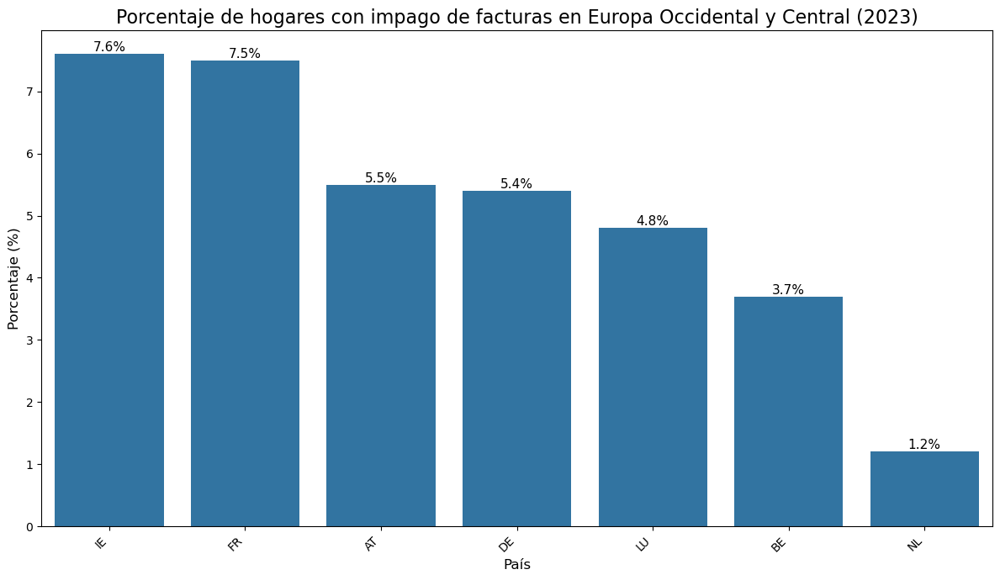

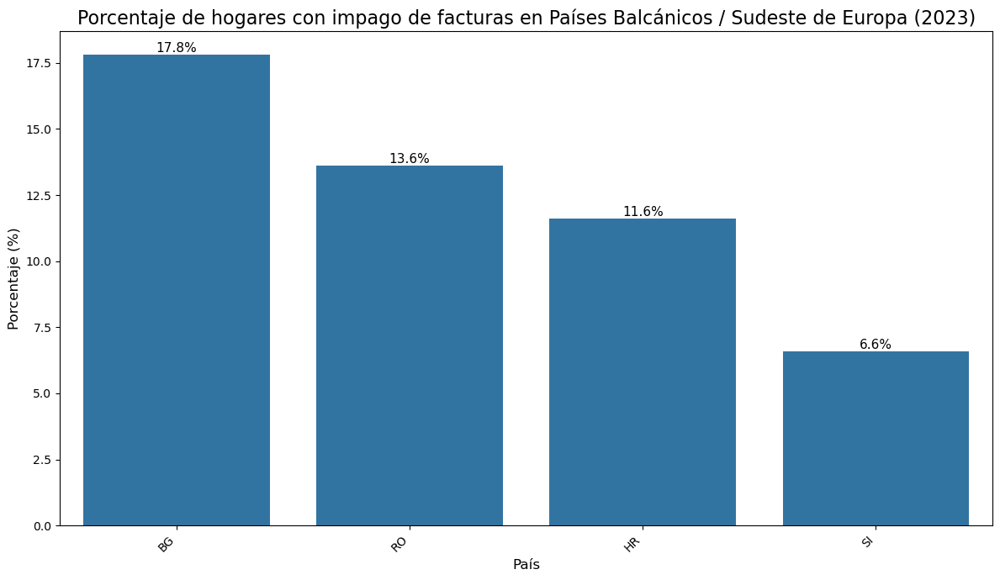

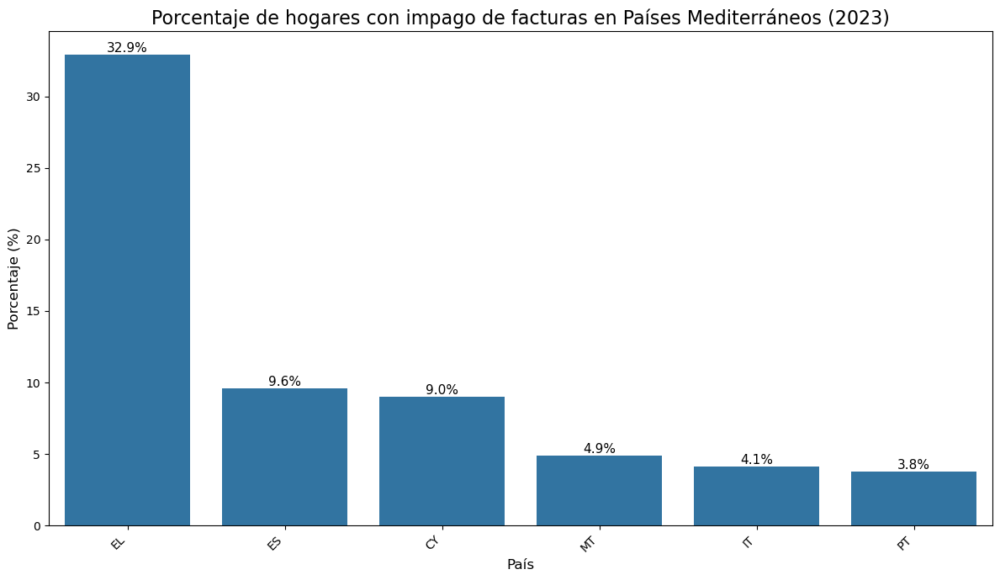

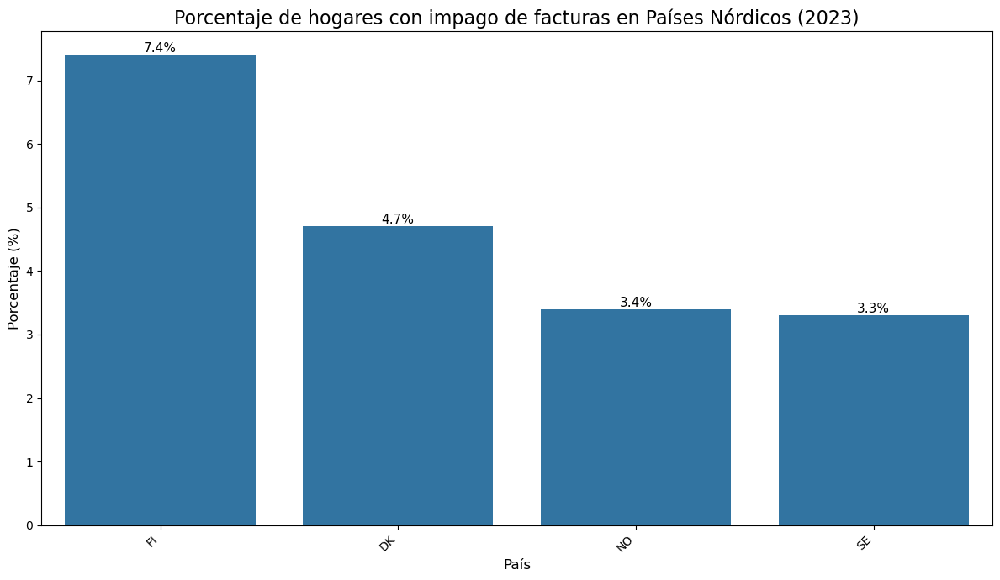

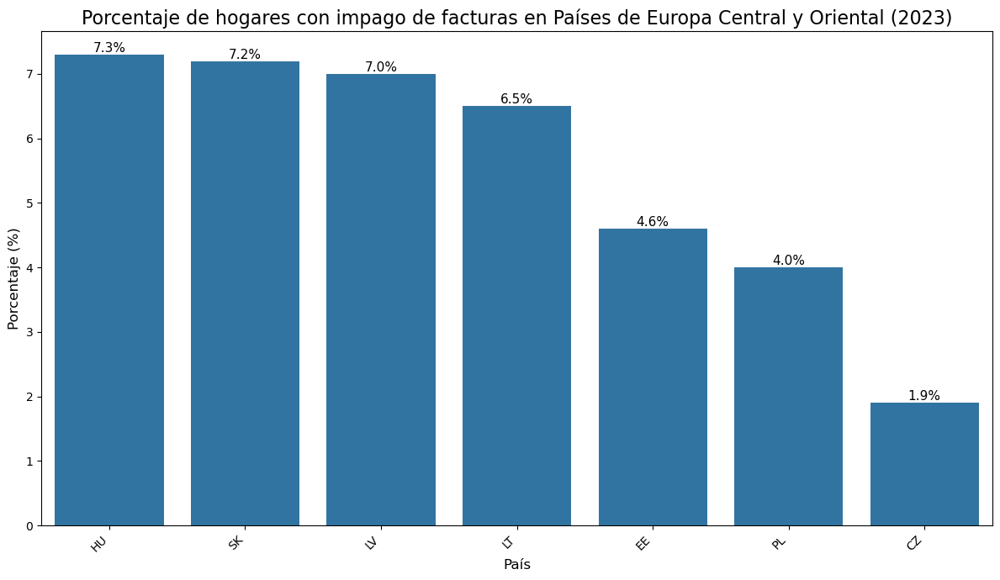

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns

# Suponiendo que df_filtrado_analisis es tu DataFrame filtrado
# Si tu DataFrame tiene otro nombre, cámbialo aquí.

# Ordenamos el DataFrame para que los gráficos tengan un orden lógico
df_filtrado_analisis = df_filtrado_analisis.sort_values(by=['Region', 'OBS_VALUE'], ascending=[True, False])

# Usamos .groupby() para iterar sobre cada grupo de región
for region, grupo_df in df_filtrado_analisis.groupby('Region'):
    
    # Creamos una figura y un eje para el gráfico
    plt.figure(figsize=(12, 7))
    
    # Creamos el gráfico de barras con seaborn y guardamos el eje en la variable 'ax'
    ax = sns.barplot(data=grupo_df, x='geo', y='OBS_VALUE', color='#1f77b4')
    
    # Agregamos los porcentajes encima de cada barra
    for p in ax.patches:
        # p.get_height() obtiene el valor de la barra
        # p.get_x() + p.get_width() / 2. coloca el texto en el centro de la barra
        ax.text(p.get_x() + p.get_width() / 2.,
                p.get_height(),
                f'{p.get_height():.1f}%', # Formatea el número a un decimal y añade un %
                ha='center', va='bottom', fontsize=11, color='black')

    # Configuramos el título y las etiquetas para que sean claros
    plt.title(f'Porcentaje de hogares con impago de facturas en {region} (2023)', fontsize=16)
    plt.xlabel('País', fontsize=12)
    plt.ylabel('Porcentaje (%)', fontsize=12)
    
    # Giramos las etiquetas del eje x para que no se superpongan
    plt.xticks(rotation=45, ha='right')
    
    # Aseguramos que el diseño se ajuste bien y mostramos el gráfico
    plt.tight_layout()
    plt.show()

In [65]:
print(df_filtrado_analisis['geo'].unique())
# Corrected code to filter out 'EA20' and 'EU27_2020'
df_filtrado_analisis = df_filtrado_analisis[
    ~df_filtrado_analisis['geo'].isin(['EA20', 'EU27_2020','TR','RS', 'CH'])
]

print("\nAfter correction:")
print(df_filtrado_analisis['geo'].unique())

['IE' 'FR' 'AT' 'DE' 'LU' 'BE' 'NL' 'BG' 'RO' 'HR' 'SI' 'EL' 'ES' 'CY'
 'MT' 'IT' 'PT' 'FI' 'DK' 'NO' 'SE' 'HU' 'SK' 'LV' 'LT' 'EE' 'PL' 'CZ'
 'TR' 'RS' 'EA20' 'EU27_2020' 'CH']

After correction:
['IE' 'FR' 'AT' 'DE' 'LU' 'BE' 'NL' 'BG' 'RO' 'HR' 'SI' 'EL' 'ES' 'CY'
 'MT' 'IT' 'PT' 'FI' 'DK' 'NO' 'SE' 'HU' 'SK' 'LV' 'LT' 'EE' 'PL' 'CZ']


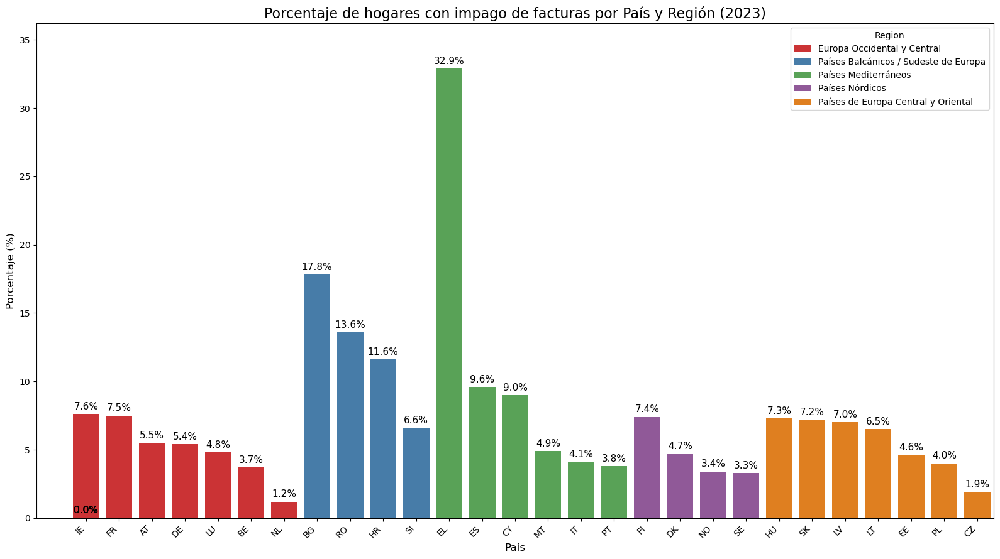

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

# Suponiendo que df_filtrado_analisis es tu DataFrame filtrado
# Ordenamos el DataFrame para que los gráficos tengan un orden lógico
df_filtrado_analisis = df_filtrado_analisis.sort_values(by=['Region', 'OBS_VALUE'], ascending=[True, False])

# Creamos una figura y un eje para el gráfico
plt.figure(figsize=(16, 9))

# Creamos un solo gráfico de barras.
ax = sns.barplot(
    data=df_filtrado_analisis,
    x='geo',
    y='OBS_VALUE',
    hue='Region',
    palette='Set1'
)

# Ajustamos el límite del eje X izquierdo para dar más espacio.
ax.set_xlim(-1.5, len(df_filtrado_analisis['geo'].unique()) - 0.5)


# Agregamos los porcentajes encima de cada barra
for p in ax.patches:
    ax.text(
        # Ajustamos la posición horizontal: movemos el texto ligeramente a la derecha
        p.get_x() + p.get_width() / 2.,
        # Ajustamos la posició2n vertical
        p.get_height() + 0.2,
        f'{p.get_height():.1f}%',
        ha='center',
        va='bottom',
        fontsize=11,
        color='black'
    )

# Configuramos el límite del eje Y para asegurar que los porcentajes se vean bien.
plt.ylim(0, df_filtrado_analisis['OBS_VALUE'].max() * 1.1)

# Configuramos el título y las etiquetas
plt.title('Porcentaje de hogares con impago de facturas por País y Región (2023)', fontsize=16)
plt.xlabel('País', fontsize=12)
plt.ylabel('Porcentaje (%)', fontsize=12)

# Giramos las etiquetas del eje x para que no se superpongan
plt.xticks(rotation=45, ha='right')

# Mostramos el gráfico
plt.tight_layout()
plt.show()

#### Visualizacion del porcentaje de impago de facturas con respecto a los paises considerando las variaciones en la situacion de ingreso con respecto a la mediana del pais y el riesgo a la pobreza

--- Generando gráficos de impago de facturas por situación de ingresos y región ---


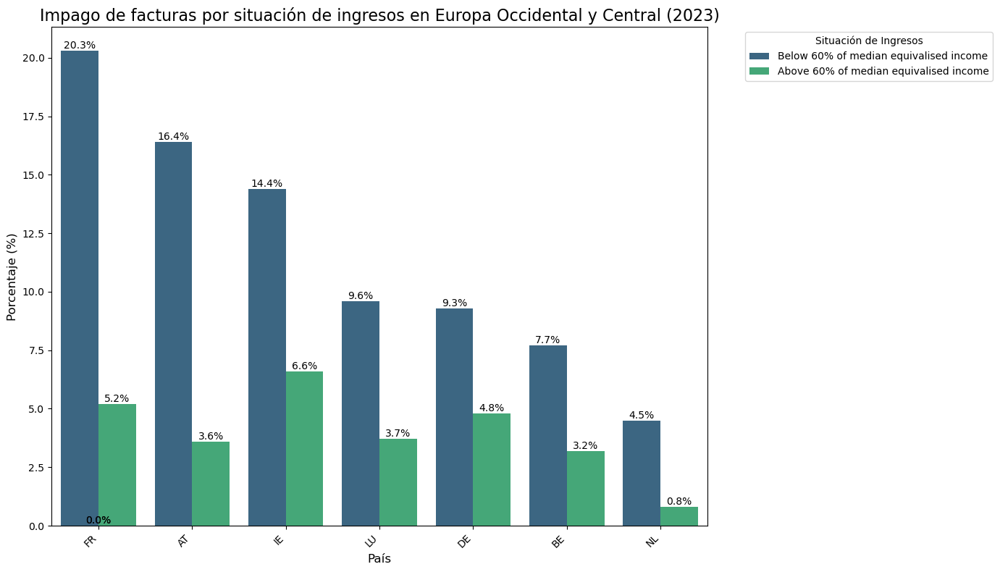

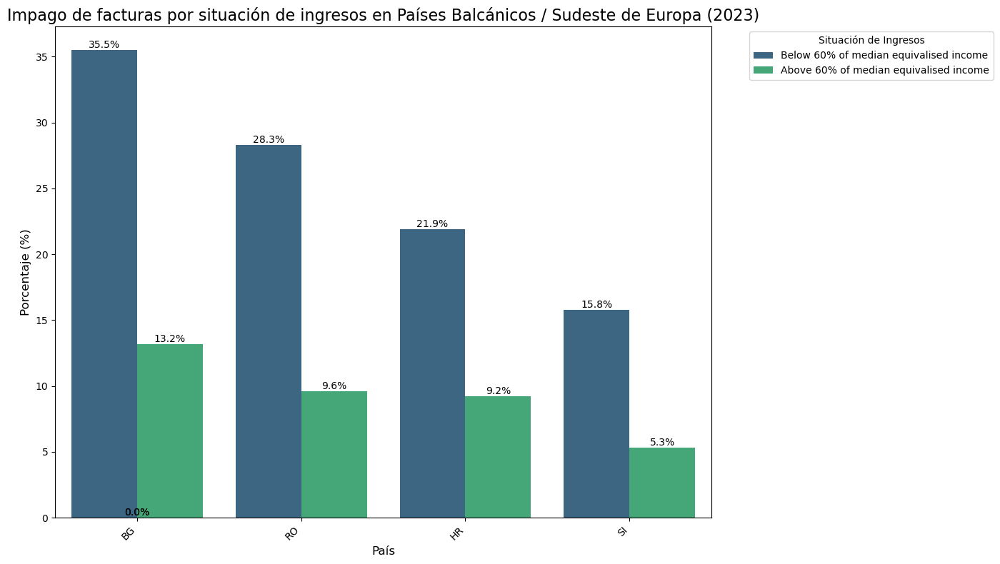

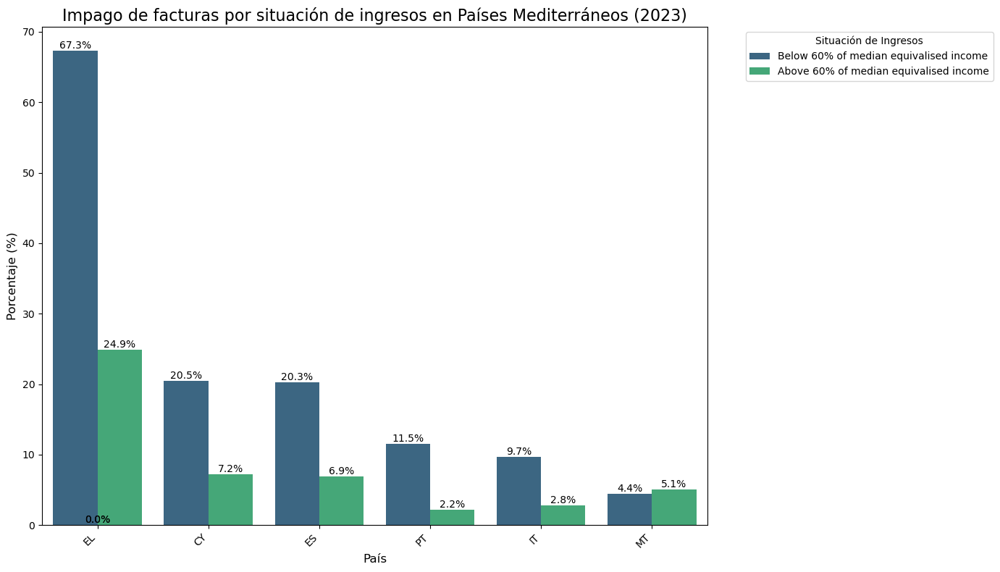

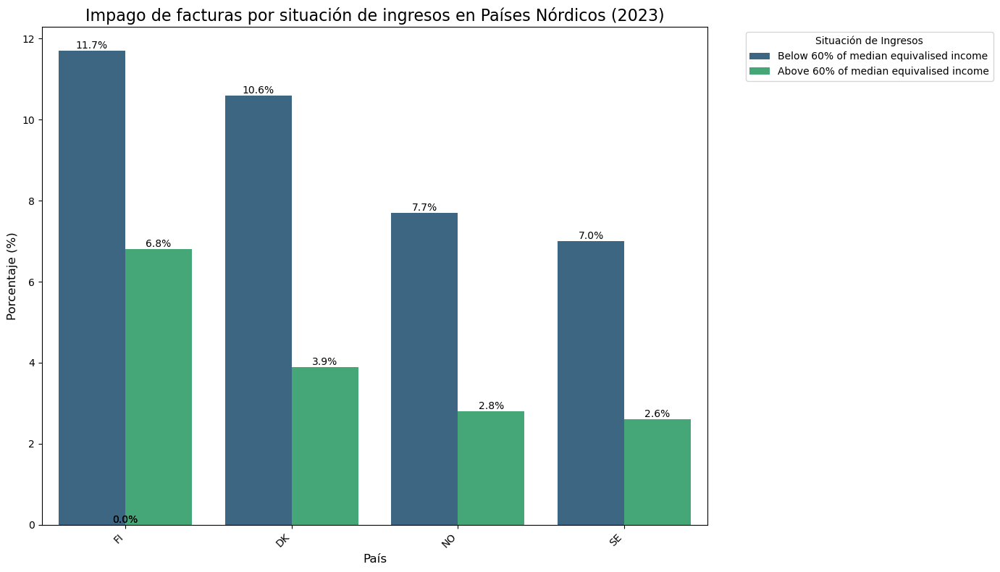

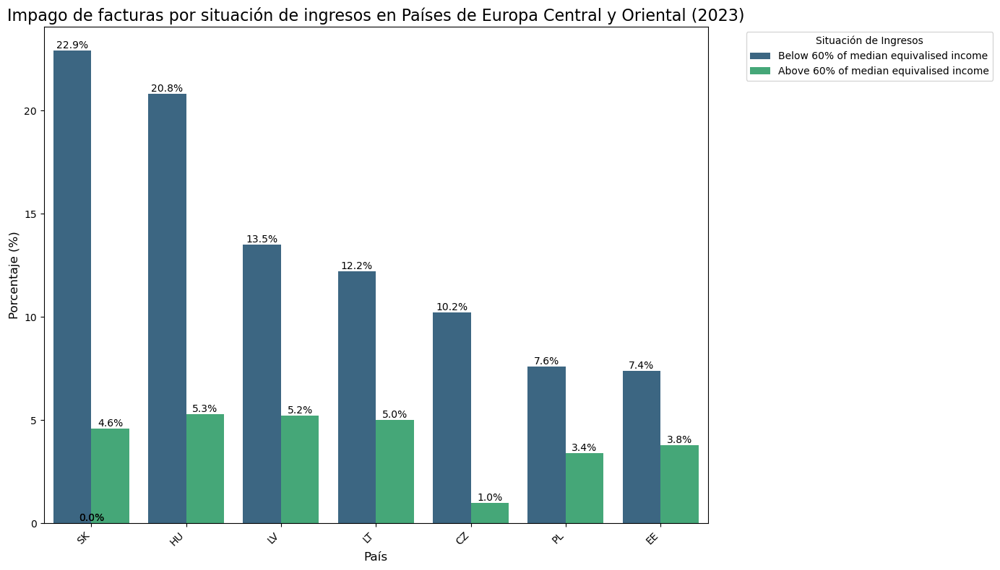

In [67]:
# ASUME que 'df_analisis' es tu DataFrame original con todos los datos.
# Si tu DataFrame tiene otro nombre, por favor cámbialo aquí.

# 1. Filtramos el DataFrame para el análisis.
# Filtramos por el año 2021 y el 'Total' de hogares, pero ahora EXCLUIMOS
# la categoría 'Total' de la situación de ingresos.
df_analisis_filtrado_ingresos = Impago_de_facturas[
    (Impago_de_facturas['Type of household'] == 'Total') &
    (~Impago_de_facturas['Income situation in relation to the risk of poverty threshold'].isin(['Total']))
].copy()

# Opcional: eliminar filas con valores NaN en 'OBS_VALUE'
df_analisis_filtrado_ingresos.dropna(subset=['OBS_VALUE'], inplace=True)


# 2. Agrupamos por región y generamos los gráficos de barras agrupadas
print("--- Generando gráficos de impago de facturas por situación de ingresos y región ---")

# Ordenamos el DataFrame por la región y el porcentaje para una mejor visualización
df_analisis_filtrado_ingresos = df_analisis_filtrado_ingresos.sort_values(by=['Region', 'OBS_VALUE'], ascending=[True, False])

# Usamos .groupby() para iterar sobre cada grupo de región
for region, grupo_df in df_analisis_filtrado_ingresos.groupby('Region'):
    
    plt.figure(figsize=(14, 8))
    
    # Creamos el gráfico de barras agrupadas usando el parámetro 'hue'
    # 'hue' asigna un color diferente a cada categoría de la columna 'Income situation...'
    ax = sns.barplot(
        data=grupo_df,
        x='geo',
        y='OBS_VALUE',
        hue='Income situation in relation to the risk of poverty threshold',
        palette='viridis' # Usamos una paleta de colores para diferenciar las barras
    )
    
    # Agregamos los porcentajes encima de cada barra
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2.,
                p.get_height(),
                f'{p.get_height():.1f}%',
                ha='center', va='bottom', fontsize=10, color='black')

    # Configuramos el título y las etiquetas para que sean claros
    plt.title(f'Impago de facturas por situación de ingresos en {region} (2023)', fontsize=16)
    plt.xlabel('País', fontsize=12)
    plt.ylabel('Porcentaje (%)', fontsize=12)
    
    # Giramos las etiquetas del eje x para que no se superpongan
    plt.xticks(rotation=45, ha='right')
    
    # Colocamos la leyenda fuera del gráfico
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Situación de Ingresos')
    
    plt.tight_layout()
    plt.show()

## 4.2.- Analisis de la privacion material de los hogares

    Al igual que el porcentaje de impago de facturas, el porcentaje de mantener o no la vivienda caliente presenta las variaciones del tipo de hogar y la situacion de ingreso con respecto a la relacion con el umbral de pobreza. Por tanto, es importante que hagamos la visuzalizacion de los hogares en total tanto a nivel del pais como con los niveles de las variaciones sobre la situacion de los ingresos.

### 4.2.1.- Inspeccionaremos nuevamente los valores unicos de las variables
La inspeccion de los valores unicos de las variables nos permitira identificar aquellos valores asociados a los valores observados que nos interesa.

In [68]:
Incapacidad_mantener_caliente_hogares

,Time frequency,hhtyp,Type of household,Income situation in relation to the risk of poverty threshold,unit,Unit of measure,geo,TIME_PERIOD,OBS_VALUE,Region
13,Annual,TOTAL,Total,Above 60% of median equivalised income,PC,Percentage,AT,2023,3.0,Europa Occidental y Central
23,Annual,TOTAL,Total,Above 60% of median equivalised income,PC,Percentage,BE,2023,4.9,Europa Occidental y Central
33,Annual,TOTAL,Total,Above 60% of median equivalised income,PC,Percentage,BG,2023,15.6,Países Balcánicos / Sudeste de Europa
43,Annual,TOTAL,Total,Above 60% of median equivalised income,PC,Percentage,CH,2023,0.4,NaN
52,Annual,TOTAL,Total,Above 60% of median equivalised income,PC,Percentage,CY,2023,12.6,Países Mediterráneos
...,...,...,...,...,...,...,...,...,...,...
976,Annual,TOTAL,Total,Total,PC,Percentage,RS,2023,9.4,NaN
986,Annual,TOTAL,Total,Total,PC,Percentage,SE,2023,5.9,Países Nórdicos
996,Annual,TOTAL,Total,Total,PC,Percentage,SI,2023,3.6,Países Balcánicos / Sudeste de Europa
1006,Annual,TOTAL,Total,Total,PC,Percentage,SK,2023,8.1,Países de Europa Central y Oriental


In [69]:
for column in Incapacidad_mantener_caliente_hogares.columns:
    unique_values = Incapacidad_mantener_caliente_hogares[column].unique()
    print(f"Valores únicos en la columna '{column}':")
    print(unique_values)
    print("---------------------------------------")

Valores únicos en la columna 'Time frequency':
['Annual']
---------------------------------------
Valores únicos en la columna 'hhtyp':
['TOTAL']
---------------------------------------
Valores únicos en la columna 'Type of household':
['Total']
---------------------------------------
Valores únicos en la columna 'Income situation in relation to the risk of poverty threshold':
['Above 60% of median equivalised income'
 'Below 60% of median equivalised income' 'Total']
---------------------------------------
Valores únicos en la columna 'unit':
['PC']
---------------------------------------
Valores únicos en la columna 'Unit of measure':
['Percentage']
---------------------------------------
Valores únicos en la columna 'geo':
['AT' 'BE' 'BG' 'CH' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR' 'HR'
 'HU' 'IE' 'IT' 'LT' 'LU' 'LV' 'MT' 'NL' 'NO' 'PL' 'PT' 'RO' 'RS' 'SE'
 'SI' 'SK' 'TR']
---------------------------------------
Valores únicos en la columna 'TIME_PERIOD':
[2023]
--------------

### 4.2.2.- Aplicamos el filtro de las variaciones totales para la privacion material tanto en el tipo de hogar como en la situacion de ingreso en relacion al riesgo de umbral de pobreza

In [70]:
# ASUME que tienes un DataFrame llamado 'df_analisis' con los datos que mostraste.
# Si tu DataFrame se llama diferente, cambia el nombre aquí.
df_analisis = Incapacidad_mantener_caliente_hogares

# 1. Filtramos el DataFrame para el análisis.
# Nos centramos en los valores totales para el año 2021.
# Asegúrate de que tu DataFrame contenga las columnas 'TIME_PERIOD', 'Type of household' y 'Income situation in relation to the risk of poverty threshold'.
df_filtrado_analisis = df_analisis[
    (df_analisis['Type of household'] == 'Total') &
    (df_analisis['Income situation in relation to the risk of poverty threshold'] == 'Total')
].copy()

# Opcional: eliminar filas con valores NaN en 'OBS_VALUE'
df_filtrado_analisis.dropna(subset=['OBS_VALUE'], inplace=True)


# 2. Agrupamos los datos por la columna 'Region' y mostramos los resultados.
print("--- Porcentaje de impago de facturas por país, agrupado por región (2021) ---")

# Ordenamos el DataFrame por la región para que los resultados estén juntos
# y por el porcentaje de impago para ver los valores más altos primero.
df_filtrado_analisis = df_filtrado_analisis.sort_values(by=['Region', 'OBS_VALUE'], ascending=[True, False])

# Usamos .groupby() para iterar sobre cada grupo de la región
for region, grupo_df in df_filtrado_analisis.groupby('Region'):
    print(f"\n--- 🗺️ Región: {region} ---")
    
    # Mostramos los resultados de los países dentro de esta región
    resultados_por_pais = grupo_df[['geo', 'OBS_VALUE']].set_index('geo')
    print(resultados_por_pais)

--- Porcentaje de impago de facturas por país, agrupado por región (2021) ---

--- 🗺️ Región: Europa Occidental y Central ---
     OBS_VALUE
geo           
FR        12.1
DE         8.2
IE         7.2
NL         7.1
BE         6.0
AT         3.9
LU         2.1

--- 🗺️ Región: Países Balcánicos / Sudeste de Europa ---
     OBS_VALUE
geo           
BG        20.7
RO        12.5
HR         6.2
SI         3.6

--- 🗺️ Región: Países Mediterráneos ---
     OBS_VALUE
geo           
ES        20.8
PT        20.8
EL        19.2
CY        17.1
IT         9.5
MT         6.8

--- 🗺️ Región: Países Nórdicos ---
     OBS_VALUE
geo           
DK         6.9
SE         5.9
FI         2.6
NO         2.1

--- 🗺️ Región: Países de Europa Central y Oriental ---
     OBS_VALUE
geo           
LT        20.0
SK         8.1
HU         7.2
LV         6.6
CZ         6.1
PL         4.7
EE         4.1


### 4.2.3.- Visualizacion del porcentaje de la incapacidad de mantener los hogares caliente

    La ventaja de manejar este indicador es que no requiere de calculos especiales porque la informacion se encuentra procesada mostrando el porcentaje de hogares con impago de facturas por pais, o el porcentaje de impago segun su situacion de ingreso conrespecto a la mediana del pais. De manera que la visualizacion nos va a permitir conocer el indicador que buscamos.

In [71]:
print(df_filtrado_analisis['geo'].unique())
# Corrected code to filter out 'EA20' and 'EU27_2020'
df_filtrado_analisis = df_filtrado_analisis[
    ~df_filtrado_analisis['geo'].isin(['EA20', 'EU27_2020','TR','RS', 'CH'])
]

print("\nAfter correction:")
print(df_filtrado_analisis['geo'].unique())


['FR' 'DE' 'IE' 'NL' 'BE' 'AT' 'LU' 'BG' 'RO' 'HR' 'SI' 'ES' 'PT' 'EL'
 'CY' 'IT' 'MT' 'DK' 'SE' 'FI' 'NO' 'LT' 'SK' 'HU' 'LV' 'CZ' 'PL' 'EE'
 'TR' 'RS' 'CH']

After correction:
['FR' 'DE' 'IE' 'NL' 'BE' 'AT' 'LU' 'BG' 'RO' 'HR' 'SI' 'ES' 'PT' 'EL'
 'CY' 'IT' 'MT' 'DK' 'SE' 'FI' 'NO' 'LT' 'SK' 'HU' 'LV' 'CZ' 'PL' 'EE']


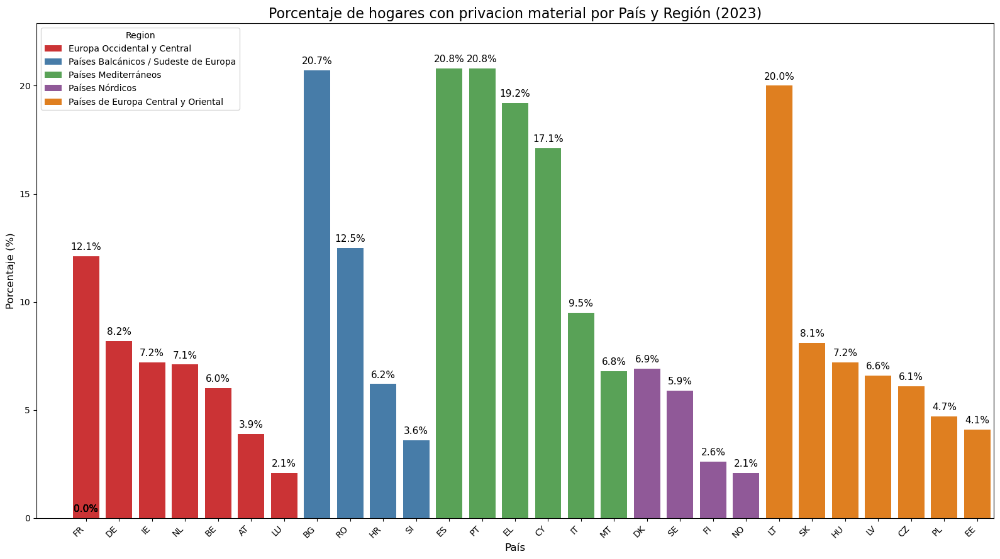

In [72]:
# Suponiendo que df_filtrado_analisis es tu DataFrame filtrado
# Ordenamos el DataFrame para que los gráficos tengan un orden lógico
df_filtrado_analisis = df_filtrado_analisis.sort_values(by=['Region', 'OBS_VALUE'], ascending=[True, False])

# Creamos una figura y un eje para el gráfico
plt.figure(figsize=(16, 9))

# Creamos un solo gráfico de barras.
ax = sns.barplot(
    data=df_filtrado_analisis,
    x='geo',
    y='OBS_VALUE',
    hue='Region',
    palette='Set1'
)

# Ajustamos el límite del eje X izquierdo para dar más espacio.
ax.set_xlim(-1.5, len(df_filtrado_analisis['geo'].unique()) - 0.5)


# Agregamos los porcentajes encima de cada barra
for p in ax.patches:
    ax.text(
        # Ajustamos la posición horizontal: movemos el texto ligeramente a la derecha
        p.get_x() + p.get_width() / 2.,
        # Ajustamos la posició2n vertical
        p.get_height() + 0.2,
        f'{p.get_height():.1f}%',
        ha='center',
        va='bottom',
        fontsize=11,
        color='black'
    )

# Configuramos el límite del eje Y para asegurar que los porcentajes se vean bien.
plt.ylim(0, df_filtrado_analisis['OBS_VALUE'].max() * 1.1)

# Configuramos el título y las etiquetas
plt.title('Porcentaje de hogares con privacion material por País y Región (2023)', fontsize=16)
plt.xlabel('País', fontsize=12)
plt.ylabel('Porcentaje (%)', fontsize=12)

# Giramos las etiquetas del eje x para que no se superpongan
plt.xticks(rotation=45, ha='right')

# Mostramos el gráfico
plt.tight_layout()
plt.show()

#### Visualizacion del porcentaje de la incapacidad de mantener los hogares calientes con respecto a los paises considerando las variaciones en la situacion de ingreso con respecto a la mediana del pais y el riesgo a la pobreza

--- Generando gráficos de privacion material por situación de ingresos y región ---


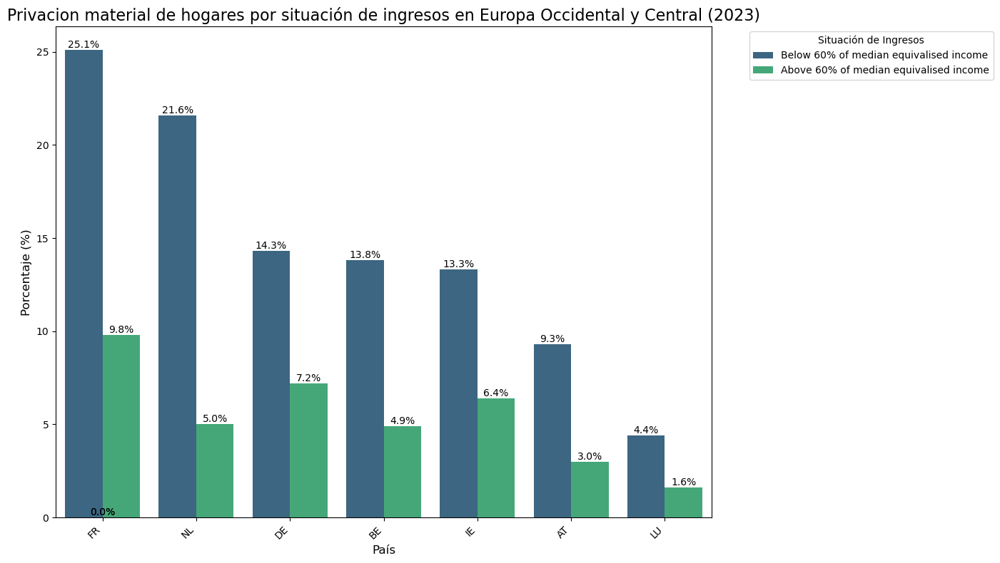

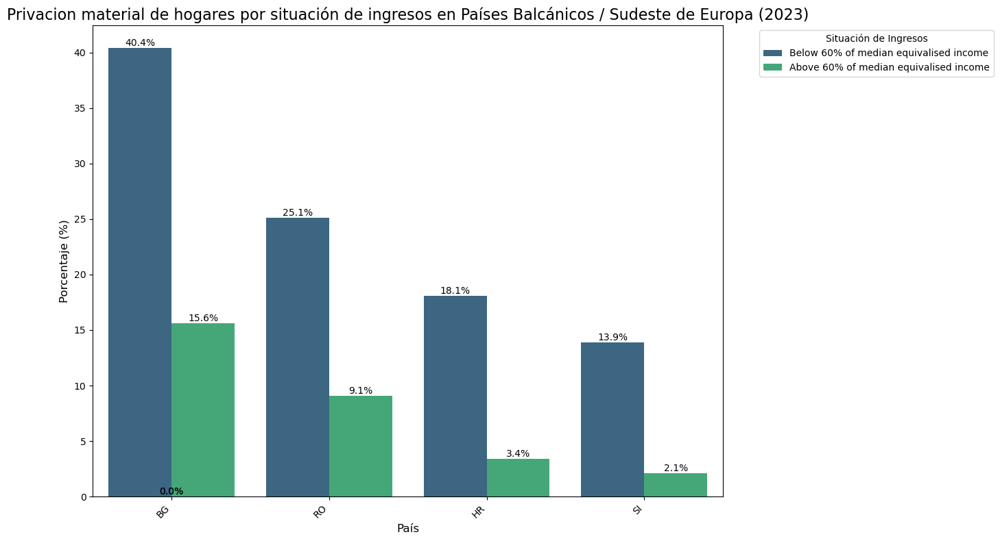

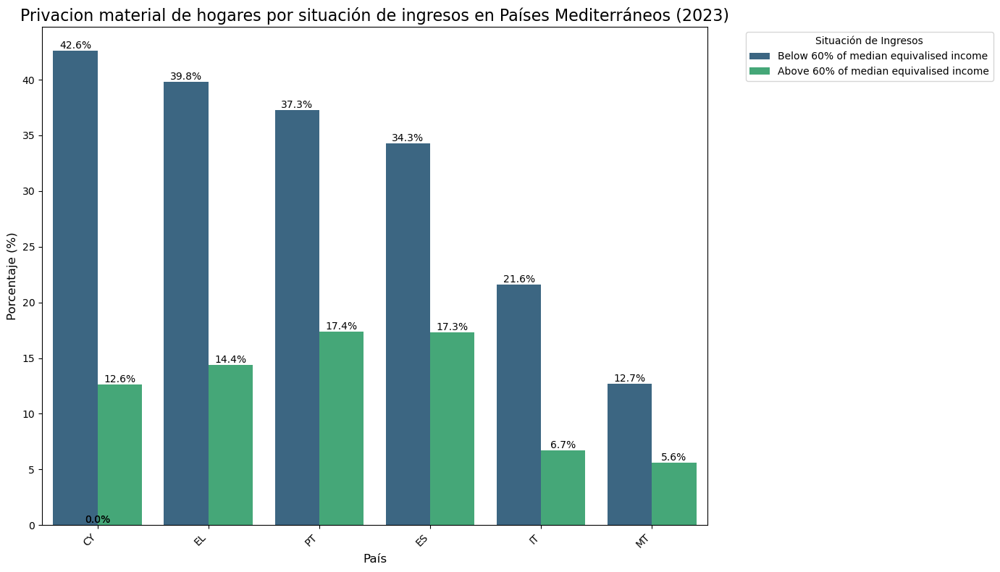

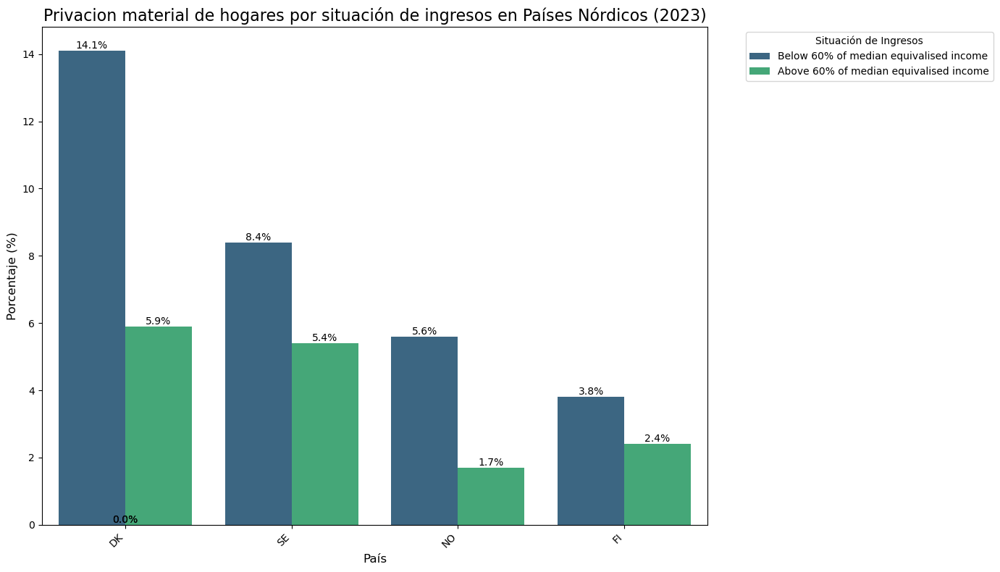

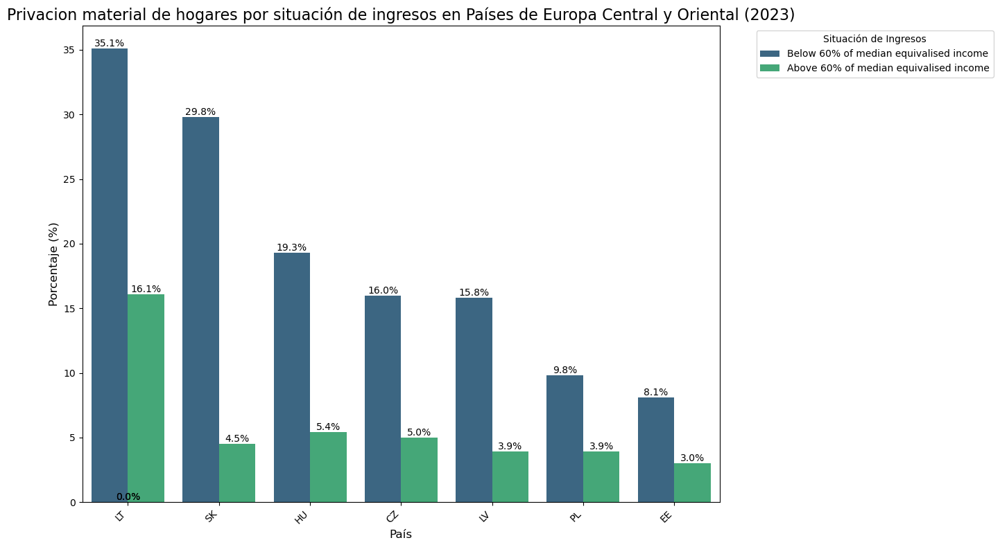

In [73]:
# ASUME que 'df_analisis' es tu DataFrame original con todos los datos.
# Si tu DataFrame tiene otro nombre, por favor cámbialo aquí.

# 1. Filtramos el DataFrame para el análisis.
# Filtramos por el año 2021 y el 'Total' de hogares, pero ahora EXCLUIMOS
# la categoría 'Total' de la situación de ingresos.
df_analisis_filtrado_ingresos = df_analisis[
    (df_analisis['Type of household'] == 'Total') &
    (~df_analisis['Income situation in relation to the risk of poverty threshold'].isin(['Total']))
].copy()

# Opcional: eliminar filas con valores NaN en 'OBS_VALUE'
df_analisis_filtrado_ingresos.dropna(subset=['OBS_VALUE'], inplace=True)


# 2. Agrupamos por región y generamos los gráficos de barras agrupadas
print("--- Generando gráficos de privacion material por situación de ingresos y región ---")

# Ordenamos el DataFrame por la región y el porcentaje para una mejor visualización
df_analisis_filtrado_ingresos = df_analisis_filtrado_ingresos.sort_values(by=['Region', 'OBS_VALUE'], ascending=[True, False])

# Usamos .groupby() para iterar sobre cada grupo de región
for region, grupo_df in df_analisis_filtrado_ingresos.groupby('Region'):
    
    plt.figure(figsize=(14, 8))
    
    # Creamos el gráfico de barras agrupadas usando el parámetro 'hue'
    # 'hue' asigna un color diferente a cada categoría de la columna 'Income situation...'
    ax = sns.barplot(
        data=grupo_df,
        x='geo',
        y='OBS_VALUE',
        hue='Income situation in relation to the risk of poverty threshold',
        palette='viridis' # Usamos una paleta de colores para diferenciar las barras
    )
    
    # Agregamos los porcentajes encima de cada barra
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2.,
                p.get_height(),
                f'{p.get_height():.1f}%',
                ha='center', va='bottom', fontsize=10, color='black')

    # Configuramos el título y las etiquetas para que sean claros
    plt.title(f'Privacion material de hogares por situación de ingresos en {region} (2023)', fontsize=16)
    plt.xlabel('País', fontsize=12)
    plt.ylabel('Porcentaje (%)', fontsize=12)
    
    # Giramos las etiquetas del eje x para que no se superpongan
    plt.xticks(rotation=45, ha='right')
    
    # Colocamos la leyenda fuera del gráfico
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Situación de Ingresos')
    
    plt.tight_layout()
    plt.show()

## 4.3.- Analisis del consumo de energia electrica por bandas de consumo

    Al igual que los otros dos indicadores, el consumo de energia por bandas de consumo ya esta disponible. Por lo que, no requiere de preprocesamientos especificos y la visualizacion nos permitira realizar el analisis de los niveles de consumo por pais.

In [74]:
inspeccion = {
    'volumen_electricidad': volumen_electricidad,
    'electricity_prices': electricity_prices
}

for nombre, bd in inspeccion.items():
    print(f"--- Columnas del DataFrame '{nombre}' ---")
    print(bd.columns.tolist())
    print("-" * 40)

--- Columnas del DataFrame 'volumen_electricidad' ---
['Time frequency', 'nrg_cons', 'Energy consumption', 'Products', 'unit', 'Unit of measure', 'geo', 'TIME_PERIOD', 'OBS_VALUE', 'Region']
----------------------------------------
--- Columnas del DataFrame 'electricity_prices' ---
['Time frequency', 'Products', 'currency', 'Currency', 'unit', 'Unit of measure', 'Energy indicator', 'geo', 'TIME_PERIOD', 'OBS_VALUE']
----------------------------------------


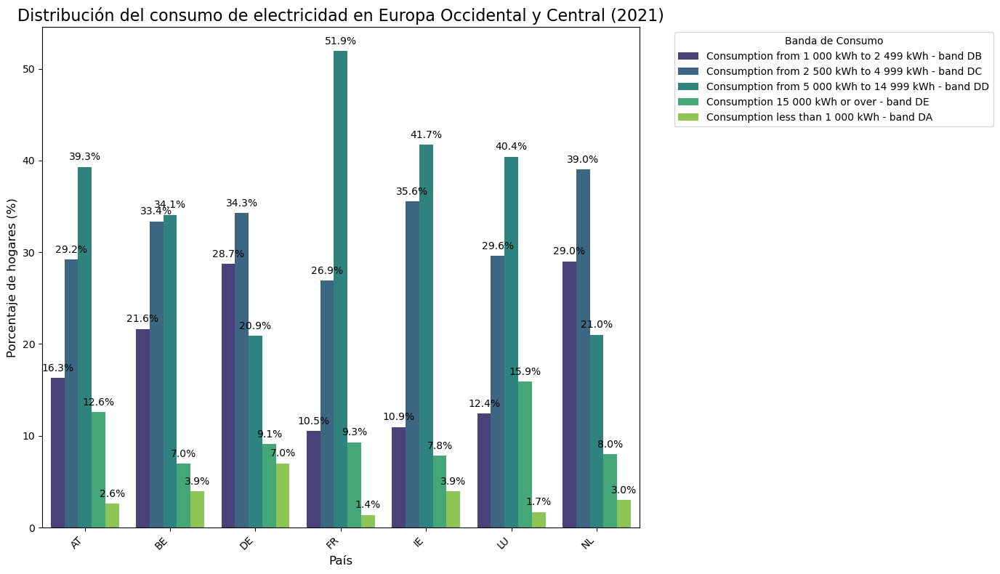

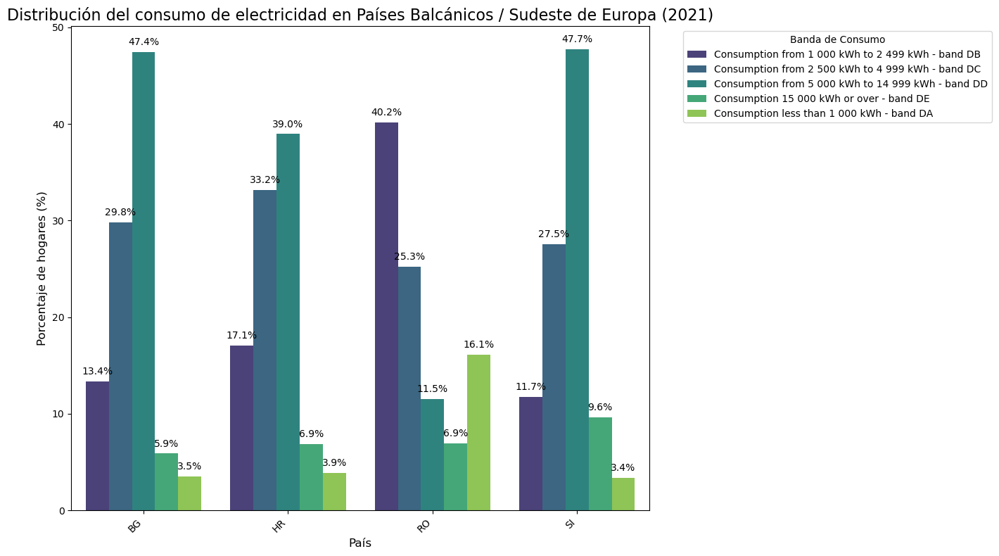

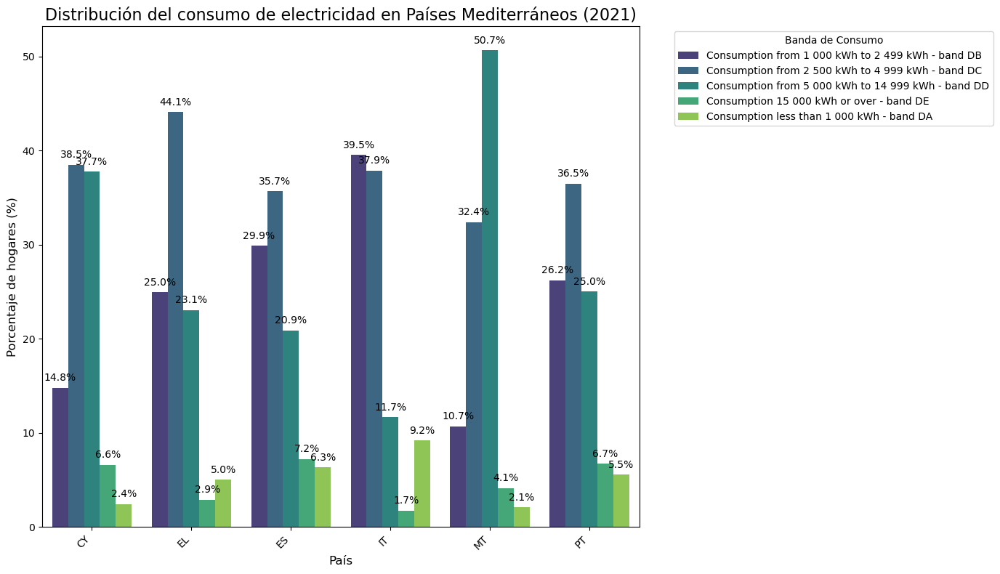

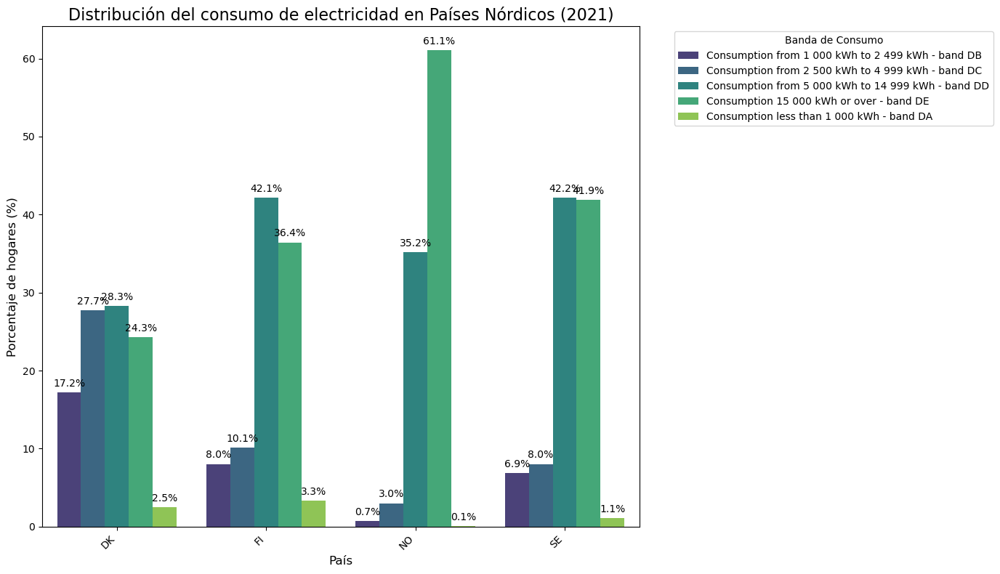

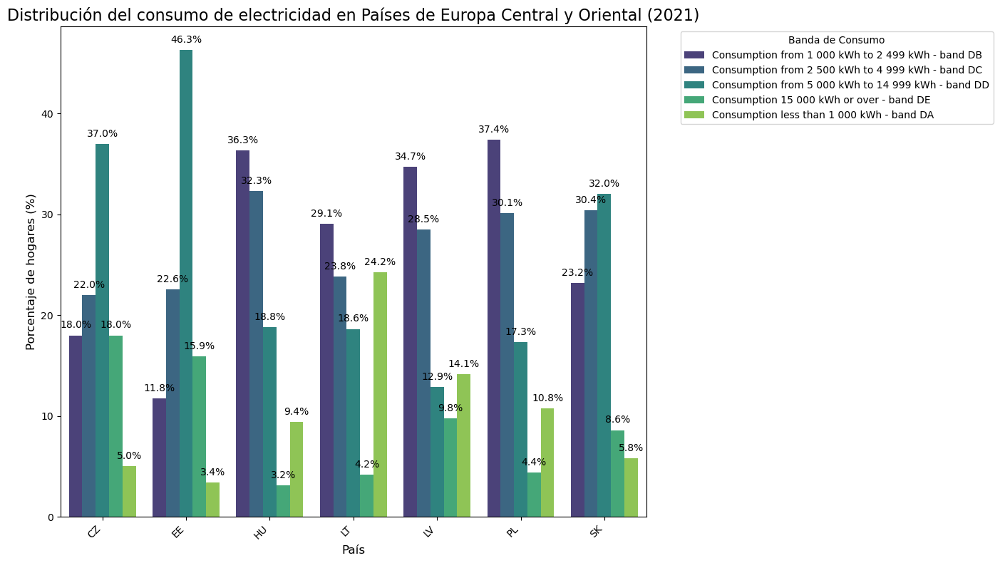

In [75]:

# Suponemos que ya tienes el DataFrame 'volumen_electricidad'
# Y que has filtrado el año 2021
df_electricidad_2021 = volumen_electricidad
# Generamos un gráfico por cada región
for region, grupo_df in df_electricidad_2021.groupby('Region'):
    plt.figure(figsize=(14, 8))
    
    # Creamos el gráfico de barras agrupadas
    ax = sns.barplot(
        data=grupo_df,
        x='geo',
        y='OBS_VALUE',
        hue='Energy consumption',
        palette='viridis'
    )
    
    # Obtenemos la anchura de las barras y el número de grupos
    total_width = p.get_width()
    n_groups = len(grupo_df['Energy consumption'].unique())
    group_width = total_width / n_groups
    
    # Esta parte es la clave para mostrar los números en el gráfico sin solaparse
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            # Calculamos la posición x para cada barra
            x_position = p.get_x() + p.get_width() / 2.0
            
            # Ajustamos la posición x si es necesario para evitar la superposición
            # En este caso, ya no es necesario, el cálculo del get_x() es más robusto
            ax.text(
                x_position,
                height + 0.5, # Movemos la etiqueta un poco hacia arriba
                f'{height:.1f}%',
                ha='center', va='bottom', fontsize=10, color='black'
            )
            
    plt.title(f'Distribución del consumo de electricidad en {region} (2021)', fontsize=16)
    plt.xlabel('País', fontsize=12)
    plt.ylabel('Porcentaje de hogares (%)', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Banda de Consumo', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

## 4.4.- Precios de Electricidad por bandas de consumo

       Empezaremos con una inspeccion de los valores nulos y la cardinalidad de los datos. Ambas inspecciones sugieren que desestimemos registros que no coincidan con las entidades politicas administrativas o con la coincidencia en el conjunto de datos, al menos con respecto al conjunto sobre el volumen de energia que sera esencial para el calculo de indicadores consecuentes.
       
       Posteriormente, realizaremos una transformacion de la cadena de texto a valores numericos de las referencia a las bandas de consum extrayendo las cifras para estblecer un rango minimo y maximo del consumo. En caso de las bandas minimas y maximas asignaremos un rango de 0 para el minimo y 25000 para el maximo. 
       
       Luego de la verificacion de los valores unicos de los rangos de consumo, procederemos a filtrar aquella referencia a todas las bandas.
       
       Finalmente, el preprocesamiento este conjunto de datos reclama una inspeccion de los valores nulos y una inspeccion de la distribuccion de los datos. Observamos el comportamiento normal de los datos (inspeccion de los valores atipicos) para estimar o desestimar su tratamiento.

In [76]:
# Suponemos que tu DataFrame de electricidad se llama 'electricidad_banda_prices'
# Si no es así, por favor, reemplaza el nombre.

# Agrupamos los datos por país y región, y contamos los valores nulos en las columnas clave.
resumen_por_geo_region = electricidad_banda_prices.groupby(['geo'])[
    ['OBS_VALUE']
].apply(lambda x: x.isnull().sum())

# La salida anterior es un MultiIndex Series, la convertimos a DataFrame para mayor claridad
resumen_por_geo_region = resumen_por_geo_region.unstack().fillna(0).astype(int)

# Calculamos el porcentaje de valores nulos para cada grupo
total_por_grupo = electricidad_banda_prices.groupby(['geo']).size()
porcentaje_nulos_por_geo = (resumen_por_geo_region.div(total_por_grupo, axis=0) * 100).round(2)

print("✅ Conteo de valores nulos por país y región:")
print(resumen_por_geo_region)
print("\n✅ Porcentaje de valores nulos por país y región:")
print(porcentaje_nulos_por_geo)

✅ Conteo de valores nulos por país y región:
           geo                                      
OBS_VALUE  AL                                           0
           AT                                           0
           BA                                           0
           BE                                           0
           BG                                           0
           CY                                           0
           CZ                                           0
           DE                                           0
           DK                                           0
           EE                                           0
           EL                                           0
           ES                                           0
           European Union - 27 countries (from 2020)    0
           FI                                           0
           FR                                           0
           GE                   

In [77]:
# Reemplaza 'df' con el nombre de tu DataFrame
filas_con_nulos = electricidad_banda_prices[electricidad_banda_prices.isnull().any(axis=1)]

print(filas_con_nulos)

                                                nrg_cons           unit  \
7      Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
27     Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
127    Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
156    Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
196    Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
...                                                  ...            ...   
17491                     Consumption of kWh - all bands  Kilowatt-hour   
17498                     Consumption of kWh - all bands  Kilowatt-hour   
17542                     Consumption of kWh - all bands  Kilowatt-hour   
17572                     Consumption of kWh - all bands  Kilowatt-hour   
17579                     Consumption of kWh - all bands  Kilowatt-hour   

                                 tax currency  \
7      All taxes and levies included     Euro   
2

Eliminamos los valores correspondientes al EA y EU27_2020. 

In [78]:
valores_a_eliminar = ['EA', 'LI', 'EU27_2020','Liechtenstein', 'European Union - 27 countries (from 2020)']
electricidad_banda_prices = electricidad_banda_prices[~electricidad_banda_prices['geo'].isin(valores_a_eliminar)]
volumen_electricidad = volumen_electricidad[~volumen_electricidad['geo'].isin(valores_a_eliminar)]

inspeccion_nulos = electricidad_banda_prices[electricidad_banda_prices.isnull().any(axis=1)]
inspeccion_nulos_dos = volumen_electricidad[volumen_electricidad.isnull().any(axis=1)]

print(inspeccion_nulos)
print(inspeccion_nulos_dos )

                                                nrg_cons           unit  \
7      Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
27     Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
156    Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
196    Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
256    Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
266    Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
276    Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
345    Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
385    Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
399    Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
3469   Consumption from 2 500 kWh to 4 999 kWh - band DC  Kilowatt-hour   
3489   Consumption from 2 500 kWh to 4 999 kWh - band DC  Kilowatt-hour   
3618   Consumption from 2

In [79]:
print("Valores únicos por columna en volumen_electricidad:")
for col in volumen_electricidad.columns:
    print(f"Columna: {col}")
    print(volumen_electricidad[col].unique())
    print("=" * 40)
filas_con_nulos_uno = volumen_electricidad[volumen_electricidad.isnull().any(axis=1)]
print("\n", filas_con_nulos_uno)
print("-" * 100)
print("\nValores únicos por columna en electricidad_banda_prices:")
for col in electricidad_banda_prices.columns:
    print(f"Columna: {col}")
    print(electricidad_banda_prices[col].unique())
    print("=" * 40)
print("-" * 100)
filas_con_nulos_dos = electricidad_banda_prices[electricidad_banda_prices.isnull().any(axis=1)]
print("\n", filas_con_nulos_dos)

Valores únicos por columna en volumen_electricidad:
Columna: Time frequency
['Annual']
Columna: nrg_cons
['KWH1000-2499' 'KWH2500-4999' 'KWH5000-14999' 'KWH_LE15000' 'KWH_LT1000']
Columna: Energy consumption
['Consumption from 1 000 kWh to 2 499 kWh - band DB'
 'Consumption from 2 500 kWh to 4 999 kWh - band DC'
 'Consumption from 5 000 kWh to 14 999 kWh - band DD'
 'Consumption 15 000 kWh or over - band DE'
 'Consumption less than 1 000 kWh - band DA']
Columna: Products
['Electrical energy']
Columna: unit
['PC']
Columna: Unit of measure
['Percentage']
Columna: geo
['AT' 'BA' 'BE' 'BG' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR' 'GE'
 'HR' 'HU' 'IE' 'IS' 'IT' 'LT' 'LU' 'LV' 'MD' 'ME' 'MK' 'MT' 'NL' 'NO'
 'PL' 'PT' 'RO' 'RS' 'SE' 'SI' 'SK' 'TR' 'XK' 'AL']
Columna: TIME_PERIOD
[2023]
Columna: OBS_VALUE
[1.63000e+01 1.05446e+01 2.16359e+01 1.33845e+01 1.47792e+01 1.80000e+01
 2.87400e+01 1.72000e+01 1.17741e+01 2.49600e+01 2.98995e+01 8.01000e+00
 1.04950e+01 4.78000e+01 1.70981e+01 3.63

### 4.1.- Transformacion de los rangos de consumo de cadenas de texto a rangos numericos

In [80]:
import re
def limpiar_y_estandarizar(texto):
    """
    Limpia y estandariza las cadenas de texto de consumo de energía.
    """
    if pd.isna(texto):
        return None
    
    texto = str(texto)
    
    # Estandariza el caso de "less than"
    if 'less than 1 000' in texto:
        return 'Consumption from 0 kWh to 1000 kWh'
        
    # Estandariza el caso de "or over"
    if '15 000 kWh or over' in texto:
        return 'Consumption from 15 000 kWh to 25000 kWh'

    # Estandariza el caso de "Consumption for" a "Consumption from"
    if 'Consumption for' in texto:
        return texto.replace('Consumption for', 'Consumption from')
        
    return texto

# Aplica la función de estandarización a tus DataFrames
volumen_electricidad['Energy consumption'] = volumen_electricidad['Energy consumption'].apply(limpiar_y_estandarizar)
electricidad_banda_prices['nrg_cons'] = electricidad_banda_prices['nrg_cons'].apply(limpiar_y_estandarizar)

# Ahora puedes usar una función de extracción mucho más simple
def extraer_limites_simple(texto):
    if pd.isna(texto):
        return None, None
    
    numeros = re.findall(r'(\d[\s\d]*)', texto)
    if len(numeros) >= 2:
        min_num = int(numeros[0].replace(' ', ''))
        max_num = int(numeros[1].replace(' ', ''))
        return min_num, max_num
        
    return None, None

# Aplica la función simple después de la estandarización
volumen_electricidad[['min_kwh', 'max_kwh']] = volumen_electricidad['Energy consumption'].apply(
    lambda x: pd.Series(extraer_limites_simple(x))
)

electricidad_banda_prices[['min_kwh', 'max_kwh']] = electricidad_banda_prices['nrg_cons'].apply(
    lambda x: pd.Series(extraer_limites_simple(x))
)

# Verifica los resultados
print(volumen_electricidad[['Energy consumption', 'min_kwh', 'max_kwh']].head(10))

                                   Energy consumption  min_kwh  max_kwh
5   Consumption from 1 000 kWh to 2 499 kWh - band DB     1000     2499
10  Consumption from 1 000 kWh to 2 499 kWh - band DB     1000     2499
15  Consumption from 1 000 kWh to 2 499 kWh - band DB     1000     2499
20  Consumption from 1 000 kWh to 2 499 kWh - band DB     1000     2499
25  Consumption from 1 000 kWh to 2 499 kWh - band DB     1000     2499
30  Consumption from 1 000 kWh to 2 499 kWh - band DB     1000     2499
35  Consumption from 1 000 kWh to 2 499 kWh - band DB     1000     2499
40  Consumption from 1 000 kWh to 2 499 kWh - band DB     1000     2499
45  Consumption from 1 000 kWh to 2 499 kWh - band DB     1000     2499
50  Consumption from 1 000 kWh to 2 499 kWh - band DB     1000     2499


C:\Users\user\AppData\Local\Temp\ipykernel_17112\3098197624.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  volumen_electricidad['Energy consumption'] = volumen_electricidad['Energy consumption'].apply(limpiar_y_estandarizar)
C:\Users\user\AppData\Local\Temp\ipykernel_17112\3098197624.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  electricidad_banda_prices['nrg_cons'] = electricidad_banda_prices['nrg_cons'].apply(limpiar_y_estandarizar)
C:\Users\user\AppData\Local\Temp\ipykernel_17112\3098197624.

In [81]:
volumen_electricidad['Energy consumption'].unique()

array(['Consumption from 1 000 kWh to 2 499 kWh - band DB',
       'Consumption from 2 500 kWh to 4 999 kWh - band DC',
       'Consumption from 5 000 kWh to 14 999 kWh - band DD',
       'Consumption from 15 000 kWh to 25000 kWh',
       'Consumption from 0 kWh to 1000 kWh'], dtype=object)

In [82]:
for col in ['Energy consumption', 'min_kwh', 'max_kwh']:
    if col in volumen_electricidad.columns:
        unique_values = volumen_electricidad[col].unique()
        print(f"Valores únicos en la columna '{col}':")
        print(unique_values)
        print("\n" + "="*50 + "\n")
    else:
        print(f"La columna '{col}' no existe en el DataFrame.")

Valores únicos en la columna 'Energy consumption':
['Consumption from 1 000 kWh to 2 499 kWh - band DB'
 'Consumption from 2 500 kWh to 4 999 kWh - band DC'
 'Consumption from 5 000 kWh to 14 999 kWh - band DD'
 'Consumption from 15 000 kWh to 25000 kWh'
 'Consumption from 0 kWh to 1000 kWh']


Valores únicos en la columna 'min_kwh':
[ 1000  2500  5000 15000     0]


Valores únicos en la columna 'max_kwh':
[ 2499  4999 14999 25000  1000]




In [83]:
# Filtra el DataFrame para excluir las filas donde 'Energy consumption'
# sea igual a 'Consumption of kWh - all bands'
electricidad_banda_prices = electricidad_banda_prices[
    electricidad_banda_prices['nrg_cons'] != 'Consumption of kWh - all bands'
]

# Imprime el conteo de valores nulos para verificar el resultado
print(electricidad_banda_prices.isnull().sum())

nrg_cons        0
unit            0
tax             0
currency        0
geo             0
TIME_PERIOD     0
OBS_VALUE       0
Region         50
min_kwh         0
max_kwh         0
dtype: int64


In [84]:
# Imprime el conteo de valores nulos para verificar el resultado
print(volumen_electricidad.isnull().sum())

Time frequency         0
nrg_cons               0
Energy consumption     0
Products               0
unit                   0
Unit of measure        0
geo                    0
TIME_PERIOD            0
OBS_VALUE              0
Region                46
min_kwh                0
max_kwh                0
dtype: int64


### 4.2.- Inspeccion de la distribucion de los datos y deteccion de outliers

In [85]:
electricidad_banda_prices.columns

Index(['nrg_cons', 'unit', 'tax', 'currency', 'geo', 'TIME_PERIOD',
       'OBS_VALUE', 'Region', 'min_kwh', 'max_kwh'],
      dtype='object')

In [86]:
electricidad_banda_prices['OBS_VALUE'].describe()

count    190.000000
mean       0.227103
std        0.123924
min       -0.285500
25%        0.128075
50%        0.218200
75%        0.305575
max        0.667600
Name: OBS_VALUE, dtype: float64

In [87]:
# Lista de los códigos de los 27 países de la Unión Europea
paises_ue = [
    'AT', 'BE', 'BG', 'CY', 'CZ', 'DE', 'DK', 'EE', 'EL', 'ES',
    'FI', 'FR', 'HR', 'HU', 'IE', 'IT', 'LT', 'LU', 'LV', 'MT',
    'NL', 'NO','PL', 'PT', 'RO', 'SE', 'SI', 'SK'
]

# Paso 1: Filtrar el DataFrame para incluir solo los países de la UE
df_ue = electricidad_banda_prices[electricidad_banda_prices['geo'].isin(paises_ue)]

# Paso 2: Realizar el cálculo de estadísticas con el DataFrame filtrado
estad_ue = df_ue.groupby('geo')['OBS_VALUE'].agg(['count', 'min', 'max', 'mean', 'median', 'std']).reset_index()

# Mostrar el resultado
print(estad_ue)

   geo  count     min     max     mean  median       std
0   AT      5  0.2748  0.4230  0.31580  0.2949  0.061116
1   BE      5  0.3219  0.5212  0.39632  0.3778  0.077262
2   BG      5  0.1180  0.1200  0.11922  0.1192  0.000763
3   CY      5  0.3331  0.6676  0.40932  0.3452  0.144854
4   CZ      5  0.2384  0.5439  0.34620  0.3151  0.121190
5   DE      5  0.3427  0.5779  0.42902  0.4020  0.091331
6   DK      5  0.2374  0.4295  0.33370  0.3554  0.080070
7   EE      5  0.1756  0.3043  0.23668  0.2339  0.048731
8   EL      5  0.2309  0.3783  0.27588  0.2506  0.060438
9   ES      5  0.2154  0.4323  0.27566  0.2347  0.091021
10  FI      5  0.1634  0.4127  0.26342  0.2403  0.099083
11  FR      5  0.2239  0.5117  0.30756  0.2591  0.118891
12  HR      5  0.1480  0.2343  0.16974  0.1587  0.036450
13  HU      5  0.0825  0.1679  0.12006  0.1132  0.034563
14  IE      5  0.3546  0.3857  0.37214  0.3757  0.012285
15  IT      5  0.2483  0.5407  0.36254  0.3347  0.108169
16  LT      5  0.2039  0.2568  

In [88]:
negativos = electricidad_banda_prices[electricidad_banda_prices['OBS_VALUE'] < 0]

# Contar cuántos valores negativos por país
conteo_negativos_por_geo = negativos['geo'].value_counts()

print(conteo_negativos_por_geo)

geo
NL    1
Name: count, dtype: int64


In [89]:

# Calcular percentiles 1% y 99%
p1 = electricidad_banda_prices['OBS_VALUE'].quantile(0.01)
p99 = electricidad_banda_prices['OBS_VALUE'].quantile(0.90)

# Filtrar valores extremos (por debajo del 1% o por encima del 99%)
extremos = electricidad_banda_prices[(electricidad_banda_prices['OBS_VALUE'] < p1) | (electricidad_banda_prices['OBS_VALUE'] > p99)]

# Contar cuántos extremos hay por país
extremos_count = extremos['geo'].value_counts()

print(extremos_count)

geo
DE    3
BE    2
DK    2
AT    1
CY    1
CZ    1
ES    1
FI    1
FR    1
IE    1
IS    1
IT    1
LV    1
NL    1
NO    1
SE    1
TR    1
Name: count, dtype: int64


In [90]:
# Estadísticas por geo para los valores extremos
estad_extremos = extremos.groupby('geo')['OBS_VALUE'].agg(['count', 'min', 'max', 'mean', 'median','std']).reset_index()

print(estad_extremos)

   geo  count     min     max      mean   median       std
0   AT      1  0.4230  0.4230  0.423000  0.42300       NaN
1   BE      2  0.4111  0.5212  0.466150  0.46615  0.077852
2   CY      1  0.6676  0.6676  0.667600  0.66760       NaN
3   CZ      1  0.5439  0.5439  0.543900  0.54390       NaN
4   DE      3  0.4020  0.5779  0.475233  0.44580  0.091569
5   DK      2  0.3801  0.4295  0.404800  0.40480  0.034931
6   ES      1  0.4323  0.4323  0.432300  0.43230       NaN
7   FI      1  0.4127  0.4127  0.412700  0.41270       NaN
8   FR      1  0.5117  0.5117  0.511700  0.51170       NaN
9   IE      1  0.3857  0.3857  0.385700  0.38570       NaN
10  IS      1  0.3817  0.3817  0.381700  0.38170       NaN
11  IT      1  0.5407  0.5407  0.540700  0.54070       NaN
12  LV      1  0.4363  0.4363  0.436300  0.43630       NaN
13  NL      1 -0.2855 -0.2855 -0.285500 -0.28550       NaN
14  NO      1  0.4803  0.4803  0.480300  0.48030       NaN
15  SE      1  0.3810  0.3810  0.381000  0.38100       N

Hasta este paso no hay valores duplicados ni valores nulos destacables que distorsionen los calculos posteriores

## 4.3.- Gasto energetico

    El preprocesamiento de los valores de los precios de la energia electrica va a permitir realizar el calculo del gasto energetico, variable esencial para conocer la carga economica. Para rectificar la operacion del calculo energetico y la adecuada integracion, procederemos a explorar las dimensiones del conjunto de datos. Tammbien, inspeccionamos la diferencia de los valores unicos de nuestras variables de region, la banda de consumo, los costos de energia electrica minimo y maximo, y los costos; o las observaciones que eran por un lado, el porcentaje de hogares y por otro lado, los precios de la energia electrica. En ambos conjuntos de datos codificamos las variables para agregarlas en un conjunto de datos integrado. Tambien eliminamos columnas redundates.

### 4.3.1.- Calculo del gasto energetico

### 3.4.2.- Exploracion especifica de los conjuntos de datos de la energia electrica y el volumen de consumo

In [91]:
# Asegúrate de que tus columnas estén en formato numérico para la operación
electricidad_banda_prices['min_kwh'] = pd.to_numeric(electricidad_banda_prices['min_kwh'])
electricidad_banda_prices['max_kwh'] = pd.to_numeric(electricidad_banda_prices['max_kwh'])
electricidad_banda_prices['OBS_VALUE'] = pd.to_numeric(electricidad_banda_prices['OBS_VALUE'])

# Multiplicamos la columna 'min_kwh' por 'OBS_VALUE' para obtener el costo mínimo
electricidad_banda_prices['costo_min'] = electricidad_banda_prices['min_kwh'] * electricidad_banda_prices['OBS_VALUE']

# Multiplicamos la columna 'max_kwh' por 'OBS_VALUE' para obtener el costo máximo
electricidad_banda_prices['costo_max'] = electricidad_banda_prices['max_kwh'] * electricidad_banda_prices['OBS_VALUE']

# Vemos las primeras 5 filas del DataFrame para verificar los resultados
print(electricidad_banda_prices[['Region','geo','nrg_cons','min_kwh', 'max_kwh', 'OBS_VALUE', 'costo_min', 'costo_max']].head())
print('\n')

                                   Region geo  \
7                                     NaN  AL   
17            Europa Occidental y Central  AT   
27                                    NaN  BA   
37            Europa Occidental y Central  BE   
47  Países Balcánicos / Sudeste de Europa  BG   

                                             nrg_cons  min_kwh  max_kwh  \
7   Consumption from 1 000 kWh to 2 499 kWh - band DB   1000.0   2499.0   
17  Consumption from 1 000 kWh to 2 499 kWh - band DB   1000.0   2499.0   
27  Consumption from 1 000 kWh to 2 499 kWh - band DB   1000.0   2499.0   
37  Consumption from 1 000 kWh to 2 499 kWh - band DB   1000.0   2499.0   
47  Consumption from 1 000 kWh to 2 499 kWh - band DB   1000.0   2499.0   

    OBS_VALUE  costo_min  costo_max  
7      0.1089      108.9   272.1411  
17     0.3055      305.5   763.4445  
27     0.0990       99.0   247.4010  
37     0.4111      411.1  1027.3389  
47     0.1192      119.2   297.8808  




#### Exploracion de las dimensiones de los conjuntos de datos

In [92]:
dimensiones=[electricidad_banda_prices,
            volumen_electricidad]

for base in dimensiones:
    print(base.shape)

(190, 12)
(186, 12)


#### Exploracion de las diferencias entre los valores unicos de los data frames

In [93]:
# Obtener las columnas comunes entre ambos DataFrames
columnas_comunes = list(set(electricidad_banda_prices.columns) & set(volumen_electricidad.columns))
print(f"Columnas comunes para la comparación: {columnas_comunes}\n")

# Bucle para encontrar los valores únicos que no coinciden en cada columna común
for col in columnas_comunes:
    # Obtener los valores únicos de cada DataFrame para la columna actual
    valores_electricidad = set(electricidad_banda_prices[col].unique())
    valores_volumen = set(volumen_electricidad[col].unique())

    # Encontrar los valores en electricidad_banda_prices que no están en volumen_electricidad
    diferencia_1 = valores_electricidad - valores_volumen

    # Encontrar los valores en volumen_electricidad que no están en electricidad_banda_prices
    diferencia_2 = valores_volumen - valores_electricidad
    
    # Imprimir los resultados si hay diferencias
    if diferencia_1 or diferencia_2:
        print(f"Diferencias en la columna '{col}':")
        if diferencia_1:
            print(f"  Valores únicos en 'electricidad_banda_prices' que no están en 'volumen_electricidad': {diferencia_1}")
        if diferencia_2:
            print(f"  Valores únicos en 'volumen_electricidad' que no están en 'electricidad_banda_prices': {diferencia_2}")
        print("-" * 50)

Columnas comunes para la comparación: ['Region', 'TIME_PERIOD', 'unit', 'nrg_cons', 'geo', 'min_kwh', 'OBS_VALUE', 'max_kwh']

Diferencias en la columna 'unit':
  Valores únicos en 'electricidad_banda_prices' que no están en 'volumen_electricidad': {'Kilowatt-hour'}
  Valores únicos en 'volumen_electricidad' que no están en 'electricidad_banda_prices': {'PC'}
--------------------------------------------------
Diferencias en la columna 'nrg_cons':
  Valores únicos en 'electricidad_banda_prices' que no están en 'volumen_electricidad': {'Consumption from 0 kWh to 1000 kWh', 'Consumption from 2 500 kWh to 4 999 kWh - band DC', 'Consumption from 5 000 kWh to 14 999 kWh - band DD', 'Consumption from 15 000 kWh to 25000 kWh', 'Consumption from 1 000 kWh to 2 499 kWh - band DB'}
  Valores únicos en 'volumen_electricidad' que no están en 'electricidad_banda_prices': {'KWH_LT1000', 'KWH_LE15000', 'KWH1000-2499', 'KWH5000-14999', 'KWH2500-4999'}
--------------------------------------------------


#### Eliminacon de las columnas redundantes

     Eliminemos nrg_cons de volumen_electricidad y unit

In [94]:
# Filtramos el DataFrame de precios de electricidad para incluir solo los datos de Islandia
electricidad_is = electricidad_banda_prices[electricidad_banda_prices['geo'] == 'IS']

# Filtramos el DataFrame de volumen de electricidad para incluir solo los datos de Islandia
volumen_is = volumen_electricidad[volumen_electricidad['geo'] == 'IS']

# Mostramos las dimensiones de los nuevos DataFrames para confirmar el filtrado
print("Dimensiones de los datos de electricidad de Islandia:")
print(electricidad_is.shape)

print("\nDimensiones de los datos de volumen de Islandia:")
print(volumen_is.shape)

Dimensiones de los datos de electricidad de Islandia:
(5, 12)

Dimensiones de los datos de volumen de Islandia:
(5, 12)


In [95]:
volumen_electricidad = volumen_electricidad[volumen_electricidad['geo'] != 'IS']

# Check the unique values in the 'geo' column to confirm 'IS' is gone
print(volumen_electricidad['geo'].unique())

['AT' 'BA' 'BE' 'BG' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR' 'GE'
 'HR' 'HU' 'IE' 'IT' 'LT' 'LU' 'LV' 'MD' 'ME' 'MK' 'MT' 'NL' 'NO' 'PL'
 'PT' 'RO' 'RS' 'SE' 'SI' 'SK' 'TR' 'XK' 'AL']


In [96]:
volumen_electricidad.drop(['unit','nrg_cons','Unit of measure'], axis=1, inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_17112\3275555217.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  volumen_electricidad.drop(['unit','nrg_cons','Unit of measure'], axis=1, inplace=True)


### 4.3.3.- Codificacion de las variables y valores observados tanto el conjunto de datos del volumen de energia como de los precios de energia

In [97]:
# Renombramos la columna 'OBS_VALUE' en el DataFrame de precios
electricidad_banda_prices = electricidad_banda_prices.rename(columns={'OBS_VALUE': 'precio_kwh'})

# Renombramos la columna 'OBS_VALUE' en el DataFrame de porcentaje de hogares
volumen_electricidad = volumen_electricidad.rename(columns={'OBS_VALUE': 'porcentaje_hogares'})

# Renombramos la columna 'OBS_VALUE' en el DataFrame de porcentaje de hogares
electricidad_banda_prices = electricidad_banda_prices.rename(columns={'nrg_cons':'Energy consumption' })

print("✅ Columnas del DataFrame de precios renombradas:")
print(electricidad_banda_prices.head())
print('\n')
print(electricidad_banda_prices.isnull().sum())

print("\n✅ Columnas del DataFrame de volumen de electricidad renombradas:")
print(volumen_electricidad.head())

✅ Columnas del DataFrame de precios renombradas:
                                   Energy consumption           unit  \
7   Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
17  Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
27  Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
37  Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
47  Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   

                              tax currency geo  TIME_PERIOD  precio_kwh  \
7   All taxes and levies included     Euro  AL         2023      0.1089   
17  All taxes and levies included     Euro  AT         2023      0.3055   
27  All taxes and levies included     Euro  BA         2023      0.0990   
37  All taxes and levies included     Euro  BE         2023      0.4111   
47  All taxes and levies included     Euro  BG         2023      0.1192   

                                   Region  min_kwh  max_kwh  costo_

### 4.3.4.- Integracion de los conjuntos de datos del consumo y precios de la energia electrica

In [98]:
# Paso 1: Imprimir los nombres de las columnas de ambos DataFrames
print("Columnas en 'electricidad_banda_prices':")
print(electricidad_banda_prices.columns)
print("\n" + "="*50 + "\n")
print("Columnas en 'volumen_electricidad':")
print(volumen_electricidad.columns)

# Paso 2: Imprimir los tipos de datos de las columnas clave
print("\nTipos de datos de las columnas clave en 'electricidad_banda_prices':")
print(electricidad_banda_prices[['Region','TIME_PERIOD', 'geo', 'min_kwh', 'max_kwh']].info())
print("\n" + "="*50 + "\n")
print("Tipos de datos de las columnas clave en 'volumen_electricidad':")
print(volumen_electricidad[['TIME_PERIOD', 'geo', 'Region', 'min_kwh', 'max_kwh']].info())

Columnas en 'electricidad_banda_prices':
Index(['Energy consumption', 'unit', 'tax', 'currency', 'geo', 'TIME_PERIOD',
       'precio_kwh', 'Region', 'min_kwh', 'max_kwh', 'costo_min', 'costo_max'],
      dtype='object')


Columnas en 'volumen_electricidad':
Index(['Time frequency', 'Energy consumption', 'Products', 'geo',
       'TIME_PERIOD', 'porcentaje_hogares', 'Region', 'min_kwh', 'max_kwh'],
      dtype='object')

Tipos de datos de las columnas clave en 'electricidad_banda_prices':
<class 'pandas.core.frame.DataFrame'>
Index: 190 entries, 7 to 14247
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Region       140 non-null    object 
 1   TIME_PERIOD  190 non-null    int64  
 2   geo          190 non-null    object 
 3   min_kwh      190 non-null    float64
 4   max_kwh      190 non-null    float64
dtypes: float64(2), int64(1), object(2)
memory usage: 8.9+ KB
None


Tipos de datos de las columnas clave en 'v

In [99]:
# Realizamos la unión de los DataFrames

df_electricidad = pd.merge(
    electricidad_banda_prices,
    volumen_electricidad[['TIME_PERIOD', 'Region','geo', 'min_kwh', 'max_kwh', 'porcentaje_hogares']],
    on=['TIME_PERIOD','geo', 'min_kwh', 'max_kwh']
)

print("✅ DataFrame integrado con precios y porcentaje de hogares:")


✅ DataFrame integrado con precios y porcentaje de hogares:


In [100]:
df_electricidad.columns

Index(['Energy consumption', 'unit', 'tax', 'currency', 'geo', 'TIME_PERIOD',
       'precio_kwh', 'Region_x', 'min_kwh', 'max_kwh', 'costo_min',
       'costo_max', 'Region_y', 'porcentaje_hogares'],
      dtype='object')

#### 43.4.1.- Inspeccionamos los valores nulos del conjunto integrado

In [101]:
print(f'las dimensioes son: {df_electricidad.shape} y los valores nulos {df_electricidad.isnull().sum()}')
filas_con_nulos = df_electricidad[df_electricidad.isnull().any(axis=1)]

print(filas_con_nulos)
for columna in filas_con_nulos.columns:
    valores_unicos = filas_con_nulos[columna].unique()
    print(f"\nValores únicos CON DATOS NULOS en la columna '{columna}':")
    print(valores_unicos)

las dimensioes son: (181, 14) y los valores nulos Energy consumption     0
unit                   0
tax                    0
currency               0
geo                    0
TIME_PERIOD            0
precio_kwh             0
Region_x              41
min_kwh                0
max_kwh                0
costo_min              0
costo_max              0
Region_y              41
porcentaje_hogares     0
dtype: int64
                                    Energy consumption           unit  \
1    Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
13   Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
21   Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
22   Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
23   Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
30   Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
34   Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
35 

### Resumen

    En este momento ya contamos con el porcentaje de hogares segun la banda de consumo, en el cual esta anexado el gasto energetico segun unas unidades discretas para cada porcentaje de hogar por pais y region. De esta manera podemos conocer la oscilacion del gasto energetico y el consumo energetico del porcentaje de hogares, y posteriormente, el numero de hogares, si hacemos las operaciones pertinente con la informacion del numero de hogares por pais. Nos queda en este sentido conocer la carga economica de los ingresos del porcentaje de los hogares para cada pais, y posteriormente para cada region. De manera que nuestro conjunto de datos de energia electrica contiene la informacion sobre la region, los paises, los gastos energeticos, los precios, porcentaje de hogares y el consumo minimo y maximo de kwh.

## 4.4.- Ingresos

    La carga económica es una variable que requiere del gasto energético y los ingresos de los hogares. Ninguna de estas variables estaban presentes en ningún conjunto de datos. Para el gasto energético multiplicamos el consumo de la energía por el precio. En el caso del ingreso fue más complicado. Aplicamos dos alternativas, una fue calcular el ingreso de los hogares según los ingresos brutos disponibles; la otra, asignar a los hogares ingresos proporcionales con respecto a la mediana del país.

    Las dos alternativas se basan en diferentes criterios. El cálculo con los ingresos brutos de los hogares incluyen los salarios, los servicios, las prestaciones y transferencias totales de los hogares, mientras que el cálculo con la mediana del ingreso, no. 

    En ambos casos, aplicamos una distribución de los ingresos basados en la proporción de los ingresos de cada país repartidos en deciles, pero orientados a conservar la información sobre el porcentaje de hogares de acuerdo a las bandas de consumo de energía. La disparidad de los cinco rangos de consumo y los diez niveles de ingreso nos motivó a distribuir el porcentaje de hogares de forma acumulativa en los deciles de ingreso.

    La presuposición de la Eurostat que los niveles de consumo están relacionados con los niveles de ingreso respaldo la distribución proporcional de las cifras porcentuales de los hogares en los deciles. Para cada decil, habían distintas proporciones de hogares con respecto al rango de consumo. Con esto, tenemos una referencia sobre la pertenencia a la proporción del ingreso familiar de los porcentajes de hogares según su rango de consumo. Además, no solo se adjudicó proporcionalmente los hogares, sino también, los ingresos a conveniencia de cada decil. Conseguimos un estrato socioeconómico de consumo (socio-energético).

    Posteriormente, esta distribución acumulativa sirvió de pivote de la estimación proxy de los ingresos. El reparto del ingreso general en los porcentajes de hogares pertenecientes a rangos de consumo permitió una distribución cascada. 

    Con la información sobre el número de hogares y los ingresos brutos de los hogares por país, por un lado, y la mediana de ingreso por país, por otro lado, distribuimos el porcentaje correspondiente de los ingresos. En el primer caso, obtuvimos el ingreso de los hogares luego calcular el ingreso bruto correspondiente a la proporción de los deciles de ingreso de consumo. En el segundo caso, la mediana sirvió como punto de referencia crucial. Se utilizó la mediana de cada país para anclar el quinto decil, y, a partir de este, se distribuyeron los ingresos de forma proporcional a los deciles. Esto permitió obtener una cifra de ingresos estimada para cada grupo de hogares.



### Tratamiento de los conjuntos de datos de ingresos

    Como mencionamos, tenemos tres conjuntos de datos relacionados con los ingresos, y un conjunto relacionado con el consumo, gasto y precios de la energia electrica. El interes por conservar la informacion relacionada con el porcentaje de hogares requirio tratamientos especificos para aproximarnos a los ingresos individuales de los hogares. Pero la informacion disponible eran o la mediana de ingreso de los paises, la proporcion de los ingresos con respecto a diez estratos sociales y el ingreso bruto de los hogares por pais. 

    Por esta razon, nos parecio conveniente tratar los estratos de ingresos en los deciles para relacionar el porcentaje de consumo de la energia electrica con respecto al porcentaje de los hogares relacionados con la proporcion del ingreso en deciles. Principalmente, porque esta relacion entre la proporcion de ingreso de cada 10% de los hogares, permitirian identificar la disribucion de los distintos hogares con respecto a sus ingresos, y, con ello distribuir el ingreso bruto segun la particion total del pais en cada estrato social o asignar la mediana de ingreso al decil quinto y distribuir los ingresos de cada estrato social segun su proporcion a nivel nacional. 

    

### Ingresos en deciles

    El tratamiento de los ingresos en deciles se enfoco en la distribucion proporcional de los hogares con respecto al volumen de energia. Esta distribucion tiene la intencion de asignar los ingresos pertenecientes a un porcentaje de hogares segun los niveles de consumo de electricidad. Pues, este conjunto de datos disponia de la informacion necesaria para la asignacion de los ingresos brutos nacionales o estimar individualmente los ingresos de los hogares a partir de la ubicacion de la mediana de ingreso en el decil quinto. 

    Para ello, fue necesario realizar dos operaciones importantes: una distribucion acumulativa de los hogares y una distribucion en cascada. La primera distribucion buscaba reconfigurar la proporcionalidad de los hogares segun los niveles de ingreso a conveniencia de los porcentajes presentes en los rangos de consumo. Esta distribucion permitio conocer que una proporcion de hogares con los mismos niveles de ingreso podrian estar consumiendo diferentes niveles de energia electrica, asociando esa diferencia a la proporcion de los ingresos con respecto al nivel nacional posteriormente con una distribucion en cascada.

    Como en los anteriores tratamientos, la operacion conllevo a exploraciones de la cardinalidad de las categorias, inspecciones de valores nulos, codificaciones de las variables, eliminacion de variables o variaciones de los datos, transformacion de variables, integracion de conjuntos de datos,

#### 4.4.1.- Exploracion de la cardinalidad del conjunto de datos

In [102]:
# Reemplaza 'tu_dataframe' con el nombre de tu DataFrame, por ejemplo 'electricidad_banda_prices'
dataframe = Ingresos_Deciles

print("--- Resumen de los valores únicos en todas las columnas ---")

for columna in dataframe.columns:
    num_valores_unicos = dataframe[columna].nunique()
    
    print(f"\nColumna: {columna}")
    print(f"Número de valores únicos: {num_valores_unicos}")
    
    # Si hay menos de 50 valores únicos, los mostramos
    if num_valores_unicos < 50:
        print(f"Valores únicos: {dataframe[columna].unique()}")
    else:
        print("Valores únicos: Demasiados para mostrar (se omiten).")

--- Resumen de los valores únicos en todas las columnas ---

Columna: quantile
Número de valores únicos: 10
Valores únicos: ['First decile' 'Tenth decile' 'Second decile' 'Third decile'
 'Fourth decile' 'Fifth decile' 'Sixth decile' 'Seventh decile'
 'Eighth decile' 'Ninth decile']

Columna: indic_il
Número de valores únicos: 2
Valores únicos: ['Share of national equivalised income' 'Top cut-off point']

Columna: currency
Número de valores únicos: 1
Valores únicos: ['Euro']

Columna: geo
Número de valores únicos: 31
Valores únicos: ['AT' 'BE' 'BG' 'SZ' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR' 'HR'
 'HU' 'IE' 'IT' 'LT' 'LU' 'LV' 'MT' 'NL' 'NO' 'PL' 'PT' 'RO' 'RS' 'SE'
 'SI' 'SK' 'TR']

Columna: TIME_PERIOD
Número de valores únicos: 1
Valores únicos: [2023]

Columna: OBS_VALUE
Número de valores únicos: 411
Valores únicos: Demasiados para mostrar (se omiten).

Columna: Region
Número de valores únicos: 5
Valores únicos: ['Europa Occidental y Central' 'Países Balcánicos / Sudeste de Eur

In [103]:
# --- 1. Preparación de los Datos ---
df_ingresos=Ingresos_Deciles.copy()
df_consumo_electricidad=df_electricidad.copy()

#### 4.4.2.- Inpeccion de los valores nulos

In [104]:
## 1. Inspect NaN values

# Get a count of missing values per column
print("--- Missing values count per column: ---")
print(df_ingresos.isnull().sum())
print("\n")

# Get the total number of NaN values in the entire DataFrame
total_nan_count = df_ingresos.isnull().sum()
print(f"--- Total NaN values in the DataFrame: {total_nan_count} ---")

## 2. Inspect Unique values

# Get unique values for the 'quantile' column
print("\n--- Unique values in 'quantile' column: ---")
print(df_ingresos['quantile'].unique())

--- Missing values count per column: ---
quantile        0
indic_il        0
currency        0
geo             0
TIME_PERIOD     0
OBS_VALUE       0
Region         57
dtype: int64


--- Total NaN values in the DataFrame: quantile        0
indic_il        0
currency        0
geo             0
TIME_PERIOD     0
OBS_VALUE       0
Region         57
dtype: int64 ---

--- Unique values in 'quantile' column: ---
['First decile' 'Tenth decile' 'Second decile' 'Third decile'
 'Fourth decile' 'Fifth decile' 'Sixth decile' 'Seventh decile'
 'Eighth decile' 'Ninth decile']


#### 4.4.3.- Exploracion de los valores unicos asociados a los valores nulos encontrados

In [105]:
print(f'las dimensioes son: {df_ingresos.shape} y los valores nulos {df_ingresos.isnull().sum()}')
filas_con_nulos = df_ingresos[df_ingresos.isnull().any(axis=1)]

print(filas_con_nulos)
for columna in filas_con_nulos.columns:
    valores_unicos = filas_con_nulos[columna].unique()
    print(f"\nValores únicos CON DATOS NULOS en la columna '{columna}':")
    print(valores_unicos)

las dimensioes son: (589, 7) y los valores nulos quantile        0
indic_il        0
currency        0
geo             0
TIME_PERIOD     0
OBS_VALUE       0
Region         57
dtype: int64
            quantile                              indic_il currency geo  \
43      First decile  Share of national equivalised income     Euro  SZ   
294     First decile  Share of national equivalised income     Euro  RS   
334     First decile  Share of national equivalised income     Euro  TR   
384     First decile                     Top cut-off point     Euro  SZ   
635     First decile                     Top cut-off point     Euro  RS   
675     First decile                     Top cut-off point     Euro  TR   
725     Tenth decile  Share of national equivalised income     Euro  SZ   
976     Tenth decile  Share of national equivalised income     Euro  RS   
1016    Tenth decile  Share of national equivalised income     Euro  TR   
1066   Second decile  Share of national equivalised income    

In [106]:
import pandas as pd

# Suponemos que tu DataFrame de electricidad se llama 'electricidad_banda_prices'
# Si no es así, por favor, reemplaza el nombre.

# Agrupamos los datos por país y región, y contamos los valores nulos en las columnas clave.
resumen_por_geo_region = df_ingresos.groupby(['geo'])[
    ['OBS_VALUE']
].apply(lambda x: x.isnull().sum())

# La salida anterior es un MultiIndex Series, la convertimos a DataFrame para mayor claridad
resumen_por_geo_region = resumen_por_geo_region.unstack().fillna(0).astype(int)

# Calculamos el porcentaje de valores nulos para cada grupo
total_por_grupo = df_ingresos.groupby(['geo']).size()
porcentaje_nulos_por_geo = (resumen_por_geo_region.div(total_por_grupo, axis=0) * 100).round(2)

print("✅ Conteo de valores nulos por país y región:")
print(resumen_por_geo_region)
print("\n✅ Porcentaje de valores nulos por país y región:")
print(porcentaje_nulos_por_geo)

✅ Conteo de valores nulos por país y región:
           geo
OBS_VALUE  AT     0
           BE     0
           BG     0
           CY     0
           CZ     0
           DE     0
           DK     0
           EE     0
           EL     0
           ES     0
           FI     0
           FR     0
           HR     0
           HU     0
           IE     0
           IT     0
           LT     0
           LU     0
           LV     0
           MT     0
           NL     0
           NO     0
           PL     0
           PT     0
           RO     0
           RS     0
           SE     0
           SI     0
           SK     0
           SZ     0
           TR     0
dtype: int64

✅ Porcentaje de valores nulos por país y región:
           geo
OBS_VALUE  AT     0.0
           BE     0.0
           BG     0.0
           CY     0.0
           CZ     0.0
           DE     0.0
           DK     0.0
           EE     0.0
           EL     0.0
           ES     0.0
           FI     0.0


In [107]:
# Reemplaza 'df' con el nombre de tu DataFrame
filas_con_nulos_I = df_ingresos[df_ingresos.isnull().any(axis=1)]

print(filas_con_nulos_I)

            quantile                              indic_il currency geo  \
43      First decile  Share of national equivalised income     Euro  SZ   
294     First decile  Share of national equivalised income     Euro  RS   
334     First decile  Share of national equivalised income     Euro  TR   
384     First decile                     Top cut-off point     Euro  SZ   
635     First decile                     Top cut-off point     Euro  RS   
675     First decile                     Top cut-off point     Euro  TR   
725     Tenth decile  Share of national equivalised income     Euro  SZ   
976     Tenth decile  Share of national equivalised income     Euro  RS   
1016    Tenth decile  Share of national equivalised income     Euro  TR   
1066   Second decile  Share of national equivalised income     Euro  SZ   
1317   Second decile  Share of national equivalised income     Euro  RS   
1357   Second decile  Share of national equivalised income     Euro  TR   
1407   Second decile     

El valor unico de pais asociado a los valores nulos son los del coigo SZ correspondiente a Suiza en la columna 'geo'. De manera que lo eliminaremos

In [108]:
valores_a_eliminar = ['SZ']
df_ingresos = df_ingresos[~df_ingresos['geo'].isin(valores_a_eliminar)]

#### 4.4.4.- Verificacion de los valores luego de la eliminacion

In [109]:
print("Valores únicos por columna en df_ingresos:")
for col in df_ingresos.columns:
    print(f"Columna: {col}")
    print(df_ingresos[col].unique())
    print("=" * 40)
filas_con_nulos_uno = df_ingresos[df_ingresos.isnull().any(axis=1)]
print("\n", filas_con_nulos_uno)
print("-" * 100)

Valores únicos por columna en df_ingresos:
Columna: quantile
['First decile' 'Tenth decile' 'Second decile' 'Third decile'
 'Fourth decile' 'Fifth decile' 'Sixth decile' 'Seventh decile'
 'Eighth decile' 'Ninth decile']
Columna: indic_il
['Share of national equivalised income' 'Top cut-off point']
Columna: currency
['Euro']
Columna: geo
['AT' 'BE' 'BG' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR' 'HR' 'HU'
 'IE' 'IT' 'LT' 'LU' 'LV' 'MT' 'NL' 'NO' 'PL' 'PT' 'RO' 'RS' 'SE' 'SI'
 'SK' 'TR']
Columna: TIME_PERIOD
[2023]
Columna: OBS_VALUE
[3.1000e+00 4.3000e+00 2.4000e+00 3.9000e+00 4.1000e+00 3.3000e+00
 2.8000e+00 2.7000e+00 4.0000e+00 3.0000e+00 2.3000e+00 2.9000e+00
 3.6000e+00 3.4000e+00 2.1000e+00 2.6000e+00 1.6572e+04 1.6692e+04
 2.9890e+03 1.0414e+04 8.2240e+03 1.4000e+04 1.9242e+04 6.8530e+03
 4.7820e+03 8.0810e+03 1.5678e+04 1.2537e+04 4.3610e+03 3.9650e+03
 1.7593e+04 9.2840e+03 5.0880e+03 2.3806e+04 4.6950e+03 9.1570e+03
 1.6423e+04 2.4130e+04 5.3440e+03 5.7350e+03 2.4380e+03 2.

#### 4.4.5.- Codificacion de la variable quantile y pivotear las variaciones de las observaciones asociadas a la distribucion de ingreso o al ingreso limite de pertenencia al nivel socioeconomico

In [110]:
# Extraer número de decil
df_ingresos = df_ingresos.rename(columns={'quantile': 'decil'})
# Crear columnas vacías
df_ingresos['share_income'] = np.nan
df_ingresos['top_income'] = np.nan

# Llenar según el tipo de indicador
df_ingresos.loc[df_ingresos['indic_il'] == 'Share of national equivalised income', 'share_income'] = df_ingresos['OBS_VALUE']
df_ingresos.loc[df_ingresos['indic_il'] == 'Top cut-off point', 'top_income'] = df_ingresos['OBS_VALUE']

# Si el porcentaje está en 0-100, normalizar a 0-1
if df_ingresos['share_income'].max(skipna=True) > 1:
    df_ingresos['share_income'] /= 100

In [111]:
df_ingresos['decil'].unique()

array(['First decile', 'Tenth decile', 'Second decile', 'Third decile',
       'Fourth decile', 'Fifth decile', 'Sixth decile', 'Seventh decile',
       'Eighth decile', 'Ninth decile'], dtype=object)

In [112]:
df_ingresos.head(5)

,decil,indic_il,currency,geo,TIME_PERIOD,OBS_VALUE,Region,share_income,top_income
13,First decile,Share of national equivalised income,Euro,AT,2023,3.1,Europa Occidental y Central,0.031,NaN
23,First decile,Share of national equivalised income,Euro,BE,2023,4.3,Europa Occidental y Central,0.043,NaN
33,First decile,Share of national equivalised income,Euro,BG,2023,2.4,Países Balcánicos / Sudeste de Europa,0.024,NaN
52,First decile,Share of national equivalised income,Euro,CY,2023,3.9,Países Mediterráneos,0.039,NaN
62,First decile,Share of national equivalised income,Euro,CZ,2023,4.1,Países de Europa Central y Oriental,0.041,NaN


#### 4.4.6.- Normalizacion de la variable de distribucion de ingreso 'Share of national equivalised income' 

In [113]:
# Paso 1: Asegúrate de que las columnas `share_income` y `top_income` están vacías
df_ingresos['share_income'] = np.nan
df_ingresos['top_income'] = np.nan

# Paso 2: Llena las columnas según el indicador. Esta es la parte clave.
df_ingresos.loc[df_ingresos['indic_il'] == 'Share of national equivalised income', 'share_income'] = df_ingresos['OBS_VALUE']
df_ingresos.loc[df_ingresos['indic_il'] == 'Top cut-off point', 'top_income'] = df_ingresos['OBS_VALUE']

# Paso 3: Normaliza el 'share_income' a una proporción (0-1)
if df_ingresos['share_income'].max(skipna=True) > 1:
    df_ingresos['share_income'] /= 100

# Paso 4: Elimina la columna 'indic_il' ya que no la necesitas más
df_final = df_ingresos.drop(columns=['indic_il', 'OBS_VALUE'], errors='ignore')

# Opcional: Si quieres tener solo una fila por país, decil, etc.,
# puedes agrupar por las otras columnas y tomar el primer valor de cada una.
df_final = df_final.groupby(['geo', 'TIME_PERIOD', 'currency', 'Region', 'decil']).first().reset_index()

print("DataFrame final con 'share_income' y 'top_income' en una sola tabla:")
print(df_final.tail(11))

DataFrame final con 'share_income' y 'top_income' en una sola tabla:
    geo  TIME_PERIOD currency                                 Region  \
269  SI         2023     Euro  Países Balcánicos / Sudeste de Europa   
270  SK         2023     Euro    Países de Europa Central y Oriental   
271  SK         2023     Euro    Países de Europa Central y Oriental   
272  SK         2023     Euro    Países de Europa Central y Oriental   
273  SK         2023     Euro    Países de Europa Central y Oriental   
274  SK         2023     Euro    Países de Europa Central y Oriental   
275  SK         2023     Euro    Países de Europa Central y Oriental   
276  SK         2023     Euro    Países de Europa Central y Oriental   
277  SK         2023     Euro    Países de Europa Central y Oriental   
278  SK         2023     Euro    Países de Europa Central y Oriental   
279  SK         2023     Euro    Países de Europa Central y Oriental   

              decil  share_income  top_income  
269    Third decil

In [114]:
df_final.head(5)

,geo,TIME_PERIOD,currency,Region,decil,share_income,top_income
0,AT,2023,Euro,Europa Occidental y Central,Eighth decile,0.118,44004.0
1,AT,2023,Euro,Europa Occidental y Central,Fifth decile,0.085,31443.0
2,AT,2023,Euro,Europa Occidental y Central,First decile,0.031,16572.0
3,AT,2023,Euro,Europa Occidental y Central,Fourth decile,0.076,28332.0
4,AT,2023,Euro,Europa Occidental y Central,Ninth decile,0.137,53527.0


#### 4.4.7.- Inspeccion de los valores nulos luego de la estandarizacion de la variable distribucion de ingreso

In [115]:
# Reemplaza 'df' con el nombre de tu DataFrame
filas_con_nulos_III = df_final[df_final.isnull().any(axis=1)]

print(filas_con_nulos_III)

    geo  TIME_PERIOD currency                                 Region  \
8    AT         2023     Euro            Europa Occidental y Central   
18   BE         2023     Euro            Europa Occidental y Central   
28   BG         2023     Euro  Países Balcánicos / Sudeste de Europa   
38   CY         2023     Euro                   Países Mediterráneos   
48   CZ         2023     Euro    Países de Europa Central y Oriental   
58   DE         2023     Euro            Europa Occidental y Central   
68   DK         2023     Euro                        Países Nórdicos   
78   EE         2023     Euro    Países de Europa Central y Oriental   
88   EL         2023     Euro                   Países Mediterráneos   
98   ES         2023     Euro                   Países Mediterráneos   
108  FI         2023     Euro                        Países Nórdicos   
118  FR         2023     Euro            Europa Occidental y Central   
128  HR         2023     Euro  Países Balcánicos / Sudeste de Eu

HAY VALORES NULOS EN TOP_INCOME DEBIDO A QUE EL ULTIMO RANGO DE INFGRESO PARA SU PERTENENCIA ES INDEFINIDO

#### 4.4.8.- Verificacion de la variable distribucion de ingreso con los datos normalizados

    La verificacion es relevante porque esta permitira la distribucion de los ingresos brutos y la mediana, que estima una aproximacion a un valor cercano a uno luego de la estandarizacion proporcional.

In [116]:
df_final2=df_final.copy()
# Agrupa por país ('geo') y año ('TIME_PERIOD') y suma el 'share_income'
verificacion_share_income2 = df_final2.groupby(['geo'])['share_income'].sum()

print("Verificación de la suma de 'share_income' por país:")
print(verificacion_share_income2)

Verificación de la suma de 'share_income' por país:
geo
AT    0.999
BE    1.000
BG    1.001
CY    0.999
CZ    1.001
DE    1.000
DK    0.999
EE    1.001
EL    1.001
ES    0.999
FI    1.000
FR    1.000
HR    1.000
HU    0.999
IE    0.999
IT    1.001
LT    1.001
LU    0.998
LV    1.001
MT    1.001
NL    1.000
NO    0.999
PL    1.000
PT    0.999
RO    1.000
SE    1.000
SI    0.998
SK    1.001
Name: share_income, dtype: float64


El resultado es una aproximacion a la totalidad de las proporciones de ingresos de los diez deciles 1.0 (o 100%).

### 4.5.- Transformacion de las variaciones de los deciles y los rangos de consumo de cadena de texto a valores numericos

    La razon de esta transformacion del tipo de objeto de la variable de la pertenencia a los deciles proporcionales de los hogares con respecto al nivel de ingreso es para la manipulacion de las operaciones de distribucion. La transformacion la realizaremos manualmente asignano el numero correspondiente al decil. Iguallmente, aplicaremos ese mismo criterio de transformacion para las bandas de consumo. Consecuentemente realizaremos una integracion de datos entre ambos conjuntos.

In [117]:
df_final2['decil'].unique()

array(['Eighth decile', 'Fifth decile', 'First decile', 'Fourth decile',
       'Ninth decile', 'Second decile', 'Seventh decile', 'Sixth decile',
       'Tenth decile', 'Third decile'], dtype=object)

In [118]:
import pandas as pd
import numpy as np


# Crear un diccionario para mapear los nombres de los deciles a números
mapeo_deciles = {
    'First decile': 1,
    'Second decile': 2,
    'Third decile': 3,
    'Fourth decile': 4,
    'Fifth decile': 5,
    'Sixth decile': 6,
    'Seventh decile': 7,
    'Eighth decile': 8,
    'Ninth decile': 9,
    'Tenth decile': 10 # Si tienes un décimo decil, inclúyelo
}

# Usar la columna 'quantile' para crear la columna 'decil_numerico'
# Usamos .map() para aplicar el diccionario al DataFrame
df_final2['decil_numerico'] = df_final2['decil'].map(mapeo_deciles)

print(df_final2[['decil', 'decil_numerico']].head(10))

            decil  decil_numerico
0   Eighth decile               8
1    Fifth decile               5
2    First decile               1
3   Fourth decile               4
4    Ninth decile               9
5   Second decile               2
6  Seventh decile               7
7    Sixth decile               6
8    Tenth decile              10
9    Third decile               3


In [119]:
df_electricidad['Energy consumption'].unique()

array(['Consumption from 1 000 kWh to 2 499 kWh - band DB',
       'Consumption from 2 500 kWh to 4 999 kWh - band DC',
       'Consumption from 5 000 kWh to 14 999 kWh - band DD',
       'Consumption from 15 000 kWh to 25000 kWh',
       'Consumption from 0 kWh to 1000 kWh'], dtype=object)

In [120]:
# Mapeo completo de las bandas de consumo a un rango numérico
mapeo_bandas = {
    'Consumption from 0 kWh to 1000 kWh': 1,
    'Consumption from 1 000 kWh to 2 499 kWh - band DB': 2,
    'Consumption from 2 500 kWh to 4 999 kWh - band DC': 3,
    'Consumption from 5 000 kWh to 14 999 kWh - band DD': 4,
    'Consumption from 15 000 kWh to 25000 kWh': 5,
    'Consumption from 15 000 kWh to 150 000 kWh - band DE': 5,
    'Consumption from 150 000 kWh or more - band DF': 6,
    # Puedes añadir cualquier otra variante si la encuentras en tus datos
}

# Usar el método .map() para crear la columna 'rango_banda'
df_electricidad['rango_banda'] = df_electricidad['Energy consumption'].map(mapeo_bandas)

# Verifica que la columna se creó correctamente
print(df_electricidad[['Energy consumption', 'rango_banda']].head())

                                  Energy consumption  rango_banda
0  Consumption from 1 000 kWh to 2 499 kWh - band DB            2
1  Consumption from 1 000 kWh to 2 499 kWh - band DB            2
2  Consumption from 1 000 kWh to 2 499 kWh - band DB            2
3  Consumption from 1 000 kWh to 2 499 kWh - band DB            2
4  Consumption from 1 000 kWh to 2 499 kWh - band DB            2


#### 4.5.1.- Verificacion de la variable de porcentaje de hogares

    La verificacion nos permitira conocer la relacion de las bandas de consumo con respecto a la totalidad de los hogares de un pais y su consumo. Agregamos una inspeccion posterior de los valores nulos esperando que la transformacion previa no haya alterado la estructura de los datos.

In [121]:
# Agrupa por 'geo' y 'decil' y suma la columna distribuida
verificacion = df_electricidad.groupby(['geo'])['porcentaje_hogares'].sum().reset_index()

# Compara este resultado con el 'share_income' original
print(verificacion)

   geo  porcentaje_hogares
0   AL            100.0000
1   AT            100.0000
2   BA            100.0000
3   BE             99.9999
4   BG             99.9999
5   CY            100.0012
6   CZ            100.0000
7   DE            100.0000
8   DK            100.0000
9   EE            100.0001
10  EL            100.0000
11  ES            100.0001
12  FI            100.0000
13  FR             99.9999
14  GE            100.0000
15  HR             99.9999
16  HU             99.9999
17  IE            100.0000
18  IT             99.9999
19  LT            100.0000
20  LU            100.0000
21  LV            100.0000
22  MD            100.0000
23  ME            100.0000
24  MK            100.0000
25  MT            100.0000
26  NL            100.0000
27  NO            100.0000
28  PL             99.9999
29  PT            100.0000
30  RO            100.0001
31  RS            100.0000
32  SE            100.0001
33  SI             99.9999
34  SK            100.0000
35  TR            100.0000
3

In [122]:
df_electricidad.isnull().sum()

Energy consumption     0
unit                   0
tax                    0
currency               0
geo                    0
TIME_PERIOD            0
precio_kwh             0
Region_x              41
min_kwh                0
max_kwh                0
costo_min              0
costo_max              0
Region_y              41
porcentaje_hogares     0
rango_banda            0
dtype: int64

### 4.6.- Integracion de los datos de los hogares y de la energia electrica

    La integracion de los conjuntos de datos permitira realizar las distribuciones. Pero previamente la distribuciones hay que normalizar la informacion referente a los hogares cuya cifra estaba expresada en miles, por lo que multiplicamos por mil la observacion del conjunto hogares con la informacion de la totalidad de las residencias en los paises.

In [123]:
# Unir la tabla de hogares a la de electricidad
df_electricidad_hogares = pd.merge(df_electricidad, hogares, on=['geo', 'TIME_PERIOD'], how='left')

# Calcular el número de hogares por banda de consumo
# Multiplicar el total de hogares por el porcentaje de hogares en la banda y por 1000
df_electricidad_hogares['total_hogares'] = (df_electricidad_hogares['OBS_VALUE'] * 1000) 

print("\nHogares por banda de consumo calculados:")
print(df_electricidad_hogares.head())


Hogares por banda de consumo calculados:
                                  Energy consumption         unit_x  \
0  Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
1  Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
2  Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
3  Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   
4  Consumption from 1 000 kWh to 2 499 kWh - band DB  Kilowatt-hour   

                             tax currency geo  TIME_PERIOD  precio_kwh  \
0  All taxes and levies included     Euro  AT         2023      0.3055   
1  All taxes and levies included     Euro  BA         2023      0.0990   
2  All taxes and levies included     Euro  BE         2023      0.4111   
3  All taxes and levies included     Euro  BG         2023      0.1192   
4  All taxes and levies included     Euro  CY         2023      0.3635   

                                Region_x  min_kwh  max_kwh  ...  \
0            Europa

### 4.7.- Aplicacion de la disribucion acumulativa y la distribucion en cascada

#### 4.7.1.- Definicion de la funcion de distribucion

In [124]:
def distribuir_hogares_e_ingresos(df_energia_pais, df_ingresos_pais):
    """
    Distribuye los hogares (porcentaje_hogares) y el ingreso (share_income)
    de las bandas de consumo de energía en los deciles de ingreso.
    
    Args:
        df_energia_pais (pd.DataFrame): DataFrame con datos de energía para un país.
        df_ingresos_pais (pd.DataFrame): DataFrame con datos de ingresos para un país.

    Returns:
        pd.DataFrame: DataFrame con los hogares y el share_income distribuidos.
    """
    columnas_ingresos_necesarias = ['decil_numerico', 'share_income']
    for col in columnas_ingresos_necesarias:
        if col not in df_ingresos_pais.columns:
            raise KeyError(f"El DataFrame de ingresos debe contener la columna '{col}'.")
    
    # Asegurarse de que el DataFrame de energía tiene 'total_hogares'
    if 'total_hogares' not in df_energia_pais.columns:
        raise KeyError("El DataFrame de energía debe contener la columna 'total_hogares'.")
        
    geo_pais = df_ingresos_pais['geo'].iloc[0]

    # Ordenar los DataFrames para asegurar la correcta distribución
    df_energia_pais = df_energia_pais.sort_values('rango_banda').reset_index(drop=True)
    df_ingresos_pais = df_ingresos_pais.sort_values('decil_numerico').reset_index(drop=True)

    porcentajes_energia = df_energia_pais['porcentaje_hogares'].values
    rango_bandas = df_energia_pais['rango_banda'].values
    deciles_numericos = df_ingresos_pais['decil_numerico'].values

    porcentajes_distribuidos = []
    
    puntero_banda = 0
    if not porcentajes_energia.size:
        return pd.DataFrame()
    remanente_banda = porcentajes_energia[0]

    for decil_numerico in deciles_numericos:
        decil_target = 10
        
        while decil_target > 0:
            if puntero_banda >= len(porcentajes_energia):
                break
                
            porcentaje_a_distribuir = min(remanente_banda, decil_target)
            
            porcentajes_distribuidos.append({
                'geo': geo_pais,
                'decil_numerico': decil_numerico,
                'rango_banda': rango_bandas[puntero_banda],
                'porcentaje_distribuido': porcentaje_a_distribuir
            })
            
            remanente_banda -= porcentaje_a_distribuir
            decil_target -= porcentaje_a_distribuir
            
            if remanente_banda == 0:
                puntero_banda += 1
                if puntero_banda < len(porcentajes_energia):
                    remanente_banda = porcentajes_energia[puntero_banda]
        
        if puntero_banda >= len(porcentajes_energia):
            break

    df_distribucion = pd.DataFrame(porcentajes_distribuidos)
    
    # Unir con el DataFrame de ingresos para obtener 'share_income' y 'top_income'
    df_distribucion = pd.merge(df_distribucion, 
                               df_ingresos_pais[['decil_numerico', 'share_income', 'top_income']], 
                               on='decil_numerico', 
                               how='left')
    
    # Unir con el DataFrame de energía para obtener datos adicionales
    df_distribucion = pd.merge(df_distribucion, 
                               df_energia_pais.drop(columns=['porcentaje_hogares']), 
                               on='rango_banda', 
                               how='left')
    
    # Calcular el share_income distribuido y los hogares distribuidos
    df_distribucion['share_income_distribuido'] = (
        df_distribucion['share_income'] * (df_distribucion['porcentaje_distribuido'] / 10)
    )
    
    # AÑADIMOS LA LÍNEA QUE SOLICITASTE
    df_distribucion['hogares_brutos_banda'] = (
        df_distribucion['total_hogares'] * (df_distribucion['porcentaje_distribuido'] / 100)
    )
    
    return df_distribucion

#### 4.7.2.- Aplicacion de la funcion al conjunto de datos

In [125]:
# Asegúrate de que df_electricidad_hogares, df_deciles y Ingreso_medio_filtrado ya están cargados.

df_deciles = df_final2.copy() # Usa el nombre de tu DataFrame de deciles

paises_unicos = df_deciles['geo'].unique()
resultados_distribucion = []

print("Iniciando el proceso de distribución...")
for geo_pais in paises_unicos:
    df_ingresos_pais = df_deciles[df_deciles['geo'] == geo_pais]
    df_electricidad_pais = df_electricidad_hogares[df_electricidad_hogares['geo'] == geo_pais]
    
    if df_ingresos_pais.empty or df_electricidad_pais.empty:
        print(f"  - Saltando {geo_pais}: Datos incompletos.")
        continue

    try:
        df_distribuido = distribuir_hogares_e_ingresos(
            df_energia_pais=df_electricidad_pais, 
            df_ingresos_pais=df_ingresos_pais
        )
        resultados_distribucion.append(df_distribuido)
        print(f"  - {geo_pais} procesado con éxito.")
    except Exception as e:
        print(f"  - Error al procesar {geo_pais}: {e}")

if resultados_distribucion:
    df_analisis_final = pd.concat(resultados_distribucion, ignore_index=True)
    print("\nProceso de distribución completado. DataFrame final creado.")
else:
    print("\nLa lista de resultados está vacía. No se pudo concatenar ningún DataFrame.")

Iniciando el proceso de distribución...
  - AT procesado con éxito.
  - BE procesado con éxito.
  - BG procesado con éxito.
  - CY procesado con éxito.
  - CZ procesado con éxito.
  - DE procesado con éxito.
  - DK procesado con éxito.
  - EE procesado con éxito.
  - EL procesado con éxito.
  - ES procesado con éxito.
  - FI procesado con éxito.
  - FR procesado con éxito.
  - HR procesado con éxito.
  - HU procesado con éxito.
  - IE procesado con éxito.
  - IT procesado con éxito.
  - LT procesado con éxito.
  - LU procesado con éxito.
  - LV procesado con éxito.
  - MT procesado con éxito.
  - NL procesado con éxito.
  - NO procesado con éxito.
  - PL procesado con éxito.
  - PT procesado con éxito.
  - RO procesado con éxito.
  - SE procesado con éxito.
  - SI procesado con éxito.
  - SK procesado con éxito.

Proceso de distribución completado. DataFrame final creado.


#### 4.7.3.- Verificacion de la distribuciones de los hogares y de los niveles de ingreso.

    La verificacion proporcional debe estimar un total de 10% de hogares y 10% de los ingresos segun la suma en los deciles numericos o un 100% en la sumatoria de los paises. Con esta verificacion buscamos que las distribuciones sean coherentes con la estructura de los datos que presentaban una informacion proporcional de los niveles de ingresos y de los porcentaje de los hogares en los paises, solo que ahora tendremos esta informacion segmentada por estratos socio energeticos. Es decir, de acuerdo a las variaciones de los porcentajes de los hogares en los rangos de consumo segun su pertenencia a los niveles de ingreso.

##### Verificacion de la proporcion de los hogares

In [126]:
verificacion3 = df_analisis_final.groupby(['geo_x', 'decil_numerico'])['porcentaje_distribuido'].sum().unstack(level='decil_numerico')

print("Verificación 3: Suma de porcentaje_distribuido por decil")
print(verificacion3)

Verificación 3: Suma de porcentaje_distribuido por decil
decil_numerico    1     2     3     4     5     6     7     8     9        10
geo_x                                                                        
AT              10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0000
BE              10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0   9.9999
BG              10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0   9.9999
CY              10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0000
CZ              10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0000
DE              10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0000
DK              10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0000
EE              10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0000
EL              10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0000
ES              10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0  10.0000
FI     

In [127]:
verificacion4 = df_analisis_final.groupby(['geo_x'])['porcentaje_distribuido'].sum()

print("Verificación 3: Suma de porcentaje_distribuido por decil")
print(verificacion4)

Verificación 3: Suma de porcentaje_distribuido por decil
geo_x
AT    100.0000
BE     99.9999
BG     99.9999
CY    100.0000
CZ    100.0000
DE    100.0000
DK    100.0000
EE    100.0000
EL    100.0000
ES    100.0000
FI    100.0000
FR     99.9999
HR     99.9999
HU     99.9999
IE    100.0000
IT     99.9999
LT    100.0000
LU    100.0000
LV    100.0000
MT    100.0000
NL    100.0000
NO    100.0000
PL     99.9999
PT    100.0000
RO    100.0000
SE    100.0000
SI     99.9999
SK    100.0000
Name: porcentaje_distribuido, dtype: float64


##### Verificacion de la proporcion de la distribucion del ingreso nacional

In [128]:
verificacion4 = df_analisis_final.groupby(['geo_x'])['share_income_distribuido'].sum()

print("Verificación 3: Suma de porcentaje_distribuido por decil")
print(verificacion4)

Verificación 3: Suma de porcentaje_distribuido por decil
geo_x
AT    0.999000
BE    0.999998
BG    1.000997
CY    0.999000
CZ    1.001000
DE    1.000000
DK    0.999000
EE    1.001000
EL    1.001000
ES    0.999000
FI    1.000000
FR    0.999998
HR    0.999998
HU    0.998998
IE    0.999000
IT    1.000998
LT    1.001000
LU    0.998000
LV    1.001000
MT    1.001000
NL    1.000000
NO    0.999000
PL    0.999998
PT    0.999000
RO    1.000000
SE    1.000000
SI    0.997998
SK    1.001000
Name: share_income_distribuido, dtype: float64


In [129]:
verificacion3 = df_analisis_final.groupby(['geo_x', 'decil_numerico'])['share_income_distribuido'].sum().unstack(level='decil_numerico')

print("Verificación 3: Suma de porcentaje_distribuido por decil")
print(verificacion3)

Verificación 3: Suma de porcentaje_distribuido por decil
decil_numerico     1      2      3      4      5      6      7      8      9   \
geo_x                                                                           
AT              0.031  0.054  0.066  0.076  0.085  0.095  0.106  0.118  0.137   
BE              0.043  0.058  0.068  0.078  0.088  0.097  0.108  0.119  0.135   
BG              0.024  0.043  0.052  0.062  0.073  0.086  0.101  0.119  0.150   
CY              0.039  0.052  0.061  0.071  0.081  0.091  0.104  0.117  0.140   
CZ              0.041  0.060  0.070  0.078  0.086  0.095  0.106  0.118  0.139   
DE              0.033  0.053  0.063  0.072  0.082  0.092  0.104  0.120  0.144   
DK              0.033  0.056  0.066  0.075  0.084  0.093  0.104  0.116  0.136   
EE              0.028  0.045  0.055  0.068  0.081  0.096  0.109  0.130  0.156   
EL              0.027  0.048  0.061  0.071  0.081  0.093  0.105  0.120  0.144   
ES              0.024  0.047  0.059  0.071  0.083  0

#### 4.7.4.- Inspeccion de los valores nulos

In [130]:
df_analisis_final.isnull().sum()

geo_x                        0
decil_numerico               0
rango_banda                  0
porcentaje_distribuido       0
share_income                 0
top_income                  48
Energy consumption           0
unit_x                       0
tax                          0
currency                     0
geo_y                        0
TIME_PERIOD                  0
precio_kwh                   0
Region_x                     0
min_kwh                      0
max_kwh                      0
costo_min                    0
costo_max                    0
Region_y                     0
agechild                     0
n_child                      0
hhcomp                       0
unit_y                       0
OBS_VALUE                    0
Region                       0
total_hogares                0
share_income_distribuido     0
hogares_brutos_banda         0
dtype: int64

Se observa que solamente hay valores nulos en la columna de top_income correspondiente con el valor del ultimo decil acerca de la pertenencia al rango de ingreso indefinido maximo.

#### 4.7.5..- Verificacion de duplicaciones de los registros

In [131]:
# Definir las columnas clave que deberían identificar de forma única a cada fila
columnas_clave = ['geo_x', 'decil_numerico', 'rango_banda']

# Contar la ocurrencia de cada combinación de claves
conteo_duplicados = df_analisis_final.groupby(columnas_clave).size().reset_index(name='conteo')

# Filtrar para mostrar solo las combinaciones que tienen duplicados (conteo > 1)
filas_duplicadas = conteo_duplicados[conteo_duplicados['conteo'] > 1]

# Imprimir el resultado
if filas_duplicadas.empty:
    print("✅ No se encontraron filas duplicadas. El proceso de unión fue exitoso.")
else:
    print("❌ ¡Atención! Se encontraron filas duplicadas. Aquí están las combinaciones problemáticas:")
    print(filas_duplicadas)

✅ No se encontraron filas duplicadas. El proceso de unión fue exitoso.


#### Transformacion de una de las variables duplicadas claves

    Como los conjuntos de datos integrados contaban con columnas similares, la integracion asigno una referencia diferente a cada una de ellas. Codificamos una de ellas para luego hacer la seleccion y proceder a realziar los calculos faltantes.

In [132]:
df_analisis_final = df_analisis_final.rename(columns={'geo_x': 'geo'})

## 4.8.- Carga economica con los ingresos bruto de los hogares

### 4.8.1.- Tratamiento del conjunto de datos de ingresos bruto de hogares

In [133]:
Ingreso_Bruto_Hogares['geo'].unique()

array(['AT', 'BE', 'BG', 'SZ', 'CY', 'CZ', 'DE', 'DK', 'EE', 'EL', 'ES',
       'FI', 'FR', 'HR', 'HU', 'IE', 'IT', 'LT', 'LU', 'LV', 'MT', 'NL',
       'NO', 'PL', 'PT', 'RO', 'RS', 'SE', 'SI', 'SK', 'TR', 'UK'],
      dtype=object)

In [134]:
print(Ingreso_Bruto_Hogares.isnull().sum())
print(Ingreso_Bruto_Hogares[Ingreso_Bruto_Hogares.isnull().any(axis=1)])

unit             0
direct           0
na_item          0
sector           0
geo              0
TIME_PERIOD      0
OBS_VALUE        0
Region         108
dtype: int64
                                                   unit    direct  \
26                         Current prices, million euro      Paid   
27                         Current prices, million euro      Paid   
28                         Current prices, million euro      Paid   
29                         Current prices, million euro      Paid   
30                         Current prices, million euro      Paid   
...                                                 ...       ...   
1158  Current prices, million units of national curr...  Received   
1159  Current prices, million units of national curr...  Received   
1160  Current prices, million units of national curr...  Received   
1161  Current prices, million units of national curr...  Received   
1162  Current prices, million units of national curr...  Received   

      

### 4.8.2.- Configuracion del conjunto de datos de ingresos

In [135]:
# Crea un DataFrame que solo contenga las filas con valores de ingreso nulos
df_nulos = Ingreso_Bruto_Hogares[Ingreso_Bruto_Hogares['OBS_VALUE'].isnull()].copy()

# Muestra las combinaciones únicas de país (geo) y año (TIME_PERIOD)
# en las que faltan datos de ingreso.
combinaciones_nulas = df_nulos[['geo', 'TIME_PERIOD']].drop_duplicates()

print("Combinaciones de país y año que no tienen datos de ingreso:")
print(combinaciones_nulas)

Combinaciones de país y año que no tienen datos de ingreso:
Empty DataFrame
Columns: [geo, TIME_PERIOD]
Index: []


In [136]:
# Filtra el DataFrame para excluir todas las filas donde la columna 'geo' es 'CH'
Ingreso_Bruto_Hogares2 = Ingreso_Bruto_Hogares[Ingreso_Bruto_Hogares['geo'] != 'SZ'].copy()
# Paso 1: Identifica las columnas a revisar, excluyendo 'top_income'


Hagamos un filtro del conjunto de datos de los ingresos para concentrarnos en las variaciones sobre los ingresos recibidos de la unidad monetaria que no interesa

### 4.8.3.- Integracion de datos de la informacion de Belgica y Noruega del 2022 y el resto con respecto al 2023

In [137]:
# Define la lista de países que no tienen datos de 2023
paises_con_nulos_2023 = ['NO', 'BG'] # Reemplaza con los GEO correctos de tu análisis

# Paso 1: Filtra para el año 2023, excluyendo los países con datos faltantes
df_2023 = Ingreso_Bruto_Hogares2[
    (Ingreso_Bruto_Hogares2['direct'] == 'Received') &
    (Ingreso_Bruto_Hogares2['unit'] == 'Current prices, million euro') &
    (Ingreso_Bruto_Hogares2['TIME_PERIOD'] == 2023) &
    (~Ingreso_Bruto_Hogares2['geo'].isin(paises_con_nulos_2023))
].copy()

# Paso 2: Filtra para el año 2022, solo para los países con datos faltantes en 2023
df_2022 = Ingreso_Bruto_Hogares2[
    (Ingreso_Bruto_Hogares2['direct'] == 'Received') &
    (Ingreso_Bruto_Hogares2['unit'] == 'Current prices, million euro') &
    (Ingreso_Bruto_Hogares2['TIME_PERIOD'] == 2022) &
    (Ingreso_Bruto_Hogares2['geo'].isin(paises_con_nulos_2023))
].copy()

# Paso 3: Combina los dos DataFrames
ingreso_bruto_filtrado_final = pd.concat([df_2023, df_2022], ignore_index=True)

# Muestra los años únicos para verificar que ambos están presentes
print("Años en el DataFrame de ingresos filtrado:")
print(ingreso_bruto_filtrado_final['TIME_PERIOD'].unique())

# Renombra la columna de valor para mayor claridad
ingreso_bruto_filtrado_final.rename(columns={'OBS_VALUE': 'ingreso_bruto_total_hogares'}, inplace=True)


Años en el DataFrame de ingresos filtrado:
[2023 2022]


In [138]:
# Obtén los países únicos de cada DataFrame
paises_analisis = set(df_analisis_final['geo'].unique())
paises_ingreso = set(ingreso_bruto_filtrado_final['geo'].unique())

# Encuentra los países que están en el DataFrame de análisis pero no en el de ingresos
paises_solo_en_analisis = paises_analisis.difference(paises_ingreso)

# Encuentra los países que están en el DataFrame de ingresos pero no en el de análisis
paises_solo_en_ingreso = paises_ingreso.difference(paises_analisis)

print("Países en df_analisis_final que no están en ingreso_bruto_filtrado:")
print(paises_solo_en_analisis)

print("\nPaíses en ingreso_bruto_filtrado que no están en df_analisis_final:")
print(paises_solo_en_ingreso)

Países en df_analisis_final que no están en ingreso_bruto_filtrado:
set()

Países en ingreso_bruto_filtrado que no están en df_analisis_final:
{'RS', 'TR'}


In [139]:
df_2022

,unit,direct,na_item,sector,geo,TIME_PERIOD,OBS_VALUE,Region
317,"Current prices, million euro",Received,"Disposable income, gross",Households; non-profit institutions serving ho...,BG,2022,45683,Países Balcánicos / Sudeste de Europa
502,"Current prices, million euro",Received,"Disposable income, gross",Households; non-profit institutions serving ho...,NO,2022,193556,Países Nórdicos


In [140]:
df_2022 

,unit,direct,na_item,sector,geo,TIME_PERIOD,OBS_VALUE,Region
317,"Current prices, million euro",Received,"Disposable income, gross",Households; non-profit institutions serving ho...,BG,2022,45683,Países Balcánicos / Sudeste de Europa
502,"Current prices, million euro",Received,"Disposable income, gross",Households; non-profit institutions serving ho...,NO,2022,193556,Países Nórdicos


In [141]:
ingreso_bruto_filtrado_final.isnull().sum()

unit                           0
direct                         0
na_item                        0
sector                         0
geo                            0
TIME_PERIOD                    0
ingreso_bruto_total_hogares    0
Region                         2
dtype: int64

#### 4.8.3.1.- Integracion de los conjuntos de ingreso bruto hogares con respecto al conjunto de datos con la informacion sobre los niveles de ingreso y los porcentajes de hogares en los rangos de consumo

In [142]:
# Ahora puedes usar este DataFrame para el merge final
df_final = pd.merge(df_analisis_final,
                    ingreso_bruto_filtrado_final,
                    on=['geo'], # Une por país
                    how='left',
                    suffixes=('_from_analisis', '_from_ingreso'))

# Verificamos los nulos para asegurarnos que la limpieza funcionó
print("\nValores nulos en el DataFrame final después del nuevo merge:")
print(df_final.isnull().sum())

# Paso 3: Calcula el ingreso de cada decil
# Multiplica el ingreso bruto total por el share_income del decil
df_final['ingreso_por_decil_estimado'] = (
    df_final['ingreso_bruto_total_hogares'] * df_final['share_income']
)

print("Ingreso por segmento calculado con filtros correctos.")
print(df_final[['geo', 'rango_banda', 'porcentaje_distribuido', 'decil_numerico', 'ingreso_por_decil_estimado']].head(10))


Valores nulos en el DataFrame final después del nuevo merge:
geo                             0
decil_numerico                  0
rango_banda                     0
porcentaje_distribuido          0
share_income                    0
top_income                     48
Energy consumption              0
unit_x                          0
tax                             0
currency                        0
geo_y                           0
TIME_PERIOD_from_analisis       0
precio_kwh                      0
Region_x                        0
min_kwh                         0
max_kwh                         0
costo_min                       0
costo_max                       0
Region_y                        0
agechild                        0
n_child                         0
hhcomp                          0
unit_y                          0
OBS_VALUE                       0
Region_from_analisis            0
total_hogares                   0
share_income_distribuido        0
hogares_brutos_banda

#### 4.8.3.2.- Inspeccion de los valores nulos luego de la integracion previa

In [143]:
# Paso 1: Crea una copia del DataFrame sin la columna 'top_income'
df_sin_top_income = df_final.drop(columns=['top_income'], errors='ignore')

# Paso 2: Muestra el conteo de valores nulos en el nuevo DataFrame
print("Conteo de valores nulos por columna (sin 'top_income'):")
print(df_sin_top_income.isnull().sum())

# Paso 3: Muestra las filas completas del DataFrame original que tienen valores nulos
# en las otras columnas
print("\nFilas con valores nulos importantes:")
filas_con_nulos = df_final[df_sin_top_income.isnull().any(axis=1)]
print(filas_con_nulos)

# Paso 4: Muestra las dimensiones del DataFrame final para verificar el tamaño
print("\nDimensiones del DataFrame final:")
print(df_final.shape)

Conteo de valores nulos por columna (sin 'top_income'):
geo                            0
decil_numerico                 0
rango_banda                    0
porcentaje_distribuido         0
share_income                   0
Energy consumption             0
unit_x                         0
tax                            0
currency                       0
geo_y                          0
TIME_PERIOD_from_analisis      0
precio_kwh                     0
Region_x                       0
min_kwh                        0
max_kwh                        0
costo_min                      0
costo_max                      0
Region_y                       0
agechild                       0
n_child                        0
hhcomp                         0
unit_y                         0
OBS_VALUE                      0
Region_from_analisis           0
total_hogares                  0
share_income_distribuido       0
hogares_brutos_banda           0
unit                           0
direct              

#### 4.8.3.3.- Eliminacion de los paises que no tienen registros de ingresos como MK y ME

In [144]:
# Define la lista de países a eliminar
paises_a_eliminar = ['MK', 'ME']

# Filtra el DataFrame para excluir las filas con esos países
df_final_filtrado = df_final[~df_final['geo'].isin(paises_a_eliminar)].copy()

# Opcional: Verifica que los países fueron eliminados
print("Países restantes en el DataFrame después de la eliminación:")
print(df_final_filtrado['geo'].unique())
print("\nDimensiones del DataFrame original:", df_final.shape)
print("Dimensiones del DataFrame filtrado:", df_final_filtrado.shape)

Países restantes en el DataFrame después de la eliminación:
['AT' 'BE' 'BG' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR' 'HR' 'HU'
 'IE' 'IT' 'LT' 'LU' 'LV' 'MT' 'NL' 'NO' 'PL' 'PT' 'RO' 'SE' 'SI' 'SK']

Dimensiones del DataFrame original: (392, 36)
Dimensiones del DataFrame filtrado: (392, 36)


#### 4.8.3.4.- Verificacion de los valores de Belgica y Noruega luego de las dos ultimas integraciones de datos

In [145]:
# Define la lista de países a verificar
paises_a_verificar = ['NO', 'BG']

# Filtra el DataFrame final para mostrar solo esos países
df_verificacion = df_final_filtrado[df_final_filtrado['geo'].isin(paises_a_verificar)]

# Muestra las columnas más relevantes para la verificación
print("Verificación de datos para países con información del 2022:")
print(df_verificacion[['geo', 'decil_numerico','min_kwh','max_kwh','costo_min','costo_max','rango_banda','precio_kwh','porcentaje_distribuido','ingreso_por_decil_estimado']].drop_duplicates().sort_values(by='geo'))

Verificación de datos para países con información del 2022:
    geo  decil_numerico  min_kwh  max_kwh  costo_min  costo_max  rango_banda  \
28   BG               1      0.0   1000.0        0.0   120.0000            1   
40   BG              10   5000.0  14999.0      598.5  1795.3803            4   
39   BG               9   5000.0  14999.0      598.5  1795.3803            4   
38   BG               8   5000.0  14999.0      598.5  1795.3803            4   
37   BG               7   5000.0  14999.0      598.5  1795.3803            4   
36   BG               6   5000.0  14999.0      598.5  1795.3803            4   
35   BG               5   5000.0  14999.0      598.5  1795.3803            4   
41   BG              10  15000.0  25000.0     1770.0  2950.0000            5   
33   BG               4   2500.0   4999.0      298.0   595.8808            3   
32   BG               3   2500.0   4999.0      298.0   595.8808            3   
31   BG               2   2500.0   4999.0      298.0   595.8

In [146]:
# Crea una copia del DataFrame y elimina la columna 'top_income'
df_sin_top_income = df_final_filtrado.drop(columns=['top_income']).copy()

# Muestra el conteo de valores nulos en el nuevo DataFrame
print("Conteo de valores nulos por columna (sin 'top_income'):")
print(df_sin_top_income.isnull().sum())
print("\n" + "-"*30 + "\n")

# Muestra las filas que tienen valores nulos en las columnas restantes
filas_con_nulos_relevantes = df_sin_top_income[df_sin_top_income.isnull().any(axis=1)]
print("Filas con valores nulos importantes:")
print(filas_con_nulos_relevantes.head())

Conteo de valores nulos por columna (sin 'top_income'):
geo                            0
decil_numerico                 0
rango_banda                    0
porcentaje_distribuido         0
share_income                   0
Energy consumption             0
unit_x                         0
tax                            0
currency                       0
geo_y                          0
TIME_PERIOD_from_analisis      0
precio_kwh                     0
Region_x                       0
min_kwh                        0
max_kwh                        0
costo_min                      0
costo_max                      0
Region_y                       0
agechild                       0
n_child                        0
hhcomp                         0
unit_y                         0
OBS_VALUE                      0
Region_from_analisis           0
total_hogares                  0
share_income_distribuido       0
hogares_brutos_banda           0
unit                           0
direct              

### 4.8.4.- Verificacion de la duplicacion de registros de las claves primarias del conjunto de datos

In [147]:
df_analisis_completo1=df_final_filtrado.copy()
# Definir las columnas de la clave primaria que deberían ser únicas
clave_primaria = ['geo', 'decil_numerico','rango_banda','porcentaje_distribuido']

# Obtener una lista de todos los países en el DataFrame
paises = df_analisis_completo1['geo'].unique()

print("--- Verificación de Duplicados por País ---")

for pais in paises:
    # Filtrar el DataFrame para el país actual
    df_pais = df_analisis_completo1[df_analisis_completo1['geo'] == pais]

    # Identificar las filas duplicadas
    duplicados_pais = df_pais[df_pais.duplicated(subset=clave_primaria, keep=False)]
    num_duplicados = len(duplicados_pais)

    if num_duplicados > 0:
        print(f"\n❌ ¡Advertencia para {pais}! Se encontraron {num_duplicados} filas duplicadas.")
        print("Aquí están las primeras filas de los duplicados para este país:")
        print(duplicados_pais.sort_values(by=clave_primaria).head())
    else:
        print(f"\n✅ ¡Excelente! No se encontraron filas duplicadas para {pais}.")

--- Verificación de Duplicados por País ---

✅ ¡Excelente! No se encontraron filas duplicadas para AT.

✅ ¡Excelente! No se encontraron filas duplicadas para BE.

✅ ¡Excelente! No se encontraron filas duplicadas para BG.

✅ ¡Excelente! No se encontraron filas duplicadas para CY.

✅ ¡Excelente! No se encontraron filas duplicadas para CZ.

✅ ¡Excelente! No se encontraron filas duplicadas para DE.

✅ ¡Excelente! No se encontraron filas duplicadas para DK.

✅ ¡Excelente! No se encontraron filas duplicadas para EE.

✅ ¡Excelente! No se encontraron filas duplicadas para EL.

✅ ¡Excelente! No se encontraron filas duplicadas para ES.

✅ ¡Excelente! No se encontraron filas duplicadas para FI.

✅ ¡Excelente! No se encontraron filas duplicadas para FR.

✅ ¡Excelente! No se encontraron filas duplicadas para HR.

✅ ¡Excelente! No se encontraron filas duplicadas para HU.

✅ ¡Excelente! No se encontraron filas duplicadas para IE.

✅ ¡Excelente! No se encontraron filas duplicadas para IT.

✅ ¡Excelent

### 4.8.5.- Seleccion de las columnas relevantes del analisis

In [148]:
df_analisis_completo1.columns

Index(['geo', 'decil_numerico', 'rango_banda', 'porcentaje_distribuido',
       'share_income', 'top_income', 'Energy consumption', 'unit_x', 'tax',
       'currency', 'geo_y', 'TIME_PERIOD_from_analisis', 'precio_kwh',
       'Region_x', 'min_kwh', 'max_kwh', 'costo_min', 'costo_max', 'Region_y',
       'agechild', 'n_child', 'hhcomp', 'unit_y', 'OBS_VALUE',
       'Region_from_analisis', 'total_hogares', 'share_income_distribuido',
       'hogares_brutos_banda', 'unit', 'direct', 'na_item', 'sector',
       'TIME_PERIOD_from_ingreso', 'ingreso_bruto_total_hogares',
       'Region_from_ingreso', 'ingreso_por_decil_estimado'],
      dtype='object')

In [149]:
df_analisis_completo1= df_analisis_completo1.rename(
    columns={'Region_from_analisis':'Region'}
)
df_analisis_completo1.columns

Index(['geo', 'decil_numerico', 'rango_banda', 'porcentaje_distribuido',
       'share_income', 'top_income', 'Energy consumption', 'unit_x', 'tax',
       'currency', 'geo_y', 'TIME_PERIOD_from_analisis', 'precio_kwh',
       'Region_x', 'min_kwh', 'max_kwh', 'costo_min', 'costo_max', 'Region_y',
       'agechild', 'n_child', 'hhcomp', 'unit_y', 'OBS_VALUE', 'Region',
       'total_hogares', 'share_income_distribuido', 'hogares_brutos_banda',
       'unit', 'direct', 'na_item', 'sector', 'TIME_PERIOD_from_ingreso',
       'ingreso_bruto_total_hogares', 'Region_from_ingreso',
       'ingreso_por_decil_estimado'],
      dtype='object')

In [150]:
# Lista de las columnas que quieres mantener en tu nuevo DataFrame
columnas_deseadas = [
    'geo',
    'decil_numerico', 
    'rango_banda', 
    'porcentaje_distribuido', 
    'share_income',
    'Energy consumption',
    'precio_kwh', 
    'min_kwh', 
    'max_kwh',
    'costo_min', 
    'costo_max', 
    'ingreso_bruto_total_hogares',
    'ingreso_por_decil_estimado',
     'Region',
]

# Crea una copia del DataFrame df_analisis_final con solo las columnas deseadas.
# Esto asegura que no modificarás el DataFrame original.
df_analisis_final_filtrado = df_analisis_completo1[columnas_deseadas].copy()

# Opcional: Revisa las primeras filas para confirmar que la copia se hizo correctamente
print("DataFrame final filtrado (primeras 5 filas):")
print(df_analisis_final_filtrado.head())

# --- Exportar el DataFrame filtrado ---

# Exporta el DataFrame a un archivo CSV.
# El archivo se guardará en la misma carpeta donde se ejecuta tu script de Python.
# Puedes cambiar el nombre del archivo si lo deseas.
df_analisis_final_filtrado.to_csv('analisis_final_filtrado.csv', index=False)

print("\nDataFrame exportado con éxito a 'analisis_final_filtrado.csv'")

DataFrame final filtrado (primeras 5 filas):
  geo  decil_numerico  rango_banda  porcentaje_distribuido  share_income  \
0  AT               1            1                     2.6         0.031   
1  AT               1            2                     7.4         0.031   
2  AT               2            2                     8.9         0.054   
3  AT               2            3                     1.1         0.054   
4  AT               3            3                    10.0         0.066   

                                  Energy consumption  precio_kwh  min_kwh  \
0                 Consumption from 0 kWh to 1000 kWh      0.4230      0.0   
1  Consumption from 1 000 kWh to 2 499 kWh - band DB      0.3055   1000.0   
2  Consumption from 1 000 kWh to 2 499 kWh - band DB      0.3055   1000.0   
3  Consumption from 2 500 kWh to 4 999 kWh - band DC      0.2748   2500.0   
4  Consumption from 2 500 kWh to 4 999 kWh - band DC      0.2748   2500.0   

   max_kwh  costo_min  costo_max  i

### 4.8.6- Obtencion del conjunto final integrado

In [151]:
# Carga tu archivo CSV en un DataFrame
df_cargado = pd.read_csv('analisis_final_filtrado.csv')

## 4.9.- Carga economica con la mediana del ingreso

### 4.9.1- Seleccion de las variaciones de las categorias pertinentes

In [152]:
# Asegúrate de que el DataFrame Ingreso_medio exista y esté cargado correctamente.

# Filtra las filas donde la columna 'unit' es igual a 'Euro'
# y la columna 'htype' (tipo de hogar) es 'Total'.
# Usamos .copy() para evitar advertencias de SettingWithCopyWarning.
Ingreso_medio_filtrado = Ingreso_medio[
    (Ingreso_medio['unit'] == 'Euro') & 
    (Ingreso_medio['hhtyp'] == 'Total')
].copy()

print("Filtro aplicado con éxito. El DataFrame 'Ingreso_medio_filtrado' ahora está listo para el análisis.")
print(Ingreso_medio_filtrado.head())


Filtro aplicado con éxito. El DataFrame 'Ingreso_medio_filtrado' ahora está listo para el análisis.
      hhtyp                       indic_il  unit geo  TIME_PERIOD  OBS_VALUE  \
2059  Total  Median equivalised net income  Euro  AT         2023      31443   
2069  Total  Median equivalised net income  Euro  BE         2023      28975   
2079  Total  Median equivalised net income  Euro  BG         2023       6525   
2089  Total  Median equivalised net income  Euro  SZ         2023      49302   
2098  Total  Median equivalised net income  Euro  CY         2023      19246   

                                     Region  
2059            Europa Occidental y Central  
2069            Europa Occidental y Central  
2079  Países Balcánicos / Sudeste de Europa  
2089                                    NaN  
2098                   Países Mediterráneos  


### 4.9.2.- Eliminacion de la entidad no correspondida en el volumen de energia electrica

In [153]:
valores_a_eliminar = ['SZ']
Ingreso_medio_filtrado = Ingreso_medio_filtrado[~Ingreso_medio_filtrado['geo'].isin(valores_a_eliminar)]

In [154]:
Ingreso_medio_filtrado = Ingreso_medio_filtrado.rename(columns={'OBS_VALUE': 'mediana_ingreso'})
print(Ingreso_medio_filtrado.head())

      hhtyp                       indic_il  unit geo  TIME_PERIOD  \
2059  Total  Median equivalised net income  Euro  AT         2023   
2069  Total  Median equivalised net income  Euro  BE         2023   
2079  Total  Median equivalised net income  Euro  BG         2023   
2098  Total  Median equivalised net income  Euro  CY         2023   
2108  Total  Median equivalised net income  Euro  CZ         2023   

      mediana_ingreso                                 Region  
2059            31443            Europa Occidental y Central  
2069            28975            Europa Occidental y Central  
2079             6525  Países Balcánicos / Sudeste de Europa  
2098            19246                   Países Mediterráneos  
2108            13656    Países de Europa Central y Oriental  


### 4.9.3.- Inspeccion de los valores nulos

In [155]:
filas_con_nulos_IIII = Ingreso_medio_filtrado[Ingreso_medio_filtrado.isnull().any(axis=1)]

print(filas_con_nulos_IIII)

      hhtyp                       indic_il  unit geo  TIME_PERIOD  \
2340  Total  Median equivalised net income  Euro  RS         2023   
2380  Total  Median equivalised net income  Euro  TR         2023   

      mediana_ingreso Region  
2340             4955    NaN  
2380             2957    NaN  


### 4.9.4.- Inspeccion de la estructura de las variables

In [156]:
Ingreso_medio_filtrado.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30 entries, 2059 to 2380
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   hhtyp            30 non-null     object
 1   indic_il         30 non-null     object
 2   unit             30 non-null     object
 3   geo              30 non-null     object
 4   TIME_PERIOD      30 non-null     int64 
 5   mediana_ingreso  30 non-null     int64 
 6   Region           28 non-null     object
dtypes: int64(2), object(5)
memory usage: 1.9+ KB


In [157]:
df_analisis_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 392 entries, 0 to 391
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   geo                       392 non-null    object 
 1   decil_numerico            392 non-null    int64  
 2   rango_banda               392 non-null    int64  
 3   porcentaje_distribuido    392 non-null    float64
 4   share_income              392 non-null    float64
 5   top_income                344 non-null    float64
 6   Energy consumption        392 non-null    object 
 7   unit_x                    392 non-null    object 
 8   tax                       392 non-null    object 
 9   currency                  392 non-null    object 
 10  geo_y                     392 non-null    object 
 11  TIME_PERIOD               392 non-null    int64  
 12  precio_kwh                392 non-null    float64
 13  Region_x                  392 non-null    object 
 14  min_kwh   

### 4.9.5.- Distribucion de la mediana de ingreso en los sectores socioenergeticos

In [158]:
# A. Unir los dos DataFrames
# La unión debe hacerse con las columnas 'geo' y 'TIME_PERIOD'
df_completo = pd.merge(
    df_analisis_final,
    Ingreso_medio_filtrado,
    on=['geo', 'Region'],
    how='left'
)

# B. Distribuir el ingreso mediano en los deciles
# -----------------------------------------------------------------------------------
# Paso 1: Obtener el share_income del decil 5, que se considera el decil mediano
df_share_mediana = df_completo[df_completo['decil_numerico'] == 5][['geo',  'share_income']].drop_duplicates()
df_completo = pd.merge(df_completo, df_share_mediana, on=['geo'], how='left', suffixes=('', '_mediana'))

# Paso 2: Estimar el ingreso bruto total utilizando el ingreso mediano y el share del decil 5
df_completo['ingreso_total_estimado'] = np.where(
    df_completo['share_income_mediana'] != 0,
    df_completo['mediana_ingreso'] / df_completo['share_income_mediana'],
    0
)

# Paso 3: Estimar el ingreso de cada decil
df_completo['ingreso_por_decil_mediana'] = (
    df_completo['ingreso_total_estimado'] * df_completo['share_income']
)


In [159]:
df_completo['ingreso_por_decil_mediana']

0      11467.447059
1      11467.447059
2      19975.552941
3      19975.552941
4      24414.564706
           ...     
387    11096.430108
388    12285.333333
389    13771.462366
390    17040.946237
391    17040.946237
Name: ingreso_por_decil_mediana, Length: 392, dtype: float64

### 4.9.6.- Calculo del gasto energetico

In [160]:
# 1. Calcular el costo de energía promedio para cada decil
df_completo['costo_promedio'] = (df_completo['costo_min'] + df_completo['costo_max']) / 2

# 2. Calcular la cuota de gasto energético para cada decil
# Usamos 'ingreso_por_decil_estimado' para este cálculo
df_completo['cuota_gasto'] = df_completo['costo_promedio'] / df_completo['ingreso_por_decil_mediana']

# 3. Calcular los valores medianos nacionales necesarios por 'geo'
# Agrupamos por país y calculamos la mediana del costo y la cuota de gasto
medians = df_completo.groupby('geo').agg(
    mediana_gasto_nacional=('costo_promedio', 'median'),
    mediana_cuota_nacional=('cuota_gasto', 'median')
).reset_index()

# Unir los valores medianos calculados de vuelta al DataFrame principal
df_completo = pd.merge(df_completo, medians, on='geo')

# 4. Calcular los indicadores 2M y M/2
# Ahora usamos los valores medianos calculados para la comparación.

# Indicador 2M: La cuota de gasto es más del doble de la mediana nacional de cuota
df_completo['indicador_2M'] = (
    df_completo['cuota_gasto'] > (2 * df_completo['mediana_cuota_nacional'])
).astype(int)

# Indicador M/2: El costo de energía es menos de la mitad de la mediana nacional de gasto
df_completo['indicador_M_2'] = (
    df_completo['costo_promedio'] < (df_completo['mediana_gasto_nacional'] / 2)
).astype(int)

# 5. Verificación Final
print("DataFrame final con los indicadores 2M y M/2 calculados:")
print(df_completo[['geo', 'decil_numerico', 'ingreso_por_decil_mediana', 'costo_promedio', 'cuota_gasto', 'mediana_gasto_nacional', 'mediana_cuota_nacional', 'indicador_2M', 'indicador_M_2']].head(10))

print("\nConteo de deciles que cumplen con cada criterio por país:")
print(df_completo.groupby('geo')[['indicador_2M', 'indicador_M_2']].sum())

DataFrame final con los indicadores 2M y M/2 calculados:
  geo  decil_numerico  ingreso_por_decil_mediana  costo_promedio  cuota_gasto  \
0  AT               1               11467.447059       211.50000     0.018444   
1  AT               1               11467.447059       534.47225     0.046608   
2  AT               2               19975.552941       534.47225     0.026756   
3  AT               2               19975.552941      1030.36260     0.051581   
4  AT               3               24414.564706      1030.36260     0.042203   
5  AT               4               28113.741176      1030.36260     0.036650   
6  AT               5               31443.000000      1030.36260     0.032769   
7  AT               5               31443.000000      2807.85960     0.089300   
8  AT               6               35142.176471      2807.85960     0.079900   
9  AT               7               39211.270588      2807.85960     0.071608   

   mediana_gasto_nacional  mediana_cuota_nacional  

### 4.9.6.- Calculo de la carga economica con la mediana de ingreso

In [162]:
# C. Calcular la carga económica
# -----------------------------------------------------------------------------------
# Carga económica mínima (usando el costo mínimo de la banda)
df_completo['carga_economica_mediana_minima'] = (
    df_completo['costo_min'] / df_completo['ingreso_por_decil_mediana']
) * 100

# Carga económica máxima (usando el costo máximo de la banda)
df_completo['carga_economica_mediana_maxima'] = (
    df_completo['costo_max'] / df_completo['ingreso_por_decil_mediana']
) * 100

# D. Verificación Final
# -----------------------------------------------------------------------------------
print("DataFrame final con la carga económica basada en la mediana:")
print(df_completo[['geo', 'decil_numerico', 'mediana_ingreso', 'ingreso_por_decil_mediana', 'carga_economica_mediana_maxima']].head(20))

print("\nValores nulos después del cálculo:")
print(df_completo.isnull().sum())

DataFrame final con la carga económica basada en la mediana:
   geo  decil_numerico  mediana_ingreso  ingreso_por_decil_mediana  \
0   AT               1            31443               11467.447059   
1   AT               1            31443               11467.447059   
2   AT               2            31443               19975.552941   
3   AT               2            31443               19975.552941   
4   AT               3            31443               24414.564706   
5   AT               4            31443               28113.741176   
6   AT               5            31443               31443.000000   
7   AT               5            31443               31443.000000   
8   AT               6            31443               35142.176471   
9   AT               7            31443               39211.270588   
10  AT               8            31443               43650.282353   
11  AT               9            31443               50678.717647   
12  AT               9       

In [163]:
# Suponemos que df_completo es tu DataFrame con todas las columnas que mencionaste.

# 1. Calcular el costo promedio de energía para cada segmento.
# Usamos el promedio entre el costo mínimo y máximo.
df_completo['costo_promedio'] = (df_completo['costo_min'] + df_completo['costo_max']) / 2

# 2. Calcular el gasto energético absoluto y el ingreso total absoluto por segmento.
# La clave es multiplicar el valor por el porcentaje de hogares en ese segmento.
# Usamos la columna 'porcentaje_distribuido' como el peso.
df_completo['gasto_absoluto_segmento'] = (
    df_completo['costo_promedio'] * (df_completo['porcentaje_distribuido'] / 100)
)

df_completo['ingreso_absoluto_segmento'] = (
    df_completo['ingreso_por_decil_mediana'] * (df_completo['porcentaje_distribuido'] / 100)
)

# 3. Agrupar los datos por país (geo) y sumar los totales.
df_resumen_ponderado = df_completo.groupby('geo').agg(
    gasto_total_pais=('gasto_absoluto_segmento', 'sum'),
    ingreso_total_pais=('ingreso_absoluto_segmento', 'sum'),
    Region=('Region', 'first')
).reset_index()

# 4. Calcular la carga económica ponderada final.
# Es la división del gasto total entre el ingreso total para cada país.
df_resumen_ponderado['carga_economica_ponderada_por_gasto'] = (
    df_resumen_ponderado['gasto_total_pais'] / df_resumen_ponderado['ingreso_total_pais']
) * 100

print("✅ Carga Económica Ponderada Final por País (Calculado con tus Columnas):")
print(df_resumen_ponderado[['geo', 'Region', 'carga_economica_ponderada_por_gasto']].round(2))

✅ Carga Económica Ponderada Final por País (Calculado con tus Columnas):
   geo                                 Region  \
0   AT            Europa Occidental y Central   
1   BE            Europa Occidental y Central   
2   BG  Países Balcánicos / Sudeste de Europa   
3   CY                   Países Mediterráneos   
4   CZ    Países de Europa Central y Oriental   
5   DE            Europa Occidental y Central   
6   DK                        Países Nórdicos   
7   EE    Países de Europa Central y Oriental   
8   EL                   Países Mediterráneos   
9   ES                   Países Mediterráneos   
10  FI                        Países Nórdicos   
11  FR            Europa Occidental y Central   
12  HR  Países Balcánicos / Sudeste de Europa   
13  HU    Países de Europa Central y Oriental   
14  IE            Europa Occidental y Central   
15  IT                   Países Mediterráneos   
16  LT    Países de Europa Central y Oriental   
17  LU            Europa Occidental y Central

In [164]:
# ====================================================================
# A. CALCULAR EL PROMEDIO PONDERADO PARA LA CARGA ECONÓMICA MÍNIMA
# ====================================================================

# Agrupamos por país y aplicamos la función de promedio ponderado de numpy
promedio_minimo = df_completo.groupby('geo').apply(
    lambda x: np.average(
        x['carga_economica_mediana_minima'],
        weights=x['porcentaje_distribuido']
    )
).reset_index(name='carga_economica_ponderada_minima')

# ====================================================================
# B. CALCULAR EL PROMEDIO PONDERADO PARA LA CARGA ECONÓMICA MÁXIMA
# ====================================================================

promedio_maximo = df_completo.groupby('geo').apply(
    lambda x: np.average(
        x['carga_economica_mediana_maxima'],
        weights=x['porcentaje_distribuido']
    )
).reset_index(name='carga_economica_ponderada_maxima')

# ====================================================================
# C. UNIR LOS RESULTADOS Y MOSTRAR LA TABLA FINAL
# ====================================================================

df_resumen = pd.merge(promedio_minimo, promedio_maximo, on='geo')

print("✅ Carga Económica Ponderada por País:")
print("La ponderación se realiza utilizando el porcentaje de hogares de cada segmento.")
print("-" * 50)
print(df_resumen)

✅ Carga Económica Ponderada por País:
La ponderación se realiza utilizando el porcentaje de hogares de cada segmento.
--------------------------------------------------
   geo  carga_economica_ponderada_minima  carga_economica_ponderada_maxima
0   AT                          3.187500                          7.757504
1   BE                          3.601352                          8.894332
2   BG                          5.548323                         14.294128
3   CY                          5.289923                         13.049574
4   CZ                          7.547624                         18.081723
5   DE                          3.466436                          8.388024
6   DK                          3.495375                          7.744690
7   EE                          5.463545                         13.558627
8   EL                          5.259141                         12.922903
9   ES                          2.965646                          7.388809
10  FI

C:\Users\user\AppData\Local\Temp\ipykernel_17112\3008125211.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  promedio_minimo = df_completo.groupby('geo').apply(
C:\Users\user\AppData\Local\Temp\ipykernel_17112\3008125211.py:17: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  promedio_maximo = df_completo.groupby('geo').apply(


In [165]:
import plotly.express as px
# Redondea los valores a 2 decimales
df_resumen['carga_economica_ponderada_minima'] = df_resumen['carga_economica_ponderada_minima'].round(2)
df_resumen['carga_economica_ponderada_maxima'] = df_resumen['carga_economica_ponderada_maxima'].round(2)
# 1. Transformar el DataFrame para agrupar las barras
# Usaremos pd.melt para "derretir" las columnas de carga económica en una sola.
df_melted = df_resumen.melt(
    id_vars=['geo'],
    value_vars=['carga_economica_ponderada_minima', 'carga_economica_ponderada_maxima'],
    var_name='Rango_Carga_Economica',
    value_name='Valor'
)

# 2. Crear el gráfico de barras agrupado
fig = px.bar(
    df_melted,
    x='geo',
    y='Valor',
    color='Rango_Carga_Economica',
    barmode='group', # Esto agrupa las barras de los dos rangos
    title='Comparación de la Carga Económica Ponderada por País (Rangos Mínimo y Máximo)',
    labels={
        'geo': 'País',
        'Valor': 'Carga Económica Ponderada (%)',
        'Rango_Carga_Economica': 'Rango de Carga'
    },
    hover_data={'Valor': ':.2f'},
    text_auto=True,
    height=1000,
    width=1800
)

# Personalizar el layout
fig.update_layout(
    xaxis_title='País',
    yaxis_title='Carga Económica Ponderada (%)'
)

fig.show()


In [166]:
# 1. Calcular el promedio simple de las dos cargas para cada fila
df_completo['carga_economica_promedio'] = (
    df_completo['carga_economica_mediana_minima'] + df_completo['carga_economica_mediana_maxima']
) / 2

# 2. Calcular la carga económica promedio ponderada por país
# Agrupamos por país y aplicamos la función de promedio ponderado de numpy
df_promedio_por_pais = df_completo.groupby('geo').apply(
    lambda x: np.average(
        x['carga_economica_promedio'],
        weights=x['porcentaje_distribuido']
    )
).reset_index(name='carga_economica_ponderada_promedio')

# 3. Crear el gráfico de barras del promedio ponderado
fig = px.bar(
    df_promedio_por_pais.sort_values('carga_economica_ponderada_promedio', ascending=False),
    x='geo',
    y='carga_economica_ponderada_promedio',
    color='geo', # Diferencia las barras por país
    title='Carga Económica Ponderada Promedio por País',
    labels={
        'geo': 'País',
        'carga_economica_ponderada_promedio': 'Carga Económica Ponderada Promedio (%)'
    },
    hover_data={'carga_economica_ponderada_promedio': ':.2f'},
    text_auto=True,
    height=1000,
    width=1800

)

fig.show()

C:\Users\user\AppData\Local\Temp\ipykernel_17112\1135012123.py:8: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



## 4.10.- Analisis de la carga economica con respecto a la mediana de ingreso de los hogares

#### 4.10.1.- Analisis de la carga economica segun deciles y niveles de ingresos

In [167]:
# Filtra el DataFrame para obtener solo los datos de España ('ES')
df_es = df_completo[df_completo['geo'] == 'ES'].copy()

# Agrupa por decil y toma el valor promedio (aunque solo haya uno)
df_es_decil = df_es.groupby('decil_numerico')['carga_economica_mediana_maxima'].mean().reset_index()

# Crea el gráfico de línea
fig = px.line(
    df_es_decil,
    x='decil_numerico',
    y='carga_economica_mediana_maxima',
    title='Carga Económica Máxima por Decil en España',
    labels={
        'decil_numerico': 'Decil de Ingreso',
        'carga_economica_mediana_maxima': 'Carga Económica (%)'
    },
    markers=True
)

fig.show()

print("Carga Económica Máxima para cada decil en España:")
print(df_es_decil)

Carga Económica Máxima para cada decil en España:
   decil_numerico  carga_economica_mediana_maxima
0               1                       10.633392
1               2                        6.690428
2               3                        5.329663
3               4                        5.959628
4               5                        6.407434
5               6                        5.657628
6               7                        4.924232
7               8                        7.999927
8               9                        9.700422
9              10                        8.386911


In [168]:

# Crear una columna con el promedio simple de la carga económica para cada fila
df_completo['carga_economica_promedio'] = (
    df_completo['carga_economica_mediana_maxima'] + df_completo['carga_economica_mediana_minima']
) / 2

# Calcular el promedio ponderado por decil de ingreso
# Multiplicamos el promedio de la carga por su peso (porcentaje distribuido)
df_completo['carga_ponderada'] = (
    df_completo['carga_economica_promedio'] * df_completo['porcentaje_distribuido']
)

# Ahora, agrupamos y sumamos los valores ponderados y los pesos
df_decil_region_pais = (
    df_completo.groupby(['Region', 'geo', 'decil_numerico'])
    .agg(
        # Sumamos las cargas ponderadas para el numerador
        carga_ponderada_total=('carga_ponderada', 'sum'),
        # Sumamos los porcentajes distribuidos para el denominador
        porcentaje_total=('porcentaje_distribuido', 'sum')
    )
    .reset_index()
)

# Calculamos el promedio ponderado final
df_decil_region_pais['carga_economica_ponderada'] = (
    df_decil_region_pais['carga_ponderada_total']
    / df_decil_region_pais['porcentaje_total']
)

# Iteramos sobre cada región para generar un gráfico
for region, grupo_region in df_decil_region_pais.groupby('Region'):
    fig = px.line(
        grupo_region,
        x='decil_numerico',
        y='carga_economica_ponderada',  # Usamos la columna ponderada
        color='geo',
        title=f'Carga Económica Ponderada por Decil en {region}',
        labels={
            'decil_numerico': 'Decil de Ingreso',
            'carga_economica_ponderada': 'Carga Económica Ponderada (%)',
            'geo': 'País'
        },
        markers=True,
        text='carga_economica_ponderada',
        height=1000,
        width=1200 
    )

    fig.update_traces(
        textposition='top center',
        texttemplate='%{text:.1f}%'
    )

    fig.show()

#### 4.10.2.- Analisis de la carga economica segun rango de consumo

In [169]:

# Crear una columna con el promedio simple de la carga económica para cada fila
df_completo['carga_economica_promedio'] = (
    df_completo['carga_economica_mediana_maxima'] + df_completo['carga_economica_mediana_minima']
) / 2

# Calcular el promedio ponderado por decil de ingreso
# Multiplicamos el promedio de la carga por su peso (porcentaje distribuido)
df_completo['carga_ponderada'] = (
    df_completo['carga_economica_promedio'] * df_completo['porcentaje_distribuido']
)

# Ahora, agrupamos y sumamos los valores ponderados y los pesos
df_decil_region_pais = (
    df_completo.groupby(['Region', 'geo', 'rango_banda'])
    .agg(
        # Sumamos las cargas ponderadas para el numerador
        carga_ponderada_total=('carga_ponderada', 'sum'),
        # Sumamos los porcentajes distribuidos para el denominador
        porcentaje_total=('porcentaje_distribuido', 'sum')
    )
    .reset_index()
)

# Calculamos el promedio ponderado final
df_decil_region_pais['carga_economica_ponderada'] = (
    df_decil_region_pais['carga_ponderada_total']
    / df_decil_region_pais['porcentaje_total']
)

# Iteramos sobre cada región para generar un gráfico
for region, grupo_region in df_decil_region_pais.groupby('Region'):
    fig = px.line(
        grupo_region,
        x='rango_banda',
        y='carga_economica_ponderada',  # Usamos la columna ponderada
        color='geo',
        title=f'Carga Económica Ponderada por Decil en {region}',
        labels={
            'decil_numerico': 'Decil de Ingreso',
            'carga_economica_ponderada': 'Carga Económica Ponderada (%)',
            'geo': 'País'
        },
        markers=True,
        text='carga_economica_ponderada',
        height=1000,
        width=1200 
    )

    fig.update_traces(
        textposition='top center',
        texttemplate='%{text:.1f}%'
    )

    fig.show()

#### 4.10.3.- Analisis del porcentaje de hogares con carga economica segun rango de consumo

In [170]:
df_completo.columns

Index(['geo', 'decil_numerico', 'rango_banda', 'porcentaje_distribuido',
       'share_income', 'top_income', 'Energy consumption', 'unit_x', 'tax',
       'currency', 'geo_y', 'TIME_PERIOD_x', 'precio_kwh', 'Region_x',
       'min_kwh', 'max_kwh', 'costo_min', 'costo_max', 'Region_y', 'agechild',
       'n_child', 'hhcomp', 'unit_y', 'OBS_VALUE', 'Region', 'total_hogares',
       'share_income_distribuido', 'hogares_brutos_banda', 'hhtyp', 'indic_il',
       'unit', 'TIME_PERIOD_y', 'mediana_ingreso', 'share_income_mediana',
       'ingreso_total_estimado', 'ingreso_por_decil_mediana', 'costo_promedio',
       'cuota_gasto', 'mediana_gasto_nacional', 'mediana_cuota_nacional',
       'indicador_2M', 'indicador_M_2', 'carga_economica_mediana_minima',
       'carga_economica_mediana_maxima', 'gasto_absoluto_segmento',
       'ingreso_absoluto_segmento', 'carga_economica_promedio',
       'carga_ponderada'],
      dtype='object')

In [171]:
# Suponemos que tu DataFrame original es 'df_carga_economica' y contiene
# las columnas 'Region', 'geo', 'rango_banda', 'porcentaje_distribuido',
# 'carga_economica_mediana_maxima' y 'carga_economica_mediana_minima'



# --- 1. PREPARAR LOS DATOS ---
# Calculamos el promedio de la carga económica ponderada para cada fila
df_completo['carga_economica_promedio'] = (
    df_completo['carga_economica_mediana_maxima'] + df_completo['carga_economica_mediana_minima']
) / 2
df_completo['carga_ponderada'] = (
    df_completo['carga_economica_promedio'] * df_completo['porcentaje_distribuido']
)

# Agrupamos por REGION, país y rango de banda
df_agrupado_banda = (
    df_completo.groupby(['Region', 'geo', 'rango_banda'])
    .agg(
        carga_ponderada_total=('carga_ponderada', 'sum'),
        porcentaje_total=('porcentaje_distribuido', 'sum')
    )
    .reset_index()
)
df_agrupado_banda['carga_economica_ponderada'] = (
    df_agrupado_banda['carga_ponderada_total'] / df_agrupado_banda['porcentaje_total']
)

# --- 2. CREAR EL GRÁFICO POR REGIÓN ---
# Iteramos sobre cada región para generar un gráfico facetado
for region, grupo_region in df_agrupado_banda.groupby('Region'):
    fig = px.scatter(
        grupo_region,
        x='carga_economica_ponderada',
        y='porcentaje_total',
        size='porcentaje_total',
        color='geo',
        hover_name='geo',
        size_max=40,
        title=f'Carga Económica y Porcentaje de Hogares por Rango de Consumo en {region}',
        labels={
            'carga_economica_ponderada': 'Carga Económica Ponderada (%)',
            'porcentaje_total': 'Porcentaje de Hogares (%)',
            'geo': 'País'
        },
        facet_col='rango_banda',
        facet_col_wrap=3,
        height=1000,
        width=1200 
    )

    fig.show()

A simple vista los valores son estrechos y parecen no introducir ningun valor que pueda distorsionar los valores de los precios. Excepto para Holanda 'Netherlands'

# 5. Tratamiento de los Indicadores Socio-energeticos

## 5.1.- Ingreso por kwh

In [172]:
# Define la lista de columnas que quieres mantener
columnas_finales = [
    'geo',
    'Region',
    'rango_banda',
    'decil_numerico',
    'porcentaje_distribuido',
    'hogares_brutos_banda',
    'share_income_mediana',
    'mediana_ingreso',
    'ingreso_por_decil_mediana',
    'precio_kwh',
    'min_kwh',
    'max_kwh',
    'costo_min',
    'costo_max',
    'carga_economica_mediana_minima',
    'carga_economica_mediana_maxima'
]

# Crea un nuevo DataFrame con solo las columnas seleccionadas
df_final = df_completo[columnas_finales].copy()

# Muestra las primeras filas del DataFrame limpio para confirmar
print("✅ DataFrame con las columnas finales filtradas:")
print(df_final.head())

✅ DataFrame con las columnas finales filtradas:
  geo                       Region  rango_banda  decil_numerico  \
0  AT  Europa Occidental y Central            1               1   
1  AT  Europa Occidental y Central            2               1   
2  AT  Europa Occidental y Central            2               2   
3  AT  Europa Occidental y Central            3               2   
4  AT  Europa Occidental y Central            3               3   

   porcentaje_distribuido  hogares_brutos_banda  share_income_mediana  \
0                     2.6              107855.8                 0.085   
1                     7.4              306974.2                 0.085   
2                     8.9              369198.7                 0.085   
3                     1.1               45631.3                 0.085   
4                    10.0              414830.0                 0.085   

   mediana_ingreso  ingreso_por_decil_mediana  precio_kwh  min_kwh  max_kwh  \
0            31443             

### 5.1.1.- Analisis de la eficiencia economica

In [173]:
# ASUME que tu DataFrame con los datos de ingreso y precio se llama 'df_final'
# y contiene las columnas necesarias.

# -----------------------------------------------------------------------------
# Paso 1: Estimar el Consumo Promedio por Rango de Banda
# -----------------------------------------------------------------------------
# Crea una copia de tu DataFrame original para evitar modificarlo
df_analisis_por_rango = df_final.copy()

# Estima el consumo promedio de cada banda, manejando la banda superior (infinito)
df_analisis_por_rango['consumo_promedio_kwh_por_rango'] = np.where(
    df_analisis_por_rango['max_kwh'] == np.inf,
    df_analisis_por_rango['min_kwh'] + 2000,
    (df_analisis_por_rango['min_kwh'] + df_analisis_por_rango['max_kwh']) / 2
)


# -----------------------------------------------------------------------------
# Paso 2: Calcular el Indicador de "Consumo por Costo"
# -----------------------------------------------------------------------------
# Calcula el costo de la energía por segmento
df_analisis_por_rango['costo_energia'] = df_analisis_por_rango['consumo_promedio_kwh_por_rango'] * df_analisis_por_rango['precio_kwh']

# Calcula el indicador 'Consumo por Costo' (kWh por unidad monetaria)
df_analisis_por_rango['consumo_por_costo'] = np.where(
    df_analisis_por_rango['costo_energia'] != 0,
    df_analisis_por_rango['consumo_promedio_kwh_por_rango'] / df_analisis_por_rango['costo_energia'],
    0
)


# -----------------------------------------------------------------------------
# Paso 3: Ponderar y Consolidar los Datos por Decil de Ingreso
# -----------------------------------------------------------------------------
# Agrupa por región, país y decil, y calcula el promedio ponderado
df_consumo_por_costo_por_decil = df_analisis_por_rango.groupby(
    ['Region', 'geo', 'decil_numerico'], as_index=False
).apply(
    lambda x: pd.Series({
        'consumo_por_costo_ponderado': np.average(
            x['consumo_por_costo'],
            weights=x['porcentaje_distribuido']
        )
    })
)


import pandas as pd
import numpy as np
import plotly.express as px

# ASUME que tu DataFrame se llama 'df_consumo_por_costo_por_decil'
# y ya contiene los datos correctos.

# Obtener la lista de regiones únicas
regiones_unicas = df_consumo_por_costo_por_decil['Region'].unique()

# Generar un gráfico de líneas para cada región
for region in regiones_unicas:
    # Filtra el DataFrame para la región actual
    df_region = df_consumo_por_costo_por_decil[df_consumo_por_costo_por_decil['Region'] == region].copy()

    # Crea el gráfico de líneas con las nuevas especificaciones
    fig = px.line(
        df_region,
        x='decil_numerico',
        y='consumo_por_costo_ponderado',
        color='geo',
        labels={
            "consumo_por_costo_ponderado": "kWh / € (Consumo por Costo)",
            "decil_numerico": "Decil de Ingreso"
        },
        title=f"Consumo por Costo por Decil de Ingreso en la Región: {region}",
        markers=True,
        # --- NUEVAS ESPECIFICACIONES ---
        # 1. Ajustar el ancho del gráfico
        width=1000,
        height=800, 
        # 2. Mostrar las cifras en cada punto, redondeadas a 2 decimales
        text=df_region['consumo_por_costo_ponderado'].round(2)
    )

    fig.update_layout(
        xaxis_title="Decil de Ingreso",
        yaxis_title="kWh por €",
        legend_title="País",
        # Asegura que las etiquetas de texto no se corten
        uniformtext_minsize=8, 
        uniformtext_mode='hide'
    )

    # Actualiza las trazas para mover la posición del texto y hacerlo más legible
    fig.update_traces(textposition='top center')

    fig.show()

C:\Users\user\AppData\Local\Temp\ipykernel_17112\54305953.py:38: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



## Promedio de la eficiencia economica por pais

In [174]:
# --- 1. Calcular el Costo de Energía ---
df_analisis_por_rango['costo_energia'] = df_analisis_por_rango['consumo_promedio_kwh_por_rango'] * df_analisis_por_rango['precio_kwh']

# --- 2. Calcular el Indicador 'Consumo por Costo' ---
df_analisis_por_rango['consumo_por_costo'] = np.where(
    df_analisis_por_rango['costo_energia'] != 0,
    df_analisis_por_rango['consumo_promedio_kwh_por_rango'] / df_analisis_por_rango['costo_energia'],
    0
)

# --- 3. Calcular el Promedio Ponderado por País ---
df_consumo_por_costo_por_pais = df_analisis_por_rango.groupby(
    ['Region', 'geo'], as_index=False
).apply(
    lambda x: pd.Series({
        'consumo_por_costo_ponderado': np.average(
            x['consumo_por_costo'],
            weights=x['porcentaje_distribuido']
        )
    })
)

df_consumo_por_costo_por_pais.rename(
    columns={'geo': 'País'}, inplace=True
)

# --- 4. Generar el Gráfico de Barras ---
fig = px.bar(
    df_consumo_por_costo_por_pais,
    x='País',
    y='consumo_por_costo_ponderado',
    color='Region',
    title='Consumo Ponderado por Costo de Energía por País',
    labels={
        'País': 'País',
        'consumo_por_costo_ponderado': 'Consumo por cada Dólar de Costo de Energía (kWh/USD)',
        'Region': 'Región'
    },
    hover_data={'consumo_por_costo_ponderado': ':.2f'},
    text_auto=True,
    height=800,
    width=1200
)

fig.update_traces(textposition='outside', texttemplate='%{y:.2f}')
fig.update_layout(
    xaxis_title='País',
    yaxis_title='Consumo por cada Dólar de Costo de Energía (kWh/USD)'
)

fig.show()

C:\Users\user\AppData\Local\Temp\ipykernel_17112\2830282627.py:14: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



### 5.1.2.- Correlacion entre el eficiencia economica y carga economica

In [175]:
df_analisis_por_rango.columns

Index(['geo', 'Region', 'rango_banda', 'decil_numerico',
       'porcentaje_distribuido', 'hogares_brutos_banda',
       'share_income_mediana', 'mediana_ingreso', 'ingreso_por_decil_mediana',
       'precio_kwh', 'min_kwh', 'max_kwh', 'costo_min', 'costo_max',
       'carga_economica_mediana_minima', 'carga_economica_mediana_maxima',
       'consumo_promedio_kwh_por_rango', 'costo_energia', 'consumo_por_costo'],
      dtype='object')

In [176]:
# ASUME que df_final contiene tus datos base y las columnas necesarias

# -----------------------------------------------------------------------------
# Paso 1: Calcular las métricas a nivel de segmento
# -----------------------------------------------------------------------------
df_analisis_por_rango = df_final.copy()
df_analisis_por_rango['consumo_promedio_kwh_por_rango'] = np.where(
    df_analisis_por_rango['max_kwh'] == np.inf,
    df_analisis_por_rango['min_kwh'] + 2000,
    (df_analisis_por_rango['min_kwh'] + df_analisis_por_rango['max_kwh']) / 2
)
df_analisis_por_rango['costo_energia'] = df_analisis_por_rango['consumo_promedio_kwh_por_rango'] * df_analisis_por_rango['precio_kwh']
df_analisis_por_rango['ingreso_por_decil_mediana'] = df_analisis_por_rango['ingreso_por_decil_mediana'].replace([np.inf, -np.inf], np.nan)
df_analisis_por_rango['porcentaje_participacion_total'] = (
    df_analisis_por_rango['costo_energia'] / df_analisis_por_rango['ingreso_por_decil_mediana']
) * 100

# Calcular el indicador 'consumo por costo'
df_analisis_por_rango['consumo_por_costo'] = np.where(
    df_analisis_por_rango['costo_energia'] != 0,
    df_analisis_por_rango['consumo_promedio_kwh_por_rango'] / df_analisis_por_rango['costo_energia'],
    0
)

# Crear el grupo de deciles
bins = [0, 3, 7, 10]
labels = ['Deciles 1-3 (Bajo)', 'Deciles 4-7 (Medio)', 'Deciles 8-10 (Alto)']
df_analisis_por_rango['grupo_decil'] = pd.cut(
    df_analisis_por_rango['decil_numerico'],
    bins=bins,
    labels=labels,
    right=True,
    include_lowest=True
)

# -----------------------------------------------------------------------------
# Paso 2: Consolidar las métricas por el nuevo 'grupo_decil'
# -----------------------------------------------------------------------------
df_consumo_por_costo_por_grupo = df_analisis_por_rango.groupby(
    ['Region', 'geo', 'grupo_decil'], as_index=False
).apply(
    lambda x: pd.Series({'consumo_por_costo_ponderado': np.average(x['consumo_por_costo'], weights=x['porcentaje_distribuido'])})
)
df_consolidado_carga_por_grupo = df_analisis_por_rango.groupby(
    ['Region', 'geo', 'grupo_decil'], as_index=False
).apply(
    lambda x: pd.Series({'porcentaje_participacion_total': np.average(x['porcentaje_participacion_total'], weights=x['porcentaje_distribuido'])})
)

# -----------------------------------------------------------------------------
# Paso 3: Unir los DataFrames, corregir nulos, FILTRAR y generar el gráfico
# -----------------------------------------------------------------------------
df_correlacion_final = pd.merge(
    df_consumo_por_costo_por_grupo,
    df_consolidado_carga_por_grupo,
    on=['Region', 'geo', 'grupo_decil'],
    how='inner'
)
df_correlacion_final.rename(
    columns={'porcentaje_participacion_total': 'Carga_Economica'},
    inplace=True
)

# Reemplazar los valores nulos SOLO en las columnas numéricas
df_correlacion_final['consumo_por_costo_ponderado'] = df_correlacion_final['consumo_por_costo_ponderado'].fillna(0)
df_correlacion_final['Carga_Economica'] = df_correlacion_final['Carga_Economica'].fillna(0)

# **(NUEVO)** FILTRAR los datos para eliminar valores atípicos
df_correlacion_final = df_correlacion_final[df_correlacion_final['consumo_por_costo_ponderado'] <= 10]

fig = px.scatter(
    df_correlacion_final,
    x='consumo_por_costo_ponderado',
    y='Carga_Economica',
    color='geo',
    facet_col='grupo_decil',
    facet_col_wrap=3,
    hover_data=['Region'],
    labels={
        'consumo_por_costo_ponderado': 'Consumo por Costo (kWh/€)',
        'Carga_Economica': 'Carga Económica (%)',
        'geo': 'País'
    },
    title='Correlación entre Consumo por Costo y Carga Económica por Grupo de Deciles',
    height=800,
    width=1800,
    size_max=25
)

fig.update_layout(
    title_text='Correlación entre Consumo por Costo y Carga Económica por Grupo de Deciles',
    font_size=20,
    xaxis_title='Consumo por Costo (kWh/€)',
    yaxis_title='Carga Económica (%)',
    legend_title='País'
)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))

fig.show()


C:\Users\user\AppData\Local\Temp\ipykernel_17112\3833516230.py:39: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\user\AppData\Local\Temp\ipykernel_17112\3833516230.py:41: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

C:\Users\user\AppData\Local\Temp\ipykernel_17112\3833516230.py:44: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silen

In [177]:
# ASUME que df_final contiene tus datos base y las columnas necesarias

# -----------------------------------------------------------------------------
# Paso 1: Agrupar los deciles en los nuevos bins
# -----------------------------------------------------------------------------
df_analisis_por_rango = df_final.copy()
df_analisis_por_rango['consumo_promedio_kwh_por_rango'] = np.where(
    df_analisis_por_rango['max_kwh'] == np.inf,
    df_analisis_por_rango['min_kwh'] + 2000,
    (df_analisis_por_rango['min_kwh'] + df_analisis_por_rango['max_kwh']) / 2
)
df_analisis_por_rango['costo_energia'] = df_analisis_por_rango['consumo_promedio_kwh_por_rango'] * df_analisis_por_rango['precio_kwh']
df_analisis_por_rango['ingreso_por_decil_mediana'] = df_analisis_por_rango['ingreso_por_decil_mediana'].replace([np.inf, -np.inf], np.nan)
df_analisis_por_rango['porcentaje_participacion_total'] = (
    df_analisis_por_rango['costo_energia'] / df_analisis_por_rango['ingreso_por_decil_mediana']
) * 100

# Crear el grupo de deciles
bins = [0, 3, 7, 10]
labels = ['Deciles 1-3 (Bajo)', 'Deciles 4-7 (Medio)', 'Deciles 8-10 (Alto)']
df_analisis_por_rango['grupo_decil'] = pd.cut(
    df_analisis_por_rango['decil_numerico'],
    bins=bins,
    labels=labels,
    right=True,
    include_lowest=True
)

# -----------------------------------------------------------------------------
# Paso 2: Consolidar por el NUEVO 'grupo_decil' usando PROMEDIOS PONDERADOS
# -----------------------------------------------------------------------------
df_consumo_promedio_por_grupo = df_analisis_por_rango.groupby(
    ['Region', 'geo', 'grupo_decil'], as_index=False
).apply(
    lambda x: pd.Series({'consumo_promedio_kwh_por_grupo': np.average(x['consumo_promedio_kwh_por_rango'], weights=x['porcentaje_distribuido'])})
)
df_consolidado_carga_por_grupo = df_analisis_por_rango.groupby(
    ['Region', 'geo', 'grupo_decil'], as_index=False
).apply(
    lambda x: pd.Series({'porcentaje_participacion_total': np.average(x['porcentaje_participacion_total'], weights=x['porcentaje_distribuido'])})
)

# -----------------------------------------------------------------------------
# Paso 3: Unir los DataFrames, corregir nulos y generar el gráfico
# -----------------------------------------------------------------------------
df_correlacion_final = pd.merge(
    df_consumo_promedio_por_grupo,
    df_consolidado_carga_por_grupo,
    on=['Region', 'geo', 'grupo_decil'],
    how='inner'
)
df_correlacion_final.rename(
    columns={'porcentaje_participacion_total': 'Carga_Economica'},
    inplace=True
)

# Reemplazar los valores nulos con 0 antes de graficar
df_correlacion_final['consumo_promedio_kwh_por_grupo'] = df_correlacion_final['consumo_promedio_kwh_por_grupo'].fillna(0)
df_correlacion_final['Carga_Economica'] = df_correlacion_final['Carga_Economica'].fillna(0)


fig = px.scatter(
    df_correlacion_final,
    x='consumo_promedio_kwh_por_grupo',
    y='Carga_Economica',
    color='geo',
    facet_col='grupo_decil',
    facet_col_wrap=3,
    hover_data=['Region'],
    labels={
        'consumo_promedio_kwh_por_grupo': 'Consumo Promedio (kWh)',
        'Carga_Economica': 'Carga Económica (%)',
        'geo': 'País'
    },
    title='Correlación entre Carga Económica y Consumo Promedio por Grupo de Deciles',
    height=800,
    width=1800,
    size='consumo_promedio_kwh_por_grupo',
    size_max=25
)

fig.update_layout(
    title_text='Correlación entre Carga Económica y Consumo Promedio por Grupo de Deciles',
    font_size=20,
    xaxis_title='Consumo Promedio (kWh)',
    yaxis_title='Carga Económica (%)',
    legend_title='País'
)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))

fig.show()

C:\Users\user\AppData\Local\Temp\ipykernel_17112\1483016702.py:32: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\user\AppData\Local\Temp\ipykernel_17112\1483016702.py:34: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

C:\Users\user\AppData\Local\Temp\ipykernel_17112\1483016702.py:37: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silen

In [178]:
# ASUME que df_final contiene tus datos base y las columnas necesarias

# -----------------------------------------------------------------------------
# Paso 1: Calcular las métricas a nivel de segmento
# -----------------------------------------------------------------------------
df_analisis_por_rango = df_final.copy()
df_analisis_por_rango['consumo_promedio_kwh_por_rango'] = np.where(
    df_analisis_por_rango['max_kwh'] == np.inf,
    df_analisis_por_rango['min_kwh'] + 2000,
    (df_analisis_por_rango['min_kwh'] + df_analisis_por_rango['max_kwh']) / 2
)
df_analisis_por_rango['costo_energia'] = df_analisis_por_rango['consumo_promedio_kwh_por_rango'] * df_analisis_por_rango['precio_kwh']
df_analisis_por_rango['ingreso_por_decil_mediana'] = df_analisis_por_rango['ingreso_por_decil_mediana'].replace([np.inf, -np.inf], np.nan)
df_analisis_por_rango['porcentaje_participacion_total'] = (
    df_analisis_por_rango['costo_energia'] / df_analisis_por_rango['ingreso_por_decil_mediana']
) * 100

# Calcular el indicador 'consumo por costo'
df_analisis_por_rango['consumo_por_costo'] = np.where(
    df_analisis_por_rango['costo_energia'] != 0,
    df_analisis_por_rango['consumo_promedio_kwh_por_rango'] / df_analisis_por_rango['costo_energia'],
    0
)

# Crear el grupo de deciles
bins = [0, 3, 7, 10]
labels = ['Deciles 1-3 (Bajo)', 'Deciles 4-7 (Medio)', 'Deciles 8-10 (Alto)']
df_analisis_por_rango['grupo_decil'] = pd.cut(
    df_analisis_por_rango['decil_numerico'],
    bins=bins,
    labels=labels,
    right=True,
    include_lowest=True
)

# -----------------------------------------------------------------------------
# Paso 2: Consolidar las métricas por el nuevo 'grupo_decil'
# -----------------------------------------------------------------------------
df_consumo_por_costo_por_grupo = df_analisis_por_rango.groupby(
    ['Region', 'geo', 'grupo_decil'], as_index=False
).apply(
    lambda x: pd.Series({'consumo_por_costo_ponderado': np.average(x['consumo_por_costo'], weights=x['porcentaje_distribuido'])})
)
df_consolidado_carga_por_grupo = df_analisis_por_rango.groupby(
    ['Region', 'geo', 'grupo_decil'], as_index=False
).apply(
    lambda x: pd.Series({'porcentaje_participacion_total': np.average(x['porcentaje_participacion_total'], weights=x['porcentaje_distribuido'])})
)

# -----------------------------------------------------------------------------
# Paso 3: Unir los DataFrames, corregir nulos, FILTRAR y generar el gráfico
# -----------------------------------------------------------------------------
df_correlacion_final = pd.merge(
    df_consumo_por_costo_por_grupo,
    df_consolidado_carga_por_grupo,
    on=['Region', 'geo', 'grupo_decil'],
    how='inner'
)
df_correlacion_final.rename(
    columns={'porcentaje_participacion_total': 'Carga_Economica'},
    inplace=True
)

df_correlacion_final['consumo_por_costo_ponderado'] = df_correlacion_final['consumo_por_costo_ponderado'].fillna(0)
df_correlacion_final['Carga_Economica'] = df_correlacion_final['Carga_Economica'].fillna(0)

df_correlacion_final = df_correlacion_final[df_correlacion_final['consumo_por_costo_ponderado'] <= 10]

fig = px.scatter(
    df_correlacion_final,
    x='Carga_Economica',
    y='consumo_por_costo_ponderado',
    color='geo',
    facet_col='grupo_decil',
    facet_col_wrap=3,
    hover_data=['Region'],
    labels={
        'Carga_Economica': 'Carga Económica (%)',
        'consumo_por_costo_ponderado': 'Consumo por Costo (kWh/€)',
        'geo': 'País'
    },
    title='Correlación entre Consumo por Costo y Carga Económica por Grupo de Deciles',
    height=800,
    width=1800,
    # Se ha aumentado el tamaño de los puntos
    size_max=25
)

# --- Configurar los Ejes y Títulos ---
fig.update_layout(
    title={
        'text': 'Correlación entre Consumo por Costo y Carga Económica por Grupo de Deciles',
        'font_size': 25
    },
    xaxis=dict(
        title='Carga Económica (%)',
        title_font_size=18,
        tickfont_size=14
    ),
    yaxis=dict(
        title='Consumo por Costo (kWh/€)',
        title_font_size=18,
        tickfont_size=14
    ),
    legend_title_text='País',
    legend_title_font_size=16,
    legend_font_size=10,
)

# Títulos de los subgráficos (facets)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1], font_size=16))

# **(CAMBIO)** Configurar la cuadrícula de los ejes para que sean de 1 en 1
fig.update_xaxes(dtick=1)
fig.update_yaxes(dtick=1)

fig.show()

C:\Users\user\AppData\Local\Temp\ipykernel_17112\1246128362.py:39: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\user\AppData\Local\Temp\ipykernel_17112\1246128362.py:41: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

C:\Users\user\AppData\Local\Temp\ipykernel_17112\1246128362.py:44: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silen

In [179]:
import plotly.express as px
import pandas as pd
import numpy as np

# ASUME que df_final, df_consumo_por_costo_por_grupo, etc., ya están definidos como en tu código original.

# --- Tu código original para preparar los datos ---
# (Se omite para no repetir)
# ... df_analisis_por_rango
# ... df_consumo_por_costo_por_grupo
# ... df_consolidado_carga_por_grupo
# ... df_correlacion_final
# Agrega una columna de "tamaño" para controlar el tamaño de los puntos.
df_correlacion_final['tamaño_punto'] = 1


# **(AJUSTE CLAVE)**: Cambiamos 'geo' de color a 'text' para usar las abreviaciones como etiquetas
fig = px.scatter(
    df_correlacion_final,
    x='Carga_Economica',
    y='consumo_por_costo_ponderado',
    facet_col='grupo_decil',
    facet_col_wrap=3,
    color='geo', # Mantenemos el color para diferenciar, pero ahora añadimos las etiquetas
    hover_data=['Region'],
    text='geo', # <--- ¡Aquí está la magia! 🪄 Usamos 'geo' como el texto para cada punto
    labels={
        'Carga_Economica': 'Carga Económica (%)',
        'consumo_por_costo_ponderado': 'Consumo por Costo (kWh/€)',
        'geo': 'País'
    },
    title='Correlación entre Consumo por Costo y Carga Económica por Grupo de Deciles',
    height=800,
    width=1800,
    size='tamaño_punto',
    size_max=10
)

# **(AJUSTE ADICIONAL)**: Esto hace que el texto de las abreviaciones sea visible
fig.update_traces(textposition='top center')

# --- Configurar los Ejes y Títulos (igual que en tu código) ---
# ... (código que no cambia)
fig.update_layout(
    title={
        'text': 'Correlación entre Consumo por Costo y Carga Económica por Grupo de Deciles',
        'font_size': 25
    },
    xaxis=dict(
        title='Carga Económica (%)',
        title_font_size=18,
        tickfont_size=14,
    ),
    yaxis=dict(
        title='Consumo por Costo (kWh/€)',
        title_font_size=18,
        tickfont_size=14,
    ),
    legend_title_text='País',
    legend_title_font_size=16,
    legend_font_size=10,
)

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1], font_size=16))
fig.for_each_xaxis(lambda axis: axis.update(dtick=1))
fig.for_each_yaxis(lambda axis: axis.update(dtick=1))

fig.show()

## 5.2.- Intensidad y Eficiencia energética 

In [180]:
Intensidad_energetica.columns

Index(['Energy balance', 'unit', 'Unit of measure', 'geo',
       'Geopolitical entity (reporting)', 'TIME_PERIOD', 'OBS_VALUE',
       'Region'],
      dtype='object')

In [181]:
for columna in eficiencia_energetica:
    print(columna)
    print(eficiencia_energetica[columna].unique())

Time frequency
['Annual']
nrg_bal
['FEC_EED' 'PEC_EED']
Energy balance
['Final energy consumption - Energy Efficiency Directive'
 'Primary energy consumption - Energy Efficiency Directive']
unit
['MTOE']
Unit of measure
['Million tonnes of oil equivalent']
geo
['AL' 'AT' 'BA' 'BE' 'BG' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR'
 'HR' 'HU' 'IE' 'IS' 'IT' 'LT' 'LU' 'LV' 'MD' 'ME' 'MK' 'MT' 'NL' 'NO'
 'PL' 'PT' 'RO' 'RS' 'SE' 'SI' 'SK' 'TR' 'XK']
TIME_PERIOD
[2023]
OBS_VALUE
[  1.94  24.17   4.17  31.3    9.59   1.87  22.61 187.    13.37   2.61
  15.73  80.58  22.23 129.73   7.11  16.76  12.     3.36 108.7    5.32
   3.51   3.9    2.38   0.79   1.79   0.72  40.98  19.15  69.58  17.2
  23.28   9.5   30.26   4.48   9.1  114.89   1.53   2.14  29.35   6.85
  42.05  16.58   2.52  35.49 237.17  15.35   4.11  19.88 110.06  31.33
 209.56   8.54  22.11  14.06   6.24 134.82   6.34   3.65   4.27   1.08
   2.66   0.91  53.81  24.91  93.27  20.71  29.95  15.41  41.41   5.92
  15.26 156.79   2.51]
Re

In [182]:
for columna in Intensidad_energetica:
    print(columna)
    print(Intensidad_energetica[columna].unique())

Energy balance
['Energy intensity of GDP in chain linked volumes (2015)'
 'Energy intensity of GDP in purchasing power standards (PPS)']
unit
['KGOE_TEUR' 'KGOE_TEUR_PPS']
Unit of measure
['Kilograms of oil equivalent (KGOE) per thousand euro'
 'Kilograms of oil equivalent (KGOE) per thousand euro in purchasing power standards (PPS)']
geo
['AT' 'BE' 'BG' 'CY' 'CZ' 'DE' 'DK' 'EE' 'EL' 'ES' 'FI' 'FR' 'HR' 'HU'
 'IE' 'IT' 'LT' 'LU' 'LV' 'MT' 'NL' 'PL' 'PT' 'RO' 'SE' 'SI' 'SK']
Geopolitical entity (reporting)
['Austria' 'Belgium' 'Bulgaria' 'Cyprus' 'Czechia' 'Germany' 'Denmark'
 'Estonia' 'Greece' 'Spain' 'Finland' 'France' 'Croatia' 'Hungary'
 'Ireland' 'Italy' 'Lithuania' 'Luxembourg' 'Latvia' 'Malta' 'Netherlands'
 'Poland' 'Portugal' 'Romania' 'Sweden' 'Slovenia' 'Slovakia']
TIME_PERIOD
[2023]
OBS_VALUE
[ 82.9  117.99 303.23 105.26 193.79  77.82  50.51 180.65 115.8  100.19
 146.41  93.54 150.18 171.94  33.11  79.69 151.37  57.77 156.38 195.65
  91.96 171.33 106.69 144.6   90.68 123.74

In [183]:
print(Impago_de_facturas.columns)
print(Intensidad_energetica.columns)

Index(['Time frequency', 'hhtyp', 'Type of household',
       'Income situation in relation to the risk of poverty threshold', 'unit',
       'Unit of measure', 'geo', 'TIME_PERIOD', 'OBS_VALUE', 'Region'],
      dtype='object')
Index(['Energy balance', 'unit', 'Unit of measure', 'geo',
       'Geopolitical entity (reporting)', 'TIME_PERIOD', 'OBS_VALUE',
       'Region'],
      dtype='object')


In [184]:
# Asume que los DataFrames se llaman impago_facturas, Intensidad_energetica, Eficiencia_energetica e Incapacidad_mantener_caliente_hogares

# Renombrar columnas para impago_facturas
Impago_de_facturas.rename(columns={
    'geo': 'geo',
    'OBS_VALUE': 'porcentaje_impago_facturas'
}, inplace=True)

# Renombrar columnas para Intensidad_energetica
Intensidad_energetica.rename(columns={
    'geo': 'geo',
    'OBS_VALUE': 'intensidad_energetica'
}, inplace=True)

# Renombrar columnas para Eficiencia_energetica
eficiencia_energetica.rename(columns={
    'geo': 'geo',
    'OBS_VALUE': 'eficiencia_energetica'
}, inplace=True)

# Renombrar columnas para Incapacidad_mantener_caliente_hogares
Incapacidad_mantener_caliente_hogares.rename(columns={
    'geo': 'geo',
    'OBS_VALUE': 'incapacidad_calentar_hogar'
}, inplace=True)

print("✅ Columnas renombradas con éxito.")
print("\nAhora puedes proceder a unir los DataFrames y hacer las correlaciones.")                

✅ Columnas renombradas con éxito.

Ahora puedes proceder a unir los DataFrames y hacer las correlaciones.


C:\Users\user\AppData\Local\Temp\ipykernel_17112\926245973.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_17112\926245973.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_17112\926245973.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_17112\926245973.py:22: SettingWithCopyWarning:


A value is t

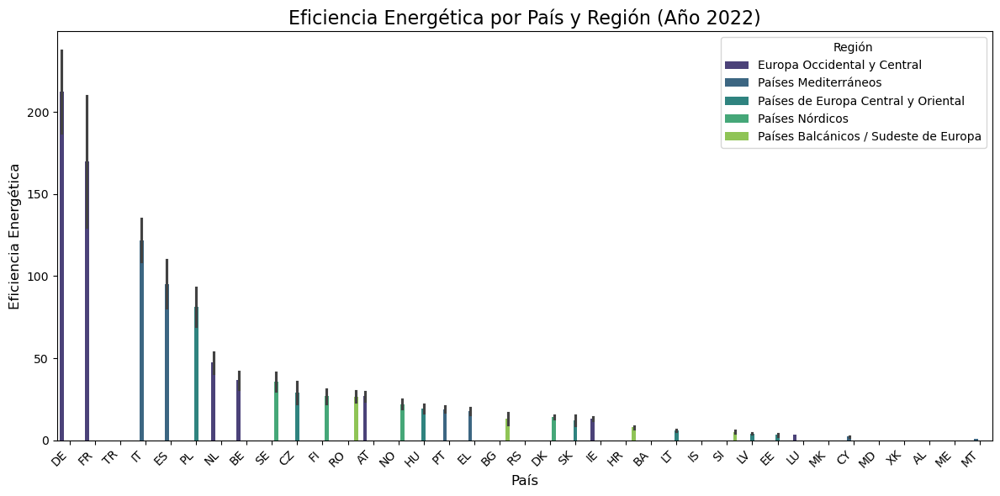

In [185]:
# --- 1. Crear el gráfico ---
plt.figure(figsize=(12, 6))

# Usamos Seaborn para un gráfico de barras agrupadas, lo que facilita la comparación por región.
sns.barplot(
    data=eficiencia_energetica.sort_values(by='eficiencia_energetica', ascending=False),
    x='geo',
    y='eficiencia_energetica',
    hue='Region',  # Esto agrupa las barras por región
    palette='viridis'
)

# --- 2. Añadir títulos y etiquetas para que el gráfico sea comprensible ---
plt.title('Eficiencia Energética por País y Región (Año 2022)', fontsize=16)
plt.xlabel('País', fontsize=12)
plt.ylabel('Eficiencia Energética', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotamos las etiquetas del eje X para que sean legibles
plt.legend(title='Región')

# --- 3. Mostrar el gráfico ---
plt.tight_layout() # Ajusta el diseño para que no se superpongan los elementos
plt.show()

### 5.2.1.- Correlacion entre eficiencia economica y eficiencia energetica segun la situacion de ingreso en relacion al umbral de pobreza

In [186]:
# Asume que los DataFrames se llaman Impago_de_facturas y Intensidad_energetica
# y tienen las columnas 'geo' y 'TIME_PERIOD'

# Unimos los DataFrames de eficiencia e incapacidad
df_eficiencia_incapacidad = pd.merge(
    eficiencia_energetica,
    Incapacidad_mantener_caliente_hogares,
    on=['geo','Region'],
    how='inner'
)

print("✅ Correlación por país: Privacion material vs. Eficiencia Energética")
# Agrupamos por región y luego por país para un análisis granular
for region, df_region in df_eficiencia_incapacidad .groupby('Region'):
    print(f"\n--- {region} ---")
    for geo, df_geo in df_region.groupby('Income situation in relation to the risk of poverty threshold'):
        if len(df_geo) > 1: # Aseguramos que haya suficientes datos para la correlación
            # Aseguramos que las columnas existen antes de usarlas
            if 'incapacidad_calentar_hogar' in df_geo.columns and 'eficiencia_energetica' in df_geo.columns:
                correlacion = df_geo['incapacidad_calentar_hogar'].corr(df_geo['eficiencia_energetica'])
                print(f"   {geo}: {correlacion:.2f}")

✅ Correlación por país: Privacion material vs. Eficiencia Energética

--- Europa Occidental y Central ---
   Above 60% of median equivalised income: 0.73
   Below 60% of median equivalised income: 0.52
   Total: 0.71

--- Países Balcánicos / Sudeste de Europa ---
   Above 60% of median equivalised income: 0.47
   Below 60% of median equivalised income: 0.36
   Total: 0.46

--- Países Mediterráneos ---
   Above 60% of median equivalised income: -0.06
   Below 60% of median equivalised income: -0.21
   Total: -0.07

--- Países Nórdicos ---
   Above 60% of median equivalised income: -0.02
   Below 60% of median equivalised income: -0.45
   Total: -0.09

--- Países de Europa Central y Oriental ---
   Above 60% of median equivalised income: -0.24
   Below 60% of median equivalised income: -0.40
   Total: -0.33


In [187]:
eficiencia_energetica.columns

Index(['Time frequency', 'nrg_bal', 'Energy balance', 'unit',
       'Unit of measure', 'geo', 'TIME_PERIOD', 'eficiencia_energetica',
       'Region'],
      dtype='object')

## Intensidad Energetica por densidad de consumo

# COLOCAR LA RUTA DEL ARHIVO CSV DE POBLACION

In [188]:
ruta = r'C:/Users/user/Desktop/Master en Ciencias de Datos aplicada a las Ciencias Sociales/Ciencias de datos e intervencion social/Trabajo Final CIS/SYB67_1_202411_Population, Surface Area and Density.csv'

try:
    data_superficie = pd.read_csv(ruta, skiprows=1, encoding='latin1')  # o prueba 'ISO-8859-1' o 'cp1252'
    print("Archivo cargado exitosamente")
except FileNotFoundError:
    print("Archivo no encontrado")
except UnicodeDecodeError as e:
    print(f"Error de codificación: {e}")

Archivo cargado exitosamente


In [189]:
data_superficie

,Region/Country/Area,Unnamed: 1,Year,Series,Value,Footnotes,Source
0,1,"Total, all countries or areas",2010,Population mid-year estimates (millions),"7,021.73",NaN,"United Nations Population Division, New York, ..."
1,1,"Total, all countries or areas",2010,Population mid-year estimates for males (milli...,"3,533.14",NaN,"United Nations Population Division, New York, ..."
2,1,"Total, all countries or areas",2010,Population mid-year estimates for females (mil...,"3,488.59",NaN,"United Nations Population Division, New York, ..."
3,1,"Total, all countries or areas",2010,Sex ratio (males per 100 females),101.3,NaN,"United Nations Population Division, New York, ..."
4,1,"Total, all countries or areas",2010,Population aged 0 to 14 years old (percentage),27.3,Calculated by the UN Statistics Division.,"United Nations Population Division, New York, ..."
...,...,...,...,...,...,...,...
7705,722,SIDS,2024,Population mid-year estimates for females (mil...,36.77,Projected estimate (medium fertility variant).,"United Nations Population Division, New York, ..."
7706,722,SIDS,2024,Sex ratio (males per 100 females),99.8,Projected estimate (medium fertility variant).,"United Nations Population Division, New York, ..."
7707,722,SIDS,2024,Population aged 0 to 14 years old (percentage),24.5,Projected estimate (medium fertility variant)....,"United Nations Population Division, New York, ..."
7708,722,SIDS,2024,Population aged 60+ years old (percentage),13.8,Projected estimate (medium fertility variant)....,"United Nations Population Division, New York, ..."


In [190]:
# Obtener los valores únicos de la columna 'series'
valores_unicos =  data_superficie['Series'].unique()

# Mostrar los valores únicos
print(valores_unicos)

['Population mid-year estimates (millions)'
 'Population mid-year estimates for males (millions)'
 'Population mid-year estimates for females (millions)'
 'Sex ratio (males per 100 females)'
 'Population aged 0 to 14 years old (percentage)'
 'Population aged 60+ years old (percentage)' 'Population density'
 'Surface area (thousand km2)']


In [191]:
# Lista de nombres que NO son países, sino regiones, áreas o continentes
regiones_areas = [
    'Total, all countries or areas', 'Africa', 'Northern Africa',
    'Sub-Saharan Africa', 'Eastern Africa', 'Middle Africa',
    'Southern Africa', 'Western Africa', 'Americas', 'Northern America',
    'Latin America & the Caribbean', 'Caribbean', 'Central America',
    'South America', 'Asia', 'Central Asia', 'Eastern Asia',
    'South-central Asia', 'South-eastern Asia', 'Southern Asia',
    'Western Asia', 'Europe', 'Eastern Europe', 'Northern Europe',
    'Southern Europe', 'Western Europe', 'Oceania',
    'Australia and New Zealand'
]

# Crear la nueva columna 'Tipo'
data_superficie['Tipo'] =  data_superficie['Unnamed: 1'].apply(lambda x: 'Región/Área' if x in regiones_areas else 'geo')
### df.groupby('Tipo').agg(...)  # o filtrar, graficar, comparar
data_superficie.head(5)

,Region/Country/Area,Unnamed: 1,Year,Series,Value,Footnotes,Source,Tipo
0,1,"Total, all countries or areas",2010,Population mid-year estimates (millions),"7,021.73",NaN,"United Nations Population Division, New York, ...",Región/Área
1,1,"Total, all countries or areas",2010,Population mid-year estimates for males (milli...,"3,533.14",NaN,"United Nations Population Division, New York, ...",Región/Área
2,1,"Total, all countries or areas",2010,Population mid-year estimates for females (mil...,"3,488.59",NaN,"United Nations Population Division, New York, ...",Región/Área
3,1,"Total, all countries or areas",2010,Sex ratio (males per 100 females),101.3,NaN,"United Nations Population Division, New York, ...",Región/Área
4,1,"Total, all countries or areas",2010,Population aged 0 to 14 years old (percentage),27.3,Calculated by the UN Statistics Division.,"United Nations Population Division, New York, ...",Región/Área


In [192]:
# Filtrar solo los registros para Surface area
data_superficie = data_superficie[data_superficie['Series'] == 'Surface area (thousand km2)']

# Pivotear solo con ese indicador
data_pivoted = data_superficie.pivot_table(index=['Region/Country/Area', 'Unnamed: 1','Year','Tipo'], 
                                        columns='Series', 
                                        values='Value', 
                                        aggfunc='first').reset_index()
data_pivoted.columns

Index(['Region/Country/Area', 'Unnamed: 1', 'Year', 'Tipo',
       'Surface area (thousand km2)'],
      dtype='object', name='Series')

In [193]:
data_pivoted['Tipo'].unique()

array(['Región/Área', 'geo'], dtype=object)

In [194]:
# Filtramos el DataFrame para seleccionar solo las filas donde el valor
# de la columna 'Region' es igual al valor de la columna 'geo'.
df_filtrado_por_pais = data_pivoted[data_pivoted['Tipo'] == 'geo'].copy()

# Muestra el resultado para confirmar que el filtro funcionó.
print("✅ DataFrame filtrado con datos solo a nivel de país:")
print(df_filtrado_por_pais.head())

✅ DataFrame filtrado con datos solo a nivel de país:
Series  Region/Country/Area      Unnamed: 1  Year Tipo  \
2                         4     Afghanistan  2022  geo   
4                         8         Albania  2022  geo   
7                        12         Algeria  2022  geo   
11                       16  American Samoa  2022  geo   
15                       20         Andorra  2022  geo   

Series Surface area (thousand km2)  
2                              653  
4                               29  
7                            2,382  
11                               0  
15                               0  


In [195]:
df_filtrado_por_pais['Unnamed: 1'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'American Samoa', 'Andorra',
       'Angola', 'Antigua and Barbuda', 'Azerbaijan', 'Argentina',
       'Australia', 'Austria', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Armenia', 'Barbados', 'Melanesia', 'Belgium', 'Micronesia',
       'Bermuda', 'Polynesia', 'Bhutan', 'Bolivia (Plurin. State of)',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Belize',
       'Solomon Islands', 'British Virgin Islands', 'Brunei Darussalam',
       'Bulgaria', 'Myanmar', 'Burundi', 'Belarus', 'Cambodia',
       'Cameroon', 'Canada', 'Cabo Verde', 'Cayman Islands',
       'Central African Republic', 'Sri Lanka', 'Chad', 'Chile', 'China',
       'Colombia', 'Comoros', 'Congo', 'Dem. Rep. of the Congo',
       'Cook Islands', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus',
       'Czechia', 'Benin', 'Denmark', 'Dominica', 'Dominican Republic',
       'Ecuador', 'El Salvador', 'Equatorial Guinea', 'Ethiopia',
       'Eritrea', 'Estonia', 'Faroe Islands',
  

In [196]:
# El mapeo de países a códigos ISO que me proporcionaste.
mapeo_paises_iso = {
    'Albania': 'AL',
    'Austria': 'AT',
    'Bosnia and Herzegovina': 'BA',
    'Belgium': 'BE',
    'Bulgaria': 'BG',
    'Cyprus': 'CY',
    'Czechia': 'CZ',
    'Germany': 'DE',
    'Denmark': 'DK',
    'Estonia': 'EE',
    'Greece': 'EL',
    'Spain': 'ES',
    'Finland': 'FI',
    'France': 'FR',
    'Georgia': 'GE',
    'Croatia': 'HR',
    'Hungary': 'HU',
    'Ireland': 'IE',
    'Iceland': 'IS',
    'Italy': 'IT',
    'Lithuania': 'LT',
    'Luxembourg': 'LU',
    'Latvia': 'LV',
    'Moldova': 'MD',
    'Montenegro': 'ME',
    'North Macedonia': 'MK',
    'Malta': 'MT',
    'Netherlands (Kingdom of the)': 'NL',
    'Norway': 'NO',
    'Poland': 'PL',
    'Portugal': 'PT',
    'Romania': 'RO',
    'Serbia': 'RS',
    'Sweden': 'SE',
    'Switzerland':'SZ',
    'Slovenia': 'SI',
    'Slovakia': 'SK',
    'TÃ¼rkiye': 'TR',
    'Ukraine': 'UA',
    'United Kingdom': 'UK',
    'Kosovo*': 'XK'
}

# Obtener la lista de nombres de países del mapeo
paises_a_seleccionar = list(mapeo_paises_iso.keys())

# Usar .isin() para filtrar tu DataFrame por la columna 'Unnamed: 1'
df_europeo_filtrado = df_filtrado_por_pais[df_filtrado_por_pais['Unnamed: 1'].isin(paises_a_seleccionar)].copy()

print("✅ DataFrame filtrado correctamente por la columna 'Unnamed: 1':")
print(df_europeo_filtrado.head())

✅ DataFrame filtrado correctamente por la columna 'Unnamed: 1':
Series  Region/Country/Area              Unnamed: 1  Year Tipo  \
4                         8                 Albania  2022  geo   
26                       40                 Austria  2022  geo   
34                       56                 Belgium  2022  geo   
41                       70  Bosnia and Herzegovina  2022  geo   
48                      100                Bulgaria  2022  geo   

Series Surface area (thousand km2)  
4                               29  
26                              84  
34                              31  
41                              51  
48                             110  


In [197]:
df_europeo_filtrado['geo'] = df_europeo_filtrado['Unnamed: 1'].map(mapeo_paises_iso)

print(df_europeo_filtrado)

Series  Region/Country/Area                    Unnamed: 1  Year Tipo  \
4                         8                       Albania  2022  geo   
26                       40                       Austria  2022  geo   
34                       56                       Belgium  2022  geo   
41                       70        Bosnia and Herzegovina  2022  geo   
48                      100                      Bulgaria  2022  geo   
74                      191                       Croatia  2022  geo   
76                      196                        Cyprus  2022  geo   
78                      203                       Czechia  2022  geo   
80                      208                       Denmark  2022  geo   
88                      233                       Estonia  2022  geo   
92                      246                       Finland  2022  geo   
93                      250                        France  2022  geo   
98                      268                       Georgia  2022 

In [198]:
df_europeo_filtrado['geo'].unique()

array(['AL', 'AT', 'BE', 'BA', 'BG', 'HR', 'CY', 'CZ', 'DK', 'EE', 'FI',
       'FR', 'GE', 'DE', 'EL', 'HU', 'IS', 'IE', 'IT', 'LV', 'LT', 'LU',
       'MT', 'ME', 'NL', 'NO', 'PL', 'PT', 'RO', 'RS', 'SK', 'SI', 'ES',
       'SE', 'SZ', 'TR', 'UA', 'MK', 'UK'], dtype=object)

In [199]:
# Suponiendo que tu DataFrame se llama 'df_data'
columnas_a_seleccionar = ['geo', 'Surface area (thousand km2)']

# Creamos un nuevo DataFrame con solo las columnas que te interesan
df_area_filtrado = df_europeo_filtrado[columnas_a_seleccionar]

print("✅ DataFrame con solo las columnas de geo y área de superficie:")
print(df_area_filtrado.head(10))

✅ DataFrame con solo las columnas de geo y área de superficie:
Series geo Surface area (thousand km2)
4       AL                          29
26      AT                          84
34      BE                          31
41      BA                          51
48      BG                         110
74      HR                          57
76      CY                           9
78      CZ                          79
80      DK                          43
88      EE                          45


In [200]:
# Definimos un diccionario con los valores de área en 'mil km2'
# para los países que tienen datos faltantes.
areas_faltantes = {
    'NL': 41.54, # Holanda
    'TR': 783.56, # Turquía
    'MT': 0.32  # Malta
}

# Usamos un bucle para asignar el área a cada país.
# El método .loc asegura que se asignen los valores correctamente.
for geo, area in areas_faltantes.items():
    df_area_filtrado.loc[df_area_filtrado['geo'] == geo, 'Surface area (thousand km2)'] = area

print("✅ Valores de área asignados en el DataFrame 'df_area_filtrado'.")
print(df_area_filtrado[['geo', 'Surface area (thousand km2)']].head(10))

✅ Valores de área asignados en el DataFrame 'df_area_filtrado'.
Series geo Surface area (thousand km2)
4       AL                          29
26      AT                          84
34      BE                          31
41      BA                          51
48      BG                         110
74      HR                          57
76      CY                           9
78      CZ                          79
80      DK                          43
88      EE                          45


In [201]:
df_area_filtrado.columns

Index(['geo', 'Surface area (thousand km2)'], dtype='object', name='Series')

In [202]:
# Unir df_final con el DataFrame de área de superficie.
# La unión se realiza ÚNICAMENTE en la columna 'geo'.
df_final = pd.merge(
    df_final,
    df_area_filtrado[['geo', 'Surface area (thousand km2)']].copy(),
    on='geo',
    how='left'
)

# Ahora, puedes verificar que la columna de área se ha añadido correctamente.
print("✅ DataFrame final con la columna de área de superficie integrada:")
print(df_final.head())

✅ DataFrame final con la columna de área de superficie integrada:
  geo                       Region  rango_banda  decil_numerico  \
0  AT  Europa Occidental y Central            1               1   
1  AT  Europa Occidental y Central            2               1   
2  AT  Europa Occidental y Central            2               2   
3  AT  Europa Occidental y Central            3               2   
4  AT  Europa Occidental y Central            3               3   

   porcentaje_distribuido  hogares_brutos_banda  share_income_mediana  \
0                     2.6              107855.8                 0.085   
1                     7.4              306974.2                 0.085   
2                     8.9              369198.7                 0.085   
3                     1.1               45631.3                 0.085   
4                    10.0              414830.0                 0.085   

   mediana_ingreso  ingreso_por_decil_mediana  precio_kwh  min_kwh  max_kwh  \
0            

In [203]:
# Paso 1: Convertir la columna de área de superficie a un tipo de dato numérico
df_final['Surface area (thousand km2)'] = pd.to_numeric(
    df_final['Surface area (thousand km2)'],
    errors='coerce'  # Esto convierte cualquier valor no numérico a NaN
)

# Paso 2: Ahora, calcula la densidad de hogares
df_final['densidad_hogares'] = np.where(
    df_final['Surface area (thousand km2)'].notna() & (df_final['Surface area (thousand km2)'] > 0),
    df_final['hogares_brutos_banda'] / (df_final['Surface area (thousand km2)'] * 1000),  # Multiplicamos por 1000 para pasar de miles de km2 a km2
    0
)

# Paso 3: Muestra las columnas clave para verificar el resultado
columnas_finales = ['geo', 'decil_numerico', 'hogares_brutos_banda', 'min_kwh','max_kwh','Surface area (thousand km2)', 'densidad_hogares', 'Region']
print("✅ DataFrame con la densidad de hogares calculada correctamente:")
print(df_final[columnas_finales].head(50))

✅ DataFrame con la densidad de hogares calculada correctamente:
   geo  decil_numerico  hogares_brutos_banda  min_kwh  max_kwh  \
0   AT               1           107855.8000      0.0   1000.0   
1   AT               1           306974.2000   1000.0   2499.0   
2   AT               2           369198.7000   1000.0   2499.0   
3   AT               2            45631.3000   2500.0   4999.0   
4   AT               3           414830.0000   2500.0   4999.0   
5   AT               4           414830.0000   2500.0   4999.0   
6   AT               5           336012.3000   2500.0   4999.0   
7   AT               5            78817.7000   5000.0  14999.0   
8   AT               6           414830.0000   5000.0  14999.0   
9   AT               7           414830.0000   5000.0  14999.0   
10  AT               8           414830.0000   5000.0  14999.0   
11  AT               9           306974.2000   5000.0  14999.0   
12  AT               9           107855.8000  15000.0  25000.0   
13  AT      

In [204]:
# Aseguramos que la columna de área sea numérica
df_final['Surface area (thousand km2)'] = pd.to_numeric(
    df_final['Surface area (thousand km2)'], errors='coerce'
)

df_densidad_por_decil = df_final.groupby(['geo','decil_numerico', 'rango_banda']).agg(
    hogares_brutos_decil=('hogares_brutos_banda', 'sum'),
    area_km2=('Surface area (thousand km2)', 'first'),
    consumo_max_kwh=('max_kwh', 'max'),      # <-- Nueva columna para el consumo máximo
    consumo_min_kwh=('min_kwh', 'min'),      # <-- Nueva columna para el consumo mínimo
    ingreso_mediano=('ingreso_por_decil_mediana', 'median'),
    Porcentaje_hogares=('porcentaje_distribuido','first'),
    Region=('Region', 'first') # <-- Nueva columna para el ingreso mediano
).reset_index()

# Calculamos la densidad de hogares por decil
df_densidad_por_decil['densidad_hogares'] = np.where(
    df_densidad_por_decil['area_km2'].notna() & (df_densidad_por_decil['area_km2'] > 0),
    df_densidad_por_decil['hogares_brutos_decil'] / (df_densidad_por_decil['area_km2'] * 1000),
    0
)

# Mostramos el resultado
print("✅ Densidad de hogares calculada únicamente por decil:")
print(df_densidad_por_decil.head(20))

✅ Densidad de hogares calculada únicamente por decil:
   geo  decil_numerico  rango_banda  hogares_brutos_decil  area_km2  \
0   AT               1            1           107855.8000      84.0   
1   AT               1            2           306974.2000      84.0   
2   AT               2            2           369198.7000      84.0   
3   AT               2            3            45631.3000      84.0   
4   AT               3            3           414830.0000      84.0   
5   AT               4            3           414830.0000      84.0   
6   AT               5            3           336012.3000      84.0   
7   AT               5            4            78817.7000      84.0   
8   AT               6            4           414830.0000      84.0   
9   AT               7            4           414830.0000      84.0   
10  AT               8            4           414830.0000      84.0   
11  AT               9            4           306974.2000      84.0   
12  AT               9 

In [205]:
df_densidad_por_decil.columns

Index(['geo', 'decil_numerico', 'rango_banda', 'hogares_brutos_decil',
       'area_km2', 'consumo_max_kwh', 'consumo_min_kwh', 'ingreso_mediano',
       'Porcentaje_hogares', 'Region', 'densidad_hogares'],
      dtype='object')

## 5.3.- Analisis de la densidad de consumo

In [206]:
# Nota: Este código asume que tu DataFrame se llama 'df_densidad_por_decil'
# y que ya contiene las columnas que se muestran en el índice.

# 2. Calculamos el consumo TOTAL por segmento
# Evitamos la división por cero
df_densidad_por_decil['consumo_total_max_segmento'] = np.where(
    df_densidad_por_decil['densidad_hogares'] > 0,
    df_densidad_por_decil['consumo_max_kwh'] * df_densidad_por_decil['hogares_brutos_decil'],
    0
)

df_densidad_por_decil['consumo_total_min_segmento'] = np.where(
    df_densidad_por_decil['densidad_hogares'] > 0,
    df_densidad_por_decil['consumo_min_kwh'] * df_densidad_por_decil['hogares_brutos_decil'],
    0
)

# Mostramos el DataFrame con las nuevas columnas
print("✅ Cálculos de consumo total por segmento finalizados:")
print(df_densidad_por_decil.head())

✅ Cálculos de consumo total por segmento finalizados:
  geo  decil_numerico  rango_banda  hogares_brutos_decil  area_km2  \
0  AT               1            1              107855.8      84.0   
1  AT               1            2              306974.2      84.0   
2  AT               2            2              369198.7      84.0   
3  AT               2            3               45631.3      84.0   
4  AT               3            3              414830.0      84.0   

   consumo_max_kwh  consumo_min_kwh  ingreso_mediano  Porcentaje_hogares  \
0           1000.0              0.0     11467.447059                 2.6   
1           2499.0           1000.0     11467.447059                 7.4   
2           2499.0           1000.0     19975.552941                 8.9   
3           4999.0           2500.0     19975.552941                 1.1   
4           4999.0           2500.0     24414.564706                10.0   

                        Region  densidad_hogares  consumo_total_max_

In [207]:
df_densidad_por_decil.columns

Index(['geo', 'decil_numerico', 'rango_banda', 'hogares_brutos_decil',
       'area_km2', 'consumo_max_kwh', 'consumo_min_kwh', 'ingreso_mediano',
       'Porcentaje_hogares', 'Region', 'densidad_hogares',
       'consumo_total_max_segmento', 'consumo_total_min_segmento'],
      dtype='object')

In [208]:
df_densidad_por_decil.columns

Index(['geo', 'decil_numerico', 'rango_banda', 'hogares_brutos_decil',
       'area_km2', 'consumo_max_kwh', 'consumo_min_kwh', 'ingreso_mediano',
       'Porcentaje_hogares', 'Region', 'densidad_hogares',
       'consumo_total_max_segmento', 'consumo_total_min_segmento'],
      dtype='object')

In [209]:
# -----------------------------------------------------------------------------
# Paso 1: Cálculo del Consumo Total por Segmento (corregido)
# -----------------------------------------------------------------------------
# Primero, calculamos el consumo promedio en cada banda para tener un valor representativo
df_densidad_por_decil['consumo_promedio_kwh'] = (df_densidad_por_decil['consumo_max_kwh'] + df_densidad_por_decil['consumo_min_kwh']) / 2

# Ahora, calculamos el consumo TOTAL del segmento (multiplicando el promedio por el número de hogares)
df_densidad_por_decil['consumo_total_segmento'] = df_densidad_por_decil['consumo_promedio_kwh'] * df_densidad_por_decil['hogares_brutos_decil']

# -----------------------------------------------------------------------------
# Paso 2: Cálculo del Consumo Porcentual por Segmento (sin cambios)
# -----------------------------------------------------------------------------
consumo_total_pais = df_densidad_por_decil.groupby('geo')['consumo_total_segmento'].transform('sum')
df_densidad_por_decil['consumo_porcentual'] = (df_densidad_por_decil['consumo_total_segmento'] / consumo_total_pais) * 100
df_densidad_por_decil['consumo_porcentual'] = df_densidad_por_decil['consumo_porcentual'].fillna(0)

# -----------------------------------------------------------------------------
# Paso 3: Consolidar el Consumo Porcentual por Decil (sin cambios)
# -----------------------------------------------------------------------------
df_por_decil = df_densidad_por_decil.groupby(
    ['geo', 'Region', 'decil_numerico']
).agg(
    consumo_porcentual_total=('consumo_porcentual', 'sum')
).reset_index()

df_por_decil['consumo_porcentual_total'] = df_por_decil['consumo_porcentual_total'].round(2)
print("✅ DataFrame consolidado por Decil:")
print(df_por_decil.head(10))

# -----------------------------------------------------------------------------
# Paso 4: Generar el Gráfico de Barras para la Contribución de cada Decil (sin cambios)
# -----------------------------------------------------------------------------
# ... el resto del código del gráfico es el mismo.
# -----------------------------------------------------------------------------
# Paso 4: Generar el Gráfico de Barras para la Contribución de cada Decil
# -----------------------------------------------------------------------------
regiones_unicas = df_por_decil['Region'].unique()

for region in regiones_unicas:
    df_region = df_por_decil[df_por_decil['Region'] == region].copy()
    
    fig = px.bar(
        df_region,
        x='decil_numerico',
        y='consumo_porcentual_total',
        color='geo',
        facet_col='geo', 
        facet_col_wrap=3,
        title=f'Consumo Porcentual Total por Decil de Ingreso en {region}',
        labels={
            'decil_numerico': 'Decil de Ingreso',
            'consumo_porcentual_total': 'Porcentaje de Consumo Nacional (%)',
            'geo': 'País'
        },
        text_auto=True,  # ¡Esta es la clave! Agrega los valores de 'y' encima de cada barra.
        # --- NUEVO CÓDIGO: Ajustar el tamaño del gráfico ---
        height=1000,
        width=1600
    )
    
    fig.update_layout(showlegend=False)
    fig.show()


✅ DataFrame consolidado por Decil:
  geo                       Region  decil_numerico  consumo_porcentual_total
0  AT  Europa Occidental y Central               1                      1.82
1  AT  Europa Occidental y Central               2                      2.51
2  AT  Europa Occidental y Central               3                      4.78
3  AT  Europa Occidental y Central               4                      4.78
4  AT  Europa Occidental y Central               5                      6.29
5  AT  Europa Occidental y Central               6                     12.75
6  AT  Europa Occidental y Central               7                     12.75
7  AT  Europa Occidental y Central               8                     12.75
8  AT  Europa Occidental y Central               9                     16.07
9  AT  Europa Occidental y Central              10                     25.50


In [210]:
# Creamos una copia de seguridad para trabajar
df_analisis = df_por_decil.copy()

# 1. Creamos la columna 'grupo_decil' para agrupar
def asignar_grupo_decil(decil):
    if decil <= 3:
        return '30% más bajo'
    elif decil <= 7:
        return '40% intermedio'
    else:
        return '30% más alto'

df_analisis['grupo_decil'] = df_analisis['decil_numerico'].apply(asignar_grupo_decil)

# 2. Agrupamos por Región, País y Grupo de Decil
# Solo sumamos el 'consumo_porcentual_total'
df_consolidado_geo = df_analisis.groupby(
    ['Region', 'geo', 'grupo_decil']
)['consumo_porcentual_total'].sum().reset_index()

# 3. Opcional: Reordenar las filas para una mejor visualización
orden_grupos = ['30% más bajo', '40% intermedio', '30% más alto']
df_consolidado_geo['grupo_decil'] = pd.Categorical(df_consolidado_geo['grupo_decil'], categories=orden_grupos, ordered=True)
df_consolidado_geo = df_consolidado_geo.sort_values(['Region', 'geo', 'grupo_decil']).reset_index(drop=True)

print("✅ DataFrame consolidado por grupos de deciles y por país:")
print(df_consolidado_geo.head(150))

✅ DataFrame consolidado por grupos de deciles y por país:
                                 Region geo     grupo_decil  \
0           Europa Occidental y Central  AT    30% más bajo   
1           Europa Occidental y Central  AT  40% intermedio   
2           Europa Occidental y Central  AT    30% más alto   
3           Europa Occidental y Central  BE    30% más bajo   
4           Europa Occidental y Central  BE  40% intermedio   
..                                  ...  ..             ...   
79  Países de Europa Central y Oriental  PL  40% intermedio   
80  Países de Europa Central y Oriental  PL    30% más alto   
81  Países de Europa Central y Oriental  SK    30% más bajo   
82  Países de Europa Central y Oriental  SK  40% intermedio   
83  Países de Europa Central y Oriental  SK    30% más alto   

    consumo_porcentual_total  
0                       9.11  
1                      36.57  
2                      54.32  
3                       8.74  
4                      33.95  

In [211]:
# Asegúrate de que este es el nombre de tu DataFrame consolidado
print(df_consolidado_geo.to_string())

                                   Region geo     grupo_decil  consumo_porcentual_total
0             Europa Occidental y Central  AT    30% más bajo                      9.11
1             Europa Occidental y Central  AT  40% intermedio                     36.57
2             Europa Occidental y Central  AT    30% más alto                     54.32
3             Europa Occidental y Central  BE    30% más bajo                      8.74
4             Europa Occidental y Central  BE  40% intermedio                     33.95
5             Europa Occidental y Central  BE    30% más alto                     57.31
6             Europa Occidental y Central  DE    30% más bajo                      7.63
7             Europa Occidental y Central  DE  40% intermedio                     24.19
8             Europa Occidental y Central  DE    30% más alto                     68.18
9             Europa Occidental y Central  FR    30% más bajo                     10.54
10            Europa Occidental 

In [212]:
# Suponemos que ya has ejecutado los pasos 1, 2 y 3 de tu código
# y tienes el DataFrame 'df_por_decil' listo.

# --- VERIFICACIÓN: Sumar el Porcentaje de Consumo por País ---
# Agrupamos por país ('geo') y sumamos el 'consumo_porcentual_total'
# para asegurarnos de que el total sea 100%.
df_verificacion_total = df_por_decil.groupby('geo')['consumo_porcentual_total'].sum().reset_index()

# Redondeamos el resultado para una mejor visualización.
df_verificacion_total['consumo_porcentual_total'] = df_verificacion_total['consumo_porcentual_total'].round(2)

print("✅ Verificación del Consumo Porcentual por País:")
print(df_verificacion_total)

✅ Verificación del Consumo Porcentual por País:
   geo  consumo_porcentual_total
0   AT                    100.00
1   BE                    100.00
2   BG                     99.98
3   CY                    100.00
4   CZ                     99.99
5   DE                    100.00
6   DK                    100.00
7   EE                    100.01
8   EL                    100.01
9   ES                    100.02
10  FI                    100.01
11  FR                     99.99
12  HR                    100.00
13  HU                    100.00
14  IE                    100.02
15  IT                    100.01
16  LT                    100.01
17  LU                    100.01
18  LV                    100.00
19  MT                    100.02
20  NL                    100.01
21  NO                     99.98
22  PL                     99.99
23  PT                     99.99
24  RO                    100.01
25  SE                    100.02
26  SI                    100.03
27  SK                    10

In [213]:
Impago_de_facturas.columns

Index(['Time frequency', 'hhtyp', 'Type of household',
       'Income situation in relation to the risk of poverty threshold', 'unit',
       'Unit of measure', 'geo', 'TIME_PERIOD', 'porcentaje_impago_facturas',
       'Region'],
      dtype='object')

In [214]:
# -----------------------------------------------------------------------------
# Paso 1: Cargar y preparar los datos (usando el DataFrame de consumo)
# -----------------------------------------------------------------------------
# Asume que tu DataFrame consolidado por decil se llama df_por_decil
# que tiene las columnas 'geo', 'Region', 'decil_numerico' y 'consumo_porcentual_total'

# Creamos una copia para trabajar
df_analisis_consumo = df_por_decil.copy()

# -----------------------------------------------------------------------------
# Paso 2: Agrupar por país, región y grupo de deciles
# -----------------------------------------------------------------------------
# Creamos la columna 'grupo_decil'
def asignar_grupo_decil(decil):
    if decil <= 3:
        return '30% más bajo'
    elif decil <= 7:
        return '40% intermedio'
    else:
        return '30% más alto'

df_analisis_consumo['grupo_decil'] = df_analisis_consumo['decil_numerico'].apply(asignar_grupo_decil)

# Agrupamos los datos y sumamos el consumo porcentual
df_consolidado_consumo = df_analisis_consumo.groupby(
    ['Region', 'geo', 'grupo_decil']
)['consumo_porcentual_total'].sum().reset_index()

# Opcional: Reordenar las filas
orden_grupos = ['30% más bajo', '40% intermedio', '30% más alto']
df_consolidado_consumo['grupo_decil'] = pd.Categorical(df_consolidado_consumo['grupo_decil'], categories=orden_grupos, ordered=True)
df_consolidado_consumo = df_consolidado_consumo.sort_values(['Region', 'geo', 'grupo_decil']).reset_index(drop=True)

# -----------------------------------------------------------------------------
# Paso 3: Generar el Gráfico de Barras para el Consumo
# -----------------------------------------------------------------------------
# Iteramos por cada región para generar los gráficos
regiones_unicas = df_consolidado_consumo['Region'].unique()

for region in regiones_unicas:
    df_region = df_consolidado_consumo[df_consolidado_consumo['Region'] == region].copy()
    
    fig = px.bar(
        df_region,
        x='grupo_decil',
        y='consumo_porcentual_total',
        color='geo',
        facet_col='geo',
        facet_col_wrap=3,
        title=f'Concentración del Consumo de Energía por Grupo de Deciles en {region}',
        labels={
            'grupo_decil': 'Grupo de Decil de Ingreso',
            'consumo_porcentual_total': 'Porcentaje de Consumo Nacional (%)',
            'geo': 'País'
        },
        text_auto=True,
        height=1000,
        width=1200
    )
    
    fig.update_layout(showlegend=False)
    fig.show()

## 5.4.- Concentracion de la carga economica

In [215]:
df_final.columns

Index(['geo', 'Region', 'rango_banda', 'decil_numerico',
       'porcentaje_distribuido', 'hogares_brutos_banda',
       'share_income_mediana', 'mediana_ingreso', 'ingreso_por_decil_mediana',
       'precio_kwh', 'min_kwh', 'max_kwh', 'costo_min', 'costo_max',
       'carga_economica_mediana_minima', 'carga_economica_mediana_maxima',
       'Surface area (thousand km2)', 'densidad_hogares'],
      dtype='object')

In [216]:
# Assuming your DataFrame is named df_final and includes 'hogares_brutos_decil'

# Paso 1: Calcular la carga económica absoluta de cada hogar (en valores monetarios).
# Esto está bien.
df_final['carga_economica_por_hogar'] = (
    (df_final['carga_economica_mediana_maxima'] / 100) * df_final['mediana_ingreso']
)

# Paso 2: Calcular la carga económica total de cada segmento.
# La corrección está aquí: multiplicas por el número de hogares.
df_final['carga_economica_total_segmento'] = (
    df_final['carga_economica_por_hogar'] * df_final['hogares_brutos_banda']
)

# Paso 3: Calcular el total de la carga económica por país.
# Ahora sumas los valores totales, lo cual es correcto.
df_total_por_pais = df_final.groupby(['geo']).agg(
    carga_economica_total=('carga_economica_total_segmento', 'sum')
).reset_index()

# Paso 4: Unir los totales de vuelta al DataFrame original.
df_final = pd.merge(
    df_final,
    df_total_por_pais,
    on='geo',
    how='left'
)

# Paso 5: Calcular el porcentaje de participación de cada segmento.
# Esto ahora es un cálculo de concentración preciso.
df_final['porcentaje_participacion'] = np.where(
    df_final['carga_economica_total'] > 0,
    (df_final['carga_economica_total_segmento'] / df_final['carga_economica_total']) * 100,
    0
)

# Ahora puedes agrupar y visualizar los resultados consolidados.
df_concentracion_final = df_final.groupby(['geo', 'decil_numerico', 'Region']).agg(
    porcentaje_participacion_total=('porcentaje_participacion', 'sum')
).reset_index()

# Ordenar para ver los segmentos con mayor concentración.
df_concentracion_carga_ordenada = df_concentracion_final.sort_values(
    'porcentaje_participacion_total',
    ascending=False
).reset_index(drop=True)

print("✅ Concentración de la carga económica corregida:")
print(df_concentracion_carga_ordenada.head(10))

✅ Concentración de la carga económica corregida:
  geo  decil_numerico                                 Region  \
0  HU               9    Países de Europa Central y Oriental   
1  NL              10            Europa Occidental y Central   
2  PL               9    Países de Europa Central y Oriental   
3  RO               9  Países Balcánicos / Sudeste de Europa   
4  NL               8            Europa Occidental y Central   
5  RO              10  Países Balcánicos / Sudeste de Europa   
6  PL              10    Países de Europa Central y Oriental   
7  NL               9            Europa Occidental y Central   
8  HU              10    Países de Europa Central y Oriental   
9  LT               9    Países de Europa Central y Oriental   

   porcentaje_participacion_total  
0                       23.094569  
1                       22.003367  
2                       21.659429  
3                       21.224666  
4                       20.412893  
5                       20.088

In [217]:
import pandas as pd
import numpy as np

# Creamos una copia del DataFrame final para agruparlo
df_visualizacion = df_concentracion_carga_ordenada.copy()

# Asignamos cada decil a un grupo (30% bajo, 40% medio, 30% alto)
def asignar_grupo_decil(decil):
    if decil <= 3:
        return '30% más bajo'
    elif decil <= 7:
        return '40% intermedio'
    else:
        return '30% más alto'

df_visualizacion['grupo_decil'] = df_visualizacion['decil_numerico'].apply(asignar_grupo_decil)

# Agrupamos por región, país y grupo de deciles, sumando el porcentaje de participación
df_consolidado_viz = df_visualizacion.groupby(['Region', 'geo', 'grupo_decil'])['porcentaje_participacion_total'].sum().reset_index()

# Reordenamos las filas para la visualización
orden_grupos = ['30% más bajo', '40% intermedio', '30% más alto']
df_consolidado_viz['grupo_decil'] = pd.Categorical(df_consolidado_viz['grupo_decil'], categories=orden_grupos, ordered=True)
df_consolidado_viz = df_consolidado_viz.sort_values(['Region', 'geo', 'grupo_decil']).reset_index(drop=True)

# Imprimimos todos los datos consolidados
print(df_consolidado_viz.to_string())

                                   Region geo     grupo_decil  porcentaje_participacion_total
0             Europa Occidental y Central  AT    30% más bajo                       20.200093
1             Europa Occidental y Central  AT  40% intermedio                       43.436721
2             Europa Occidental y Central  AT    30% más alto                       36.363185
3             Europa Occidental y Central  BE    30% más bajo                       19.692658
4             Europa Occidental y Central  BE  40% intermedio                       40.064739
5             Europa Occidental y Central  BE    30% más alto                       40.242604
6             Europa Occidental y Central  DE    30% más bajo                       22.729761
7             Europa Occidental y Central  DE  40% intermedio                       32.163995
8             Europa Occidental y Central  DE    30% más alto                       45.106244
9             Europa Occidental y Central  FR    30% más baj

In [218]:
df_concentracion_carga_ordenada.columns

Index(['geo', 'decil_numerico', 'Region', 'porcentaje_participacion_total'], dtype='object')

In [219]:
# ASUME que df_concentracion_carga_ordenada tiene las columnas 'Region' y 'geo'

# Iterate over each region to generate a faceted bar chart
for region, grupo_region in df_concentracion_carga_ordenada.groupby('Region'):
    # Round the participation percentage for cleaner text display
    grupo_region['porcentaje_participacion'] = grupo_region['porcentaje_participacion_total'].round(2)

    fig = px.bar(
        grupo_region,
        x='decil_numerico',
        y='porcentaje_participacion',
        color='geo',
        # Use a facet_col to create a new plot for each country
        facet_col='geo',
        facet_col_wrap=3, # Adjust number of columns as needed
        title=f'Concentración de la Carga Económica por Decil de Ingreso en {region}',
        labels={
            'decil_numerico': 'Deciles de Ingreso',
            'porcentaje_participacion': 'Carga Económica Total (%)',
            'geo': 'País'
        },
        height=1000,
        width=1500,
        hover_data={
            'decil_numerico': True,
            'porcentaje_participacion': ':.1f'
        },
        text='porcentaje_participacion'
    )

    fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')
    
    fig.update_layout(
        xaxis={'categoryorder': 'category ascending'},
        # Remove the duplicated x-axis titles from the subplots
        xaxis_title='Deciles de Ingreso',
        # Remove the duplicated y-axis titles from the subplots
        yaxis_title=None,
        # Improve spacing and layout
        margin={"t": 60, "b": 30, "l": 30, "r": 30}
    )
    fig.show()

In [220]:
# -----------------------------------------------------------------------------
# Paso 1: Cargar y preparar los datos de la carga económica
# -----------------------------------------------------------------------------
# Asumimos que tu DataFrame consolidado se llama df_concentracion_carga_ordenada
# y que ya tiene las columnas necesarias:
# 'Region', 'geo', 'decil_numerico' y 'porcentaje_participacion_total'

# Creamos una copia para trabajar
df_analisis_carga = df_concentracion_carga_ordenada.copy()

# -----------------------------------------------------------------------------
# Paso 2: Agrupar por país, región y grupo de deciles
# -----------------------------------------------------------------------------
# Creamos la columna 'grupo_decil' para la agrupación
def asignar_grupo_decil(decil):
    if decil <= 3:
        return '30% más bajo'
    elif decil <= 7:
        return '40% intermedio'
    else:
        return '30% más alto'

df_analisis_carga['grupo_decil'] = df_analisis_carga['decil_numerico'].apply(asignar_grupo_decil)

# Agrupamos los datos y sumamos el porcentaje de participación
df_consolidado_carga = df_analisis_carga.groupby(
    ['Region', 'geo', 'grupo_decil']
)['porcentaje_participacion_total'].sum().reset_index()

# Opcional: Reordenar las filas para la visualización
orden_grupos = ['30% más bajo', '40% intermedio', '30% más alto']
df_consolidado_carga['grupo_decil'] = pd.Categorical(df_consolidado_carga['grupo_decil'], categories=orden_grupos, ordered=True)
df_consolidado_carga = df_consolidado_carga.sort_values(['Region', 'geo', 'grupo_decil']).reset_index(drop=True)

# -----------------------------------------------------------------------------
# Paso 3: Generar el Gráfico de Barras para la Carga Económica
# -----------------------------------------------------------------------------
# Iteramos por cada región para generar los gráficos
regiones_unicas = df_consolidado_carga['Region'].unique()

for region in regiones_unicas:
    df_region = df_consolidado_carga[df_consolidado_carga['Region'] == region].copy()
    
    fig = px.bar(
        df_region,
        x='grupo_decil',
        y='porcentaje_participacion_total',
        color='geo',
        facet_col='geo',
        facet_col_wrap=3,
        title=f'Concentración de la Carga Económica por Grupo de Deciles en {region}',
        labels={
            'grupo_decil': 'Grupo de Decil de Ingreso',
            'porcentaje_participacion_total': 'Porcentaje de Carga Económica (%)',
            'geo': 'País'
        },
        text_auto=True,
        height=1000,
        width=1200
    )
    
    fig.update_layout(showlegend=False)
    fig.show()

In [221]:
import plotly.express as px
import pandas as pd
import numpy as np

# ASUME que df_consolidado_consumo y df_consolidado_carga ya están listos.

# Unir los DataFrames
df_correlacion_visual = pd.merge(
    df_consolidado_consumo,
    df_consolidado_carga,
    on=['Region', 'geo', 'grupo_decil'],
    how='inner'
)

# Agrega una columna de "tamaño" para controlar el tamaño de los puntos.
df_correlacion_visual['tamaño_punto'] = 1

# Generar un solo gráfico con un facet para cada grupo de decil
fig = px.scatter(
    df_correlacion_visual,
    x='consumo_porcentual_total',
    y='porcentaje_participacion_total',
    color='geo',
    facet_col='grupo_decil',
    facet_col_wrap=3,
    hover_data=['Region'],
    text='geo', # <--- ¡Aquí está el cambio clave!
    labels={
        'consumo_porcentual_total': 'Concentración del Consumo (%)',
        'porcentaje_participacion_total': 'Concentración de la Carga Económica (%)'
    },
    title='Correlación entre Concentración del Consumo y la Carga Económica',
    height=800,
    width=1800,
    size='tamaño_punto',
    size_max=10
)

# Esto asegura que las etiquetas de texto (abreviaciones) sean visibles
fig.update_traces(textposition='top center', marker=dict(size=10))

# --- Configurar los Ejes y Títulos (igual que en tu código) ---
fig.update_layout(
    title={
        'text': 'Correlación entre Concentración del Consumo y la Carga Económica',
        'font_size': 25
    },
    xaxis=dict(
        title='Concentración del Consumo (%)',
        title_font_size=18,
        tickfont_size=14
    ),
    yaxis=dict(
        title='Concentración de la Carga Económica (%)',
        title_font_size=18,
        tickfont_size=14
    ),
    legend_title_text='País',
    legend_title_font_size=16,
    legend_font_size=10,
)

# Títulos de los subgráficos (facets)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1], font_size=16))

# Configurar la cuadrícula de los ejes para que sean de 10 en 10
fig.update_xaxes(dtick=10)
fig.update_yaxes(dtick=10)

fig.show()

In [222]:
df_densidad_por_decil.columns

Index(['geo', 'decil_numerico', 'rango_banda', 'hogares_brutos_decil',
       'area_km2', 'consumo_max_kwh', 'consumo_min_kwh', 'ingreso_mediano',
       'Porcentaje_hogares', 'Region', 'densidad_hogares',
       'consumo_total_max_segmento', 'consumo_total_min_segmento',
       'consumo_promedio_kwh', 'consumo_total_segmento', 'consumo_porcentual'],
      dtype='object')

# Fin

In [231]:
import pandas as pd

# Setting display options to increase the width of the table for better visualization
pd.set_option('display.max_colwidth', None)
pd.set_option('display.width', 1500)

# Data for the summary table organized in a dictionary (corrected)
data = {
    'Dimension': [
        'Material',
        'Material',
        'Económica',
        'Económica',
        'Social',
        'Social'
    ],
    'Indicador': [
        'Privación Material',
        'Impago de Facturas',
        'Carga Económica',
        'Eficiencia Económica',
        'Concentración de Consumo',
        'Concentración de la Carga Económica'
    ],
    'Concepto': [
        'Incapacidad económica para mantener la vivienda adecuadamente caliente.',
        'Porcentaje de hogares que no pueden pagar sus facturas a tiempo.',
        'Proporción del ingreso de un hogar destinada a pagar la energía.',
        'Viabilidad del ingreso para cubrir el consumo de energía.',
        'Distribución del consumo total de energía de un país entre estratos socioeconómicos.',
        'Distribución del gasto total de energía de un país entre los estratos socioeconómicos.'
    ],
    'Fórmula o Cálculo': [
        '(Hogares con Privación / Total de Hogares) x 100',
        '(Hogares con Impago / Total de Hogares) x 100',
        'Gasto en Energía / Ingreso Disponible',
        'Ingreso Disponible / Consumo de Energía',
        '(Consumo de un Decil / Consumo Total del País) x 100',
        '(Gasto de un Decil / Gasto Total del País) x 100'
    ],
    'Concepto Operativo': [
        'Porcentaje de hogares que reportan no poder mantener su casa a una temperatura adecuada.',
        'Porcentaje de hogares que declaran no haber podido pagar sus facturas.',
        'Porcentaje del ingreso gastado en energía por decil o promedio nacional.',
        'Dólares o euros de ingreso que un hogar tiene por cada kWh consumido.',
        'Porcentaje del consumo total de energía que corresponde a cada decil de ingreso.',
        'Porcentaje del gasto total de energía que corresponde a cada decil de ingreso.'
    ],
    'Interpretación': [
        'Alto = Más hogares con pobreza energética. Bajo = Menos hogares con pobreza energética.',
        'Alto = Energía inasequible. Bajo = Energía más asequible.',
        'Alto = Más del 10% en gasto energético. Medio = 7-10% en gasto energético. Bajo = Menos del 7% en gasto energético.',
        'Alto = El ingreso rinde más en relación al consumo. Bajo = El costo es alto en relación al ingreso.',
        'Desigual = Hogares ricos consumen desproporcionadamente más. Igualitaria = Consumo bien distribuido.',
        'Desigual = La carga se concentra en ciertos grupos. Igualitaria = El gasto está distribuido equitativamente.'
    ],
    'Variables Necesarias': [
        'Hogares con Privación, Total de Hogares.',
        'Hogares con Impago, Total de Hogares.',
        'Ingreso Disponible, Gasto en Energía.',
        'Gasto en Energía, Consumo de Energía.',
        'Consumo por Decil, Consumo Total.',
        'Gasto por Decil, Gasto Total.'
    ]
}

# Create the pandas DataFrame from the data
df = pd.DataFrame(data)

# Apply styling to the DataFrame for better visualization
styled_df = df.style.set_properties(**{
    'white-space': 'pre-wrap',
    'font-size': '16px',
    'text-align': 'left'
}).set_table_styles([
    {'selector': 'th', 'props': [('font-size', '16px'), ('background-color', '#f2f2f2')]},
    {'selector': 'td', 'props': [('max-width', '250px')]},
])

# Display the styled DataFrame
styled_df

ValueError: All arrays must be of the same length

In [224]:
import pandas as pd
from IPython.display import HTML, display

# Data for the countries, codes, and regions in a dictionary
data = {
    'País': [
        'Austria', 'Belgium', 'Bulgaria',
        'Cyprus', 'Czechia', 'Germany', 'Denmark', 'Estonia', 'Greece',
        'Spain', 'Finland', 'France', 'Croatia', 'Hungary',
        'Ireland', 'Italy', 'Lithuania', 'Luxembourg',
        'Latvia', 'Malta',
        'Netherlands', 'Norway', 'Poland', 'Portugal', 'Romania',
        'Sweden', 'Slovenia', 'Slovakia', 
    ],
    'Código': [
        'AT', 'BE', 'BG', 'CY', 'CZ', 'DE', 'DK', 'EE', 'EL',
        'ES', 'FI', 'FR', 'HR', 'HU', 'IE', 'IT', 'LT',
        'LU', 'LV','MT', 'NL', 'NO', 'PL', 'PT', 'RO',
     'SE', 'SI', 'SK'
    ],
    'Región': [
        'Europa Occidental y Central',
        'Europa Occidental y Central',
        'Países Balcánicos / Sudeste de Europa',
        'Países Mediterráneos',
        'Países de Europa Central y Oriental',
        'Europa Occidental y Central',
        'Países Nórdicos',
        'Países de Europa Central y Oriental',
        'Países Mediterráneos',
        'Países Mediterráneos',
        'Países Nórdicos',
        'Europa Occidental y Central',
        'Países Balcánicos / Sudeste de Europa',
        'Países de Europa Central y Oriental',
        'Europa Occidental y Central',
        'Países Mediterráneos',
        'Países de Europa Central y Oriental',
        'Europa Occidental y Central',
        'Países de Europa Central y Oriental',
        'Países Mediterráneos',
        'Europa Occidental y Central',
        'Países Nórdicos',
        'Países de Europa Central y Oriental',
        'Países Mediterráneos',
        'Países Balcánicos / Sudeste de Europa',
        'Países Nórdicos',
        'Países Balcánicos / Sudeste de Europa',
        'Países de Europa Central y Oriental'
    ]
}

# Create the pandas DataFrame
df_paises = pd.DataFrame(data)

# Split the DataFrame into two halves
half_point = len(df_paises) // 2
df1 = df_paises.iloc[:half_point].reset_index(drop=True)
df2 = df_paises.iloc[half_point:].reset_index(drop=True)

# Convert each DataFrame to HTML and apply styles
html1 = df1.style.set_table_attributes(
    'style="display:inline-block; margin-right:20px;"'
).set_table_styles([
    {'selector': 'th', 'props': [('font-size', '16px'), ('background-color', '#f2f2f2')]},
    {'selector': 'td', 'props': [('max-width', '250px')]},
]).to_html()

html2 = df2.style.set_table_attributes(
    'style="display:inline-block;"'
).set_table_styles([
    {'selector': 'th', 'props': [('font-size', '16px'), ('background-color', '#f2f2f2')]},
    {'selector': 'td', 'props': [('max-width', '250px')]},
]).to_html()

# Combine the HTML outputs and display
combined_html = f'<div>{html1}{html2}</div>'
display(HTML(combined_html))

,País,Código,Región
0,Austria,AT,Europa Occidental y Central
1,Belgium,BE,Europa Occidental y Central
2,Bulgaria,BG,Países Balcánicos / Sudeste de Europa
3,Cyprus,CY,Países Mediterráneos
4,Czechia,CZ,Países de Europa Central y Oriental
5,Germany,DE,Europa Occidental y Central
6,Denmark,DK,Países Nórdicos
7,Estonia,EE,Países de Europa Central y Oriental
8,Greece,EL,Países Mediterráneos
9,Spain,ES,Países Mediterráneos


In [225]:
# Data for the table organized in a dictionary, in reversed order
data = {
    'ASPECTO': ['ASEQUIBILIDAD', 'ACCESIBILIDAD'],
    'ENFOQUE': [
        'PRECIO, CAPACIDAD DE PAGO Y APROVECHAMIENTO DE LA ENERGÍA',
        'INFRAESTRUCTURA Y DISPONIBILIDAD'
    ],
    'PROBLEMA': [
        'COSTOS ALTOS O BAJOS INGRESOS O RECURSOS DEFICIENTES',
        'FALTA DE CONEXIÓN O SUMINISTRO'
    ],
    'IMPACTO': [
        'SE PUEDE USAR LA ENERGÍA PERO NO SE PUEDE PAGAR O APROVECHAR ADECUADAMENTE',
        'NO SE PUEDE USAR LA ENERGÍA'
    ]
}


# Create a pandas DataFrame from the dictionary
df = pd.DataFrame(data)

# Function to handle line breaks and formatting in cells
def style_multiline(val):
    if isinstance(val, str):
        return val.replace('\n', '<br>')
    return val

# Apply styling to the DataFrame for better visualization in notebooks
styled_df = df.style.set_properties(**{
    'white-space': 'pre-wrap',
    'font-size': '16px',
    'text-align': 'left'
}).set_table_styles([
    {'selector': 'th', 'props': [('font-size', '16px'), ('background-color', '#f2f2f2')]},
    {'selector': 'td', 'props': [('max-width', '250px')]},
])

# Display the styled DataFrame
display(styled_df)

,ASPECTO,ENFOQUE,PROBLEMA,IMPACTO
0,ASEQUIBILIDAD,"PRECIO, CAPACIDAD DE PAGO Y APROVECHAMIENTO DE LA ENERGÍA",COSTOS ALTOS O BAJOS INGRESOS O RECURSOS DEFICIENTES,SE PUEDE USAR LA ENERGÍA PERO NO SE PUEDE PAGAR O APROVECHAR ADECUADAMENTE
1,ACCESIBILIDAD,INFRAESTRUCTURA Y DISPONIBILIDAD,FALTA DE CONEXIÓN O SUMINISTRO,NO SE PUEDE USAR LA ENERGÍA


In [226]:
# Data for the table organized in a dictionary
data = {
    'Base de datos': [
        'Precios de la electricidad en EUR',
        'Volumen de consumo de electricidad por hogares',
        'Número de Hogares por tipo de hogar',
        'Incapacidad para mantener la vivienda caliente',
        'Hogares con impagos de facturas',
        'Distribución del ingreso disponible en lo hogares',
        'Intensidad Energética Final',
        'Intensidad Energética Primaria'
    ],
    'Enlace web (Código de la tabla)': [
        '[nrg_pc_204] Electricity prices for household consumers - bi-annual data (from 2007 onwards)',
        '[nrg_pc_204_v] Household consumption volumes of electricity by consumption bands',
        '[ilc_hhp10] Households by household type and number of children',
        '[ilc_mdes01] Inability to keep home adequately warm',
        '[ilc_mdes07] Arrears on utility bills',
        '[ilc_di01] Distribution of income by different income groups',
        '[nrg_ind_eff] Energy Eficiency',
        '[nrg_ind_ei] Energy Intensity'
    ],
    'Variables que nos interesan': [
        'Precios de la electricidad (en EUR por kWh)',
        'Número de hogares por banda de consumo, Volumen de consumo (en kWh)',
        'Número de hogares (total, por tipo de hogar, y por número de niños)',
        'Porcentaje de hogares que no pueden mantener su vivienda caliente',
        'Porcentaje de hogares con retrasos en el pago de facturas.',
        'Deciles de la renta disponible equivalente del hogar',
        'Consumo final de energía total (en toneladas equivalentes de petróleo)',
        'Consumo interior bruto (en toneladas equivalentes de petróleo)'
    ],
    'Unidad de análisis': [
        'País, Periodo de tiempo, Unidad: precio euro',
        'País, Periodo de tiempo, Unidad: porcentaje de hogares.',
        'País, Periodo de tiempo, Unidad: número de hogares',
        'País, Periodo de tiempo, Unidad: porcentaje de hogares.',
        'País, Periodo de tiempo, Unidad: porcentaje de hogares.',
        'País, Periodo de tiempo, Quantile, Unidad: Distribución del ingreso total de los hogares',
        'País, Periodo de tiempo, Unidad: indicador',
        'País, Periodo de tiempo, Unidad: indicador'
    ]
}

# Create a pandas DataFrame from the dictionary
df = pd.DataFrame(data)

# Function to handle line breaks and formatting in cells
def style_multiline(val):
    if isinstance(val, str):
        return val.replace('\n', '<br>')
    return val

# Apply styling to the DataFrame for better visualization in notebooks
styled_df = df.style.set_properties(**{
    'white-space': 'pre-wrap',
    'font-size': '16px',
    'text-align': 'left'
}).set_table_styles([
    {'selector': 'th', 'props': [('font-size', '16px'), ('background-color', '#f2f2f2')]},
    {'selector': 'td', 'props': [('max-width', '250px')]},
])

# Display the styled DataFrame
display(styled_df)

,Base de datos,Enlace web (Código de la tabla),Variables que nos interesan,Unidad de análisis
0,Precios de la electricidad en EUR,[nrg_pc_204] Electricity prices for household consumers - bi-annual data (from 2007 onwards),Precios de la electricidad (en EUR por kWh),"País, Periodo de tiempo, Unidad: precio euro"
1,Volumen de consumo de electricidad por hogares,[nrg_pc_204_v] Household consumption volumes of electricity by consumption bands,"Número de hogares por banda de consumo, Volumen de consumo (en kWh)","País, Periodo de tiempo, Unidad: porcentaje de hogares."
2,Número de Hogares por tipo de hogar,[ilc_hhp10] Households by household type and number of children,"Número de hogares (total, por tipo de hogar, y por número de niños)","País, Periodo de tiempo, Unidad: número de hogares"
3,Incapacidad para mantener la vivienda caliente,[ilc_mdes01] Inability to keep home adequately warm,Porcentaje de hogares que no pueden mantener su vivienda caliente,"País, Periodo de tiempo, Unidad: porcentaje de hogares."
4,Hogares con impagos de facturas,[ilc_mdes07] Arrears on utility bills,Porcentaje de hogares con retrasos en el pago de facturas.,"País, Periodo de tiempo, Unidad: porcentaje de hogares."
5,Distribución del ingreso disponible en lo hogares,[ilc_di01] Distribution of income by different income groups,Deciles de la renta disponible equivalente del hogar,"País, Periodo de tiempo, Quantile, Unidad: Distribución del ingreso total de los hogares"
6,Intensidad Energética Final,[nrg_ind_eff] Energy Eficiency,Consumo final de energía total (en toneladas equivalentes de petróleo),"País, Periodo de tiempo, Unidad: indicador"
7,Intensidad Energética Primaria,[nrg_ind_ei] Energy Intensity,Consumo interior bruto (en toneladas equivalentes de petróleo),"País, Periodo de tiempo, Unidad: indicador"


In [227]:
import pandas as pd
from IPython.display import display

# Diccionario con los datos de las librerías
# Cada clave es un aspecto y cada valor es una lista con los datos
data = {
    'Librería': ['Pandas', 'Numpy', 'Matplotlib', 'Seaborn', 'Plotly'],
    'Área': [
        'Preprocesamiento y Manipulación de Datos',
        'Computación Numérica y Matrices',
        'Visualización de Datos (Estática)',
        'Visualización de Datos (Estadística)',
        'Visualización de Datos (Interactiva)'
    ],
    'Utilidad': [
        'Estructura datos en tablas (DataFrame). Limpieza, transformación y análisis de datos.',
        'Operaciones matemáticas y matriciales de alto rendimiento. Base para otras librerías.',
        'Creación de gráficos 2D (barras, líneas, histogramas). Muy personalizable.',
        'Gráficos estadísticos atractivos con menos código. Integración con Pandas.',
        'Gráficos dinámicos e interactivos para explorar datos. Útil para informes web.'
    ]
}

# Creación de un DataFrame de pandas a partir del diccionario
df_librerias = pd.DataFrame(data)

# Apply styling to the DataFrame for better visualization in notebooks
styled_df = df_librerias.style.set_properties(**{
    'white-space': 'pre-wrap',
    'font-size': '16px',
    'text-align': 'left'
}).set_table_styles([
    {'selector': 'th', 'props': [('font-size', '16px'), ('background-color', '#f2f2f2')]},
    {'selector': 'td', 'props': [('max-width', '250px')]},
])


# Muestra el DataFrame estilizado en la salida
display(styled_df)

,Librería,Área,Utilidad
0,Pandas,Preprocesamiento y Manipulación de Datos,"Estructura datos en tablas (DataFrame). Limpieza, transformación y análisis de datos."
1,Numpy,Computación Numérica y Matrices,Operaciones matemáticas y matriciales de alto rendimiento. Base para otras librerías.
2,Matplotlib,Visualización de Datos (Estática),"Creación de gráficos 2D (barras, líneas, histogramas). Muy personalizable."
3,Seaborn,Visualización de Datos (Estadística),Gráficos estadísticos atractivos con menos código. Integración con Pandas.
4,Plotly,Visualización de Datos (Interactiva),Gráficos dinámicos e interactivos para explorar datos. Útil para informes web.
